In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea
import numpy as np

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [9]:
proj="SN5"

In [10]:
address = "C:\DADOS\ANDERSON\PROJ_VULCAN\SN5_BMF_ALPHA\\"

In [11]:
chart_size= [10,10]

## Managing Dependencies Before Get Started:

In [12]:
# check if packages are installed: open conda prompt and run:

# conda search scipy
# conda search matplotlib
# conda search seaborn
# verify package version: sea.__version__ (example using seaborn)

# installing packages:

# when you code using main env:
# conda install scipy
# or (specific version):
# conda install scipy=0.15.0

# when you code in many environments (rare):
# conda install --name myenv scipy

#pip install python-ternary

# Listas Úteis

In [13]:
cover         = ['CE', 'CQ']

fresh_clean   = ['HC', 'HF']
str_ore       = ['JP', 'HC']
ff_rocks      = ['CE', 'HF','HC', 'FMN', 'HMN', 'JP']

ore_rocks     = ['CE', 'HC', 'HF', 'HMN']
basin_rocks   = ['JP']

model_rocks   = ['CQ', 'CE', 'HC', 'HF', 'HMN', 'FMN', 'JP', 'MS', 'MSD', 'MD', 'CGL']

teores_gl     = ['FEGL', 'SIGL', 'PGL', 'ALGL', 'MNGL', 'PFGL', 'TIGL', 'MGGL', 'CAGL']
faixas        = ['G1A', 'G1B', 'G2', 'G3']
param_event   = ['FEGL', 'SIGL', 'PGL', 'ALGL', 'MNGL', 'PFGL', 'TIGL', 'MGGL', 'CAGL', 'G1A', 'G1B', 'G2', 'G3']

not_countable = ['FURO','NA','DE','ATE','CLV','CLM','FLX_AN','FLX_AN_OR','DA_ANA','DA_SAM','d_agru','tipo_am','global','mass_t','status']


set_g1a = ['G1A','FE1A', 'SI1A', 'P1A', 'AL1A', 'MN1A', 'PF1A', 'TI1A', 'MG1A', 'CA1A']
set_g1b = ['G1B','FE1B', 'SI1B', 'P1B', 'AL1B', 'MN1B','PF1B', 'TI1B', 'MG1B', 'CA1B']
set_g2 = ['G2','FE2', 'SI2', 'P2', 'AL2','MN2', 'PF2', 'TI2', 'MG2', 'CA2']
set_g3 = ['G3','FE3', 'SI3', 'P3', 'AL3', 'MN3','PF3', 'TI3', 'MG3', 'CA3']


#UNIQUE CLI: array(['CE', 'HC', 'MD', 'HF', 'CQ', 'SR', 'MSD', 'AT', 'MS', 'HMN', 'DT', 'FMN', 'JP', 'CGL'], dtype=object)
litocolor=dict(AG= "#FFEEBB",AT= "#777777",CE= "#00AA00", CQ= "#77FFBB", \
               FMN= "#7766DD", HC= "#EE0000",HF= "#EE00DD", HMN= "#995555", JP= "#004488", \
               MD= "#CC8800", MS= "#99BB99", MSD= "#DDCC77", SR= "#FFFFFF", DT= "#FFFFFF", CGL= "#DDF542")

valecolor= dict(VERDE='#007E7A',LARANJA='#ECB11F',CINZA='#6F7070',BRANCO='#FFFFFF', \
                LARANJA2='#E37222',VERMELHO='#BB133E',AZUL='#3D7EDB',AZUL2='#00B0CA', \
                VERDE2='#69BE28',AMARELO='#DFDF00')






In [14]:
ore_rocks

['CE', 'HC', 'HF', 'HMN']

In [15]:
cover

['CE', 'CQ']

## FUNCTIONS

In [16]:
def wavg(group, avg_name, weight_name):
    """ http://stackoverflow.com/questions/10951341/pandas-dataframe-aggregate-function-using-multiple-columns
    In rare instance, we may not have weights, so just return the mean. Customize this if your business case
    should return otherwise.
    """
    d = group[avg_name]
    w = group[weight_name]
    try:
        return (d * w).sum() / w.sum()
    except ZeroDivisionError:
        return d.mean()

In [17]:
def mass_is_zero(m):
    if pd.notna(m):
        if(m == 0):
            return True
        else:
            return False   
    else:
        return np.nan

In [18]:
def naive_hematite(fe):
    return fe * 1.4270

In [19]:
def simple_chem_bif(fe, si):
    return fe * 1.4270 + si

In [20]:
def other(p, al, mn, pf, ca, ti, mg, k):
    
    if(ca == np.nan):
        ca=0
    if(ti == np.nan):
        ti=0
    if(mg == np.nan):
        mg=0
    if(k == np.nan):
        k=0
    
    return p *2.29 + al + mn*1.56 + pf + ca + ti + mg + k

In [21]:
def menores(ca, ti, mg):
    if(ca == np.nan):
        ca=0
    if(ti == np.nan):
        ti=0
    if(mg == np.nan):
        mg=0
      
    return ca + ti + mg

In [22]:
def fe_biv(feo):
    return feo * 0.7773

In [23]:
# DataFrame Style


In [24]:
def red_font_negatives(series):
    highlight = 'color: red;'
    default = ''
    return [highlight if e < 0 else default for e in series]  

In [25]:
def bold_max_value_in_series(series):
    highlight = 'font-weight: bold;'
    default = ''

    return [highlight if e == series.max() else default for e in series]  



In [26]:
def red_background_zero_values(cell_value):
    highlight = 'background-color: tomato;'
    default = ''
    if cell_value == 0:
        return highlight
    else:
        return default   

In [27]:
def fq(fe, si, p, al, mn, pf, ti, mg, ca):
    
    if fe == np.nan : fe = 0
    if si == np.nan : si = 0
    if p  == np.nan : p = 0
    if al == np.nan : al = 0
    if mn == np.nan : mn = 0
    if pf == np.nan : pf = 0
    if ti == np.nan : ti = 0
    if mg == np.nan : mg = 0
    if ca == np.nan : ca = 0
    
    return 1.4297 * fe + si + 2.2914 * p + al + 1.2912 * mn + pf + ti + mg + ca 

## Load data

In [29]:
fso = pd.read_csv(address+'sn5flp_fso_assay.csv', low_memory=False, na_values='-99', encoding="latin1")
fso.rename(columns=str.upper, inplace=True)

In [30]:
fso.shape

(26900, 136)

In [31]:
fso.columns

Index(['FURO', 'NA', 'DE', 'ATE', 'LENGTH', 'CLV', 'CLM', 'CLI', 'FEGL',
       'SIGL',
       ...
       'MNGLA', 'PFGLA', 'TIGLA', 'MGGLA', 'CAGLA', 'FOGLA', 'KGLA', 'CUGLA',
       'FQ_GLA', 'STATUS'],
      dtype='object', length=136)

In [92]:
#cac = pd.read_csv('aboabo_cac_entry.csv', low_memory=False, na_values='-99')

In [33]:
fso.head(5)

,FURO,NA,DE,ATE,LENGTH,CLV,CLM,CLI,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FOGL,KGL,CUGL,G1,G1A,G1B,G2,G2A,G2B,G3,FE1,SI1,P1,AL1,MN1,PF1,TI1,MG1,CA1,FO1,K1,CU1,FE1A,SI1A,P1A,AL1A,MN1A,PF1A,TI1A,MG1A,CA1A,FO1A,K1A,CU1A,FE1B,SI1B,P1B,AL1B,MN1B,PF1B,TI1B,MG1B,CA1B,FO1B,K1B,CU1B,FE2,SI2,P2,AL2,MN2,PF2,TI2,MG2,CA2,FO2,K2,CU2,FE2A,SI2A,P2A,AL2A,MN2A,PF2A,TI2A,MG2A,CA2A,FO2A,K2A,CU2A,FE2B,SI2B,P2B,AL2B,MN2B,PF2B,TI2B,MG2B,CA2B,FO2B,K2B,CU2B,FE3,SI3,P3,AL3,MN3,PF3,TI3,MG3,CA3,FO3,K3,CU3,FQGL,FQ1,FQ1A,FQ1B,FQ2,FQ2A,FQ2B,FQ3,FGRA,REC_P,FL_AN,FEGLA,SIGLA,PGLA,ALGLA,MNGLA,PFGLA,TIGLA,MGGLA,CAGLA,FOGLA,KGLA,CUGLA,FQ_GLA,STATUS
0,FRN5E-0092,FRN5E-0092-001,0.00,12.60,12.60,CM,CE,CE,65.91,NaN,0.12,NaN,0.03,4.49,NaN,NaN,NaN,NaN,NaN,NaN,82.29,67.16,15.13,16.88,NaN,NaN,0.68,65.84,0.34,0.12,1.18,0.03,4.60,0.13,0.003,0.001,NaN,NaN,0.001,65.80,0.34,0.12,1.21,0.03,4.65,0.14,0.003,0.001,NaN,NaN,NaN,66.05,0.36,0.12,1.03,0.03,4.37,0.12,0.004,0.001,NaN,NaN,NaN,66.37,0.37,0.11,0.95,0.02,3.88,0.11,0.002,0.003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,62.34,1.27,0.20,1.77,0.08,6.95,0.25,0.020,0.02,NaN,NaN,NaN,100.70,100.74,100.77,100.65,100.49,NaN,NaN,99.98,99.86,NaN,TPCP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,FRN5E-0092,FRN5E-0092-002,12.60,18.65,6.05,HD,HC,HC,66.96,NaN,0.11,NaN,0.02,2.81,NaN,NaN,NaN,NaN,NaN,NaN,82.57,71.79,10.78,16.67,NaN,NaN,0.56,66.95,0.32,0.11,0.67,0.02,2.83,0.07,0.002,0.002,NaN,NaN,0.002,66.96,0.31,0.11,0.65,0.02,2.77,0.07,0.002,0.002,NaN,NaN,NaN,66.88,0.33,0.12,0.77,0.02,3.26,0.08,0.004,0.003,NaN,NaN,NaN,67.17,0.33,0.11,0.69,0.02,2.57,0.08,0.004,0.008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63.57,0.76,0.23,1.39,0.04,6.06,0.23,0.010,0.06,NaN,NaN,NaN,99.94,99.92,99.85,100.38,100.00,NaN,NaN,99.99,99.82,NaN,TPCP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,FRN5E-0092,FRN5E-0092-003,18.65,26.15,7.50,HM,HC,HC,67.32,NaN,0.07,NaN,0.03,2.04,NaN,NaN,NaN,NaN,NaN,NaN,63.66,55.53,8.13,33.49,NaN,NaN,2.69,67.10,0.27,0.08,0.67,0.03,2.20,0.10,0.002,0.004,NaN,NaN,0.004,67.09,0.27,0.08,0.68,0.03,2.23,0.09,0.002,0.004,NaN,NaN,NaN,67.18,0.30,0.06,0.64,0.04,2.03,0.17,0.004,0.008,NaN,NaN,NaN,67.89,0.31,0.05,0.61,0.03,1.66,0.16,0.003,0.010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65.55,0.58,0.10,0.97,0.05,3.19,1.16,0.008,0.06,NaN,NaN,NaN,99.64,99.44,99.45,99.40,99.99,NaN,NaN,99.99,99.84,NaN,TPCP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,FRN5E-0092,FRN5E-0092-004,26.15,33.65,7.50,HM,HC,HC,64.78,NaN,0.12,NaN,0.03,4.20,NaN,NaN,NaN,NaN,NaN,NaN,73.88,60.94,12.94,24.27,NaN,NaN,1.70,65.58,0.41,0.11,1.48,0.03,3.61,0.12,0.004,0.004,NaN,NaN,0.004,65.91,0.36,0.11,1.25,0.03,3.42,0.11,0.003,0.004,NaN,NaN,NaN,64.07,0.65,0.12,2.56,0.03,4.53,0.19,0.010,0.006,NaN,NaN,NaN,62.90,0.61,0.13,3.55,0.04,5.62,0.25,0.010,0.010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56.95,1.07,0.24,6.59,0.09,9.30,0.86,0.030,0.04,NaN,NaN,NaN,99.88,99.72,99.69,99.88,100.35,NaN,NaN,99.99,99.85,NaN,TPCP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,FRN5E-0092,FRN5E-0092-005,33.65,42.10,8.45,MBT,MBT,MD,56.91,NaN,0.17,NaN,0.10,9.35,NaN,NaN,NaN,NaN,NaN,NaN,40.64,22.57,18.07,51.04,NaN,NaN,8.23,61.47,0.54,0.16,4.30,0.05,6.99,0.32,0.010,0.005,NaN,NaN,0.005,62.89,0.51,0.16,3.28,0.05,6.24,0.29,0.010,0.004,NaN,NaN,NaN,59.71,0.58,0.16,5.59,0.07,7.93,0.37,0.020,0.006,NaN,NaN,NaN,54.23,0.76,0.17,10.66,0.12,10.56,0.60,0.030,0.010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.04,1.41,0.28,9.59,0.23,13.55,1.39,0.040,0.06,NaN,NaN,NaN,100.57,100.53,100.68,100.33,100.71,NaN,NaN,99.98,99.92,NaN,TPCP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [34]:
fso.describe()

,DE,ATE,LENGTH,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FOGL,KGL,CUGL,G1,G1A,G1B,G2,G2A,G2B,G3,FE1,SI1,P1,AL1,MN1,PF1,TI1,MG1,CA1,FO1,K1,CU1,FE1A,SI1A,P1A,AL1A,MN1A,PF1A,TI1A,MG1A,CA1A,FO1A,K1A,CU1A,FE1B,SI1B,P1B,AL1B,MN1B,PF1B,TI1B,MG1B,CA1B,FO1B,K1B,CU1B,FE2,SI2,P2,AL2,MN2,PF2,TI2,MG2,CA2,FO2,K2,CU2,FE2A,SI2A,P2A,AL2A,MN2A,PF2A,TI2A,MG2A,CA2A,FO2A,K2A,CU2A,FE2B,SI2B,P2B,AL2B,MN2B,PF2B,TI2B,MG2B,CA2B,FO2B,K2B,CU2B,FE3,SI3,P3,AL3,MN3,PF3,TI3,MG3,CA3,FO3,K3,CU3,FQGL,FQ1,FQ1A,FQ1B,FQ2,FQ2A,FQ2B,FQ3,FGRA,REC_P,FEGLA,SIGLA,PGLA,ALGLA,MNGLA,PFGLA,TIGLA,MGGLA,CAGLA,FOGLA,KGLA,CUGLA,FQ_GLA
count,26900.000000,26900.000000,26900.000000,18589.000000,15824.000000,18574.000000,15815.000000,18223.000000,18404.000000,13896.000000,14085.000000,14132.000000,1728.000000,12672.000000,2675.000000,10269.000000,10269.000000,10269.000000,10269.000000,9220.000000,9220.000000,10269.000000,9901.000000,9901.000000,9901.000000,9901.000000,9900.000000,9900.000000,9611.000000,9863.000000,9869.000000,9.000000,8184.000000,9869.000000,6916.000000,6916.000000,6916.000000,6916.000000,9900.000000,6915.000000,6693.000000,6890.000000,6898.000000,8.000000,5526.000000,1322.000000,9787.000000,9787.000000,9787.000000,9787.000000,9786.000000,9787.000000,9498.000000,9757.000000,9757.000000,9.000000,8092.000000,1822.000000,10113.000000,10113.000000,10113.000000,10113.000000,10109.000000,10112.000000,9819.000000,10076.000000,10091.000000,10.000000,8329.000000,1859.000000,4234.000000,4234.000000,4234.000000,4234.000000,4232.000000,4233.000000,3956.000000,4226.000000,4232.000000,0.0,3122.000000,1191.000000,4229.000000,4229.000000,4229.000000,4229.000000,4228.000000,4229.000000,3946.000000,4225.000000,4227.000000,0.0,3118.000000,1192.000000,9976.000000,9976.000000,9976.000000,9976.000000,9976.000000,9975.000000,9700.000000,9965.000000,9966.000000,10.000000,8245.000000,1854.000000,18584.000000,9900.000000,6916.000000,9787.000000,10113.000000,4234.000000,4229.000000,9976.000000,10269.000000,21664.000000,15958.000000,15824.000000,15943.000000,15815.000000,15597.000000,15776.000000,13896.000000,14085.000000,14132.000000,1729.000000,12672.000000,1965.000000,13088.000000
mean,73.158899,85.078799,11.919900,61.540324,4.172664,0.056003,2.806873,0.589246,2.804564,0.231935,0.159259,0.026717,0.804225,0.067205,0.019760,33.157143,22.974736,10.180471,57.490796,36.680953,21.586044,9.201584,60.637703,5.420203,0.060928,3.029047,0.837588,3.115502,0.200253,0.112939,0.017170,1.262222,0.056598,0.017170,57.360690,7.513749,0.080656,4.100033,0.837588,4.040991,0.256522,0.157658,0.019110,1.166250,0.076839,0.023537,61.399376,4.634799,0.058949,2.942938,0.780652,3.019315,0.202615,0.092522,0.016350,1.197778,0.049619,0.024473,62.940089,3.860360,0.052028,2.452293,0.486138,2.513011,0.202709,0.075815,0.015187,1.147000,0.041222,0.016114,62.719983,4.813713,0.036658,2.037048,0.634299,2.159877,0.138829,0.051102,0.014538,NaN,0.028438,0.021551,61.539288,5.718912,0.045372,2.396384,0.638420,2.488104,0.188816,0.055985,0.015660,NaN,0.029094,0.024107,60.134741,5.972305,0.074871,3.253806,0.582194,3.264717,0.315646,0.093640,0.023987,1.156000,0.047827,0.022951,99.405948,99.886437,99.865496,99.890382,99.907684,99.823243,99.808806,99.865644,99.856846,90.778226,61.757889,4.172664,0.058935,2.806873,0.595629,2.875347,0.231935,0.159259,0.026717,0.804251,0.067205,0.016336,99.310758
std,68.201504,71.562241,19.279074,11.693752,9.831251,0.099570,5.557774,1.698793,3.407699,0.499327,1.118370,0.371984,1.482738,0.420727,0.039037,32.431034,30.199907,7.338143,27.873226,18.049547,14.152850,7.936834,10.799502,11.423597,0.102231,5.281623,2.354356,3.246787,0.407098,0.863447,0.059221,0.806067,0.303227,0.059221,12.234868,13.930878,0.130937,6.093858,2.354356,3.659119,0.449822,1.052990,0.076923,0.710331,0.375809,0.044368,10.179820,9.858296,0.094892,5.366448,2.132508,3.270537,0.419070,0.751988,0.035588,0.966899,0.249276,0.074907,9.772329,8.704557,0.088271,5.258575,1.316051,3.228517,0.466844,0.623292,0.023893,0.669179,0.214801,0.039577,9.419772

In [35]:
intervals=fso.groupby('FURO').count()
intervals.shape

(2297, 135)

In [36]:
intervals.to_csv(proj+'_count.csv')


### Extracting cli fso  database content:

In [37]:
fso.CLV.unique()

array(['CM', 'HD', 'HM', 'MBT', 'MD', 'SR', 'MSD', 'AT', 'MS', 'CQ',
       'HDL', 'DT', 'HF', 'HC', 'HD/HM', 'HM/MD', 'HM/HD', 'MB', 'JP',
       'HMMN', 'OL', 'BR', 'AET', 'QZ', 'CG', 'HSB', 'HSD', 'IB', 'MP',
       'MF', 'SR(HSB)', 'ID', 'SR(HSD)', 'MP(SR)', 'HSDM', 'HB', 'HM/CM',
       'MD/CM', 'CM/MBT', 'CM/MBT/H', 'CM/HMMN/', 'HMMN/HDA', 'HMA/HMMN',
       'HMA', 'HMASI', 'HD(HMASI', 'HMMN/MBT', 'HMAMN', 'HMAMN/HM',
       'HM/HMAMN', 'HMA/HM', 'HD/MBT', 'CM/HMA', 'HMSI/HD', 'HMSI',
       'MBT/HDSI', 'CM(HMA)', 'HMA/HMSI', 'MBT/HMSI', 'MBT/HM', 'HM/HMA',
       'MBT/HM/H', 'HMA(MBT)', 'HMAMN/MD', 'HMA/HMAM', 'HD/HMAMN',
       'CM/CQ', 'HDA', 'MBT(HDA)', 'HMA/MBT', 'HM(MBT)', 'MBT/HMMN',
       'MBT/HMAM', 'HMMN/MD', 'MSD(MD)', 'MD(MBT)', 'CMD/CM', 'CMD',
       'MBT/CM', 'CMSD/CMD', 'HMMN/HD/', 'HMMN/HD', 'HMMN/HMA',
       'HMAMN/HD', 'MSD(HD)', 'HMA/CM', 'CQD', 'HMA(HMAM', 'HMA/HD',
       'CQD/MBT', 'CQ/CQD', 'MBT/CQD', 'HMAMN/CM', 'HMMN/CQ', 'HMA/HMMA',
       'HMAMN(HM',

In [38]:
fso.CLI.unique()

array(['CE', 'HC', 'MD', 'HF', 'CQ', 'SR', 'MSD', 'AT', 'MS', 'HMN', 'DT',
       'FMN', 'JP', 'CGL'], dtype=object)

## Basic Exploratory Data Analysis

In [39]:
fso.describe()

,DE,ATE,LENGTH,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FOGL,KGL,CUGL,G1,G1A,G1B,G2,G2A,G2B,G3,FE1,SI1,P1,AL1,MN1,PF1,TI1,MG1,CA1,FO1,K1,CU1,FE1A,SI1A,P1A,AL1A,MN1A,PF1A,TI1A,MG1A,CA1A,FO1A,K1A,CU1A,FE1B,SI1B,P1B,AL1B,MN1B,PF1B,TI1B,MG1B,CA1B,FO1B,K1B,CU1B,FE2,SI2,P2,AL2,MN2,PF2,TI2,MG2,CA2,FO2,K2,CU2,FE2A,SI2A,P2A,AL2A,MN2A,PF2A,TI2A,MG2A,CA2A,FO2A,K2A,CU2A,FE2B,SI2B,P2B,AL2B,MN2B,PF2B,TI2B,MG2B,CA2B,FO2B,K2B,CU2B,FE3,SI3,P3,AL3,MN3,PF3,TI3,MG3,CA3,FO3,K3,CU3,FQGL,FQ1,FQ1A,FQ1B,FQ2,FQ2A,FQ2B,FQ3,FGRA,REC_P,FEGLA,SIGLA,PGLA,ALGLA,MNGLA,PFGLA,TIGLA,MGGLA,CAGLA,FOGLA,KGLA,CUGLA,FQ_GLA
count,26900.000000,26900.000000,26900.000000,18589.000000,15824.000000,18574.000000,15815.000000,18223.000000,18404.000000,13896.000000,14085.000000,14132.000000,1728.000000,12672.000000,2675.000000,10269.000000,10269.000000,10269.000000,10269.000000,9220.000000,9220.000000,10269.000000,9901.000000,9901.000000,9901.000000,9901.000000,9900.000000,9900.000000,9611.000000,9863.000000,9869.000000,9.000000,8184.000000,9869.000000,6916.000000,6916.000000,6916.000000,6916.000000,9900.000000,6915.000000,6693.000000,6890.000000,6898.000000,8.000000,5526.000000,1322.000000,9787.000000,9787.000000,9787.000000,9787.000000,9786.000000,9787.000000,9498.000000,9757.000000,9757.000000,9.000000,8092.000000,1822.000000,10113.000000,10113.000000,10113.000000,10113.000000,10109.000000,10112.000000,9819.000000,10076.000000,10091.000000,10.000000,8329.000000,1859.000000,4234.000000,4234.000000,4234.000000,4234.000000,4232.000000,4233.000000,3956.000000,4226.000000,4232.000000,0.0,3122.000000,1191.000000,4229.000000,4229.000000,4229.000000,4229.000000,4228.000000,4229.000000,3946.000000,4225.000000,4227.000000,0.0,3118.000000,1192.000000,9976.000000,9976.000000,9976.000000,9976.000000,9976.000000,9975.000000,9700.000000,9965.000000,9966.000000,10.000000,8245.000000,1854.000000,18584.000000,9900.000000,6916.000000,9787.000000,10113.000000,4234.000000,4229.000000,9976.000000,10269.000000,21664.000000,15958.000000,15824.000000,15943.000000,15815.000000,15597.000000,15776.000000,13896.000000,14085.000000,14132.000000,1729.000000,12672.000000,1965.000000,13088.000000
mean,73.158899,85.078799,11.919900,61.540324,4.172664,0.056003,2.806873,0.589246,2.804564,0.231935,0.159259,0.026717,0.804225,0.067205,0.019760,33.157143,22.974736,10.180471,57.490796,36.680953,21.586044,9.201584,60.637703,5.420203,0.060928,3.029047,0.837588,3.115502,0.200253,0.112939,0.017170,1.262222,0.056598,0.017170,57.360690,7.513749,0.080656,4.100033,0.837588,4.040991,0.256522,0.157658,0.019110,1.166250,0.076839,0.023537,61.399376,4.634799,0.058949,2.942938,0.780652,3.019315,0.202615,0.092522,0.016350,1.197778,0.049619,0.024473,62.940089,3.860360,0.052028,2.452293,0.486138,2.513011,0.202709,0.075815,0.015187,1.147000,0.041222,0.016114,62.719983,4.813713,0.036658,2.037048,0.634299,2.159877,0.138829,0.051102,0.014538,NaN,0.028438,0.021551,61.539288,5.718912,0.045372,2.396384,0.638420,2.488104,0.188816,0.055985,0.015660,NaN,0.029094,0.024107,60.134741,5.972305,0.074871,3.253806,0.582194,3.264717,0.315646,0.093640,0.023987,1.156000,0.047827,0.022951,99.405948,99.886437,99.865496,99.890382,99.907684,99.823243,99.808806,99.865644,99.856846,90.778226,61.757889,4.172664,0.058935,2.806873,0.595629,2.875347,0.231935,0.159259,0.026717,0.804251,0.067205,0.016336,99.310758
std,68.201504,71.562241,19.279074,11.693752,9.831251,0.099570,5.557774,1.698793,3.407699,0.499327,1.118370,0.371984,1.482738,0.420727,0.039037,32.431034,30.199907,7.338143,27.873226,18.049547,14.152850,7.936834,10.799502,11.423597,0.102231,5.281623,2.354356,3.246787,0.407098,0.863447,0.059221,0.806067,0.303227,0.059221,12.234868,13.930878,0.130937,6.093858,2.354356,3.659119,0.449822,1.052990,0.076923,0.710331,0.375809,0.044368,10.179820,9.858296,0.094892,5.366448,2.132508,3.270537,0.419070,0.751988,0.035588,0.966899,0.249276,0.074907,9.772329,8.704557,0.088271,5.258575,1.316051,3.228517,0.466844,0.623292,0.023893,0.669179,0.214801,0.039577,9.419772

### Get a brief overview of data structure: (rown and columns)

In [100]:
fso.shape

(26900, 136)

In [40]:
fso.dtypes

FURO       object
NA         object
DE        float64
ATE       float64
LENGTH    float64
CLV        object
CLM        object
CLI        object
FEGL      float64
SIGL      float64
PGL       float64
ALGL      float64
MNGL      float64
PFGL      float64
TIGL      float64
MGGL      float64
CAGL      float64
FOGL      float64
KGL       float64
CUGL      float64
G1        float64
G1A       float64
G1B       float64
G2        float64
G2A       float64
G2B       float64
G3        float64
FE1       float64
SI1       float64
P1        float64
AL1       float64
MN1       float64
PF1       float64
TI1       float64
MG1       float64
CA1       float64
FO1       float64
K1        float64
CU1       float64
FE1A      float64
SI1A      float64
P1A       float64
AL1A      float64
MN1A      float64
PF1A      float64
TI1A      float64
MG1A      float64
CA1A      float64
FO1A      float64
K1A       float64
CU1A      float64
FE1B      float64
SI1B      float64
P1B       float64
AL1B      float64
MN1B      

In [102]:
fso.columns

Index(['FURO', 'NA', 'DE', 'ATE', 'LENGTH', 'CLV', 'CLM', 'CLI', 'FEGL',
       'SIGL',
       ...
       'MNGLA', 'PFGLA', 'TIGLA', 'MGGLA', 'CAGLA', 'FOGLA', 'KGLA', 'CUGLA',
       'FQ_GLA', 'STATUS'],
      dtype='object', length=136)

In [103]:
fso.CLI.unique()

array(['CE', 'HC', 'MD', 'HF', 'CQ', 'SR', 'MSD', 'AT', 'MS', 'HMN', 'DT',
       'FMN', 'JP', 'CGL'], dtype=object)

## Getting an Event Plot to Show Data Available

### Extract Subset From cli to g3:

In [104]:
df_event = fso.loc[0:, 'CLI':'G3']
df_event.shape

(26900, 20)

In [105]:
df_event.head()

,CLI,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FOGL,KGL,CUGL,G1,G1A,G1B,G2,G2A,G2B,G3
0,CE,65.91,NaN,0.12,NaN,0.03,4.49,NaN,NaN,NaN,NaN,NaN,NaN,82.29,67.16,15.13,16.88,NaN,NaN,0.68
1,HC,66.96,NaN,0.11,NaN,0.02,2.81,NaN,NaN,NaN,NaN,NaN,NaN,82.57,71.79,10.78,16.67,NaN,NaN,0.56
2,HC,67.32,NaN,0.07,NaN,0.03,2.04,NaN,NaN,NaN,NaN,NaN,NaN,63.66,55.53,8.13,33.49,NaN,NaN,2.69
3,HC,64.78,NaN,0.12,NaN,0.03,4.20,NaN,NaN,NaN,NaN,NaN,NaN,73.88,60.94,12.94,24.27,NaN,NaN,1.70
4,MD,56.91,NaN,0.17,NaN,0.10,9.35,NaN,NaN,NaN,NaN,NaN,NaN,40.64,22.57,18.07,51.04,NaN,NaN,8.23


###### Creating vector for y axis ticks with grade names:


In [106]:
ticks = np.arange(0, len(param_event)).tolist()
ticks


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

###### Creating color vector with randomized values

In [107]:
mycolors = np.random.rand(len(param_event),3)
mycolors[1]=[1,0,0]
mycolors

array([[0.28841486, 0.04345108, 0.59746238],
       [1.        , 0.        , 0.        ],
       [0.94141885, 0.74975612, 0.14721756],
       [0.10141548, 0.58555722, 0.17492994],
       [0.75675733, 0.72787378, 0.08385296],
       [0.95760726, 0.21483281, 0.05443686],
       [0.53592451, 0.50654944, 0.48784862],
       [0.1539715 , 0.72111575, 0.11086268],
       [0.07173254, 0.91573306, 0.77768472],
       [0.50759681, 0.5056476 , 0.03255625],
       [0.38929363, 0.18043856, 0.89273992],
       [0.08600176, 0.1712202 , 0.2381326 ],
       [0.45038999, 0.1621209 , 0.55831495]])

###### Getting Data and Empty Cells for Plot:

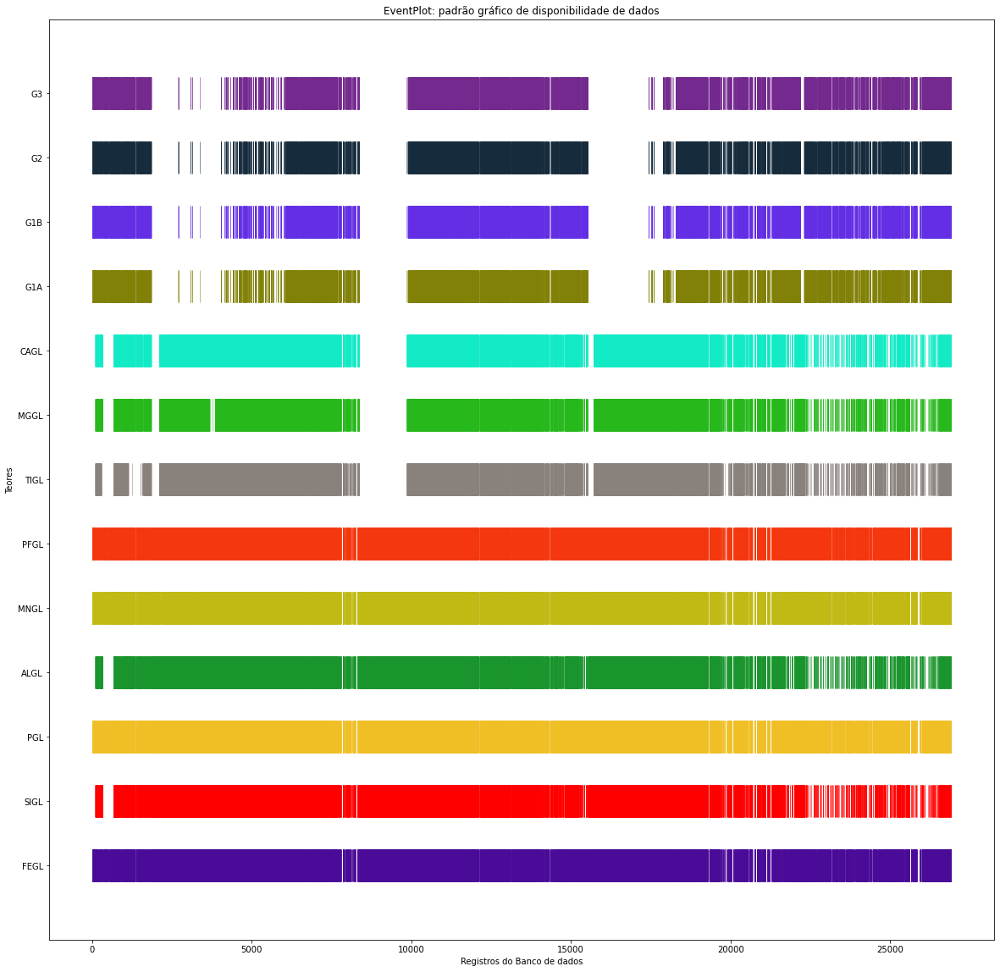

In [108]:
fig = plt.figure(figsize=(20,20))  # sets the window to 8 x 6 inches
valid = []
for t in param_event:
    valid.append(df_event.index[pd.notna(df_event[t])])

plt.eventplot(valid, color=mycolors, linelengths = 0.5, linewidth = 0.5)

plt.title('EventPlot: padrão gráfico de disponibilidade de dados')
plt.yticks(ticks, param_event)
plt.xlabel('Registros do Banco de dados')
plt.ylabel('Teores')
plt.show()

fig.savefig(proj+'_eventplot_data_available.jpeg', transparent=None)

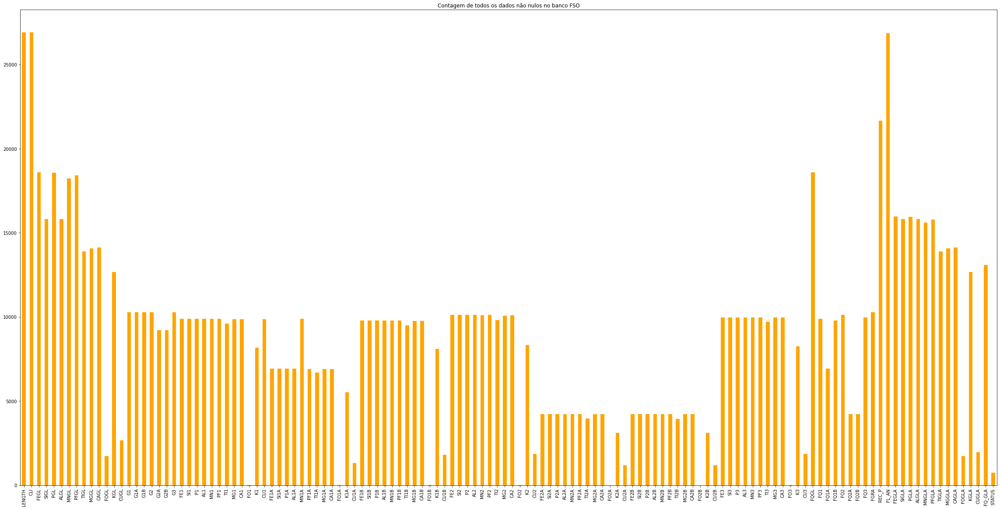

In [109]:
fig = plt.figure(figsize=(40,20)) 

plt.title('Contagem de todos os dados não nulos no banco FSO')
fso.loc[:, ~fso.columns.isin(not_countable)].count().plot.bar(color='orange')
fig.savefig(proj+'_teores_total_counts.jpeg', transparent=None)

In [110]:
fso.CLI.unique()

array(['CE', 'HC', 'MD', 'HF', 'CQ', 'SR', 'MSD', 'AT', 'MS', 'HMN', 'DT',
       'FMN', 'JP', 'CGL'], dtype=object)

In [111]:
fso.columns

Index(['FURO', 'NA', 'DE', 'ATE', 'LENGTH', 'CLV', 'CLM', 'CLI', 'FEGL',
       'SIGL',
       ...
       'MNGLA', 'PFGLA', 'TIGLA', 'MGGLA', 'CAGLA', 'FOGLA', 'KGLA', 'CUGLA',
       'FQ_GLA', 'STATUS'],
      dtype='object', length=136)

In [112]:
fso.head()

,FURO,NA,DE,ATE,LENGTH,CLV,CLM,CLI,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FOGL,KGL,CUGL,G1,G1A,G1B,G2,G2A,G2B,G3,FE1,SI1,P1,AL1,MN1,PF1,TI1,MG1,CA1,FO1,K1,CU1,FE1A,SI1A,P1A,AL1A,MN1A,PF1A,TI1A,MG1A,CA1A,FO1A,K1A,CU1A,FE1B,SI1B,P1B,AL1B,MN1B,PF1B,TI1B,MG1B,CA1B,FO1B,K1B,CU1B,FE2,SI2,P2,AL2,MN2,PF2,TI2,MG2,CA2,FO2,K2,CU2,FE2A,SI2A,P2A,AL2A,MN2A,PF2A,TI2A,MG2A,CA2A,FO2A,K2A,CU2A,FE2B,SI2B,P2B,AL2B,MN2B,PF2B,TI2B,MG2B,CA2B,FO2B,K2B,CU2B,FE3,SI3,P3,AL3,MN3,PF3,TI3,MG3,CA3,FO3,K3,CU3,FQGL,FQ1,FQ1A,FQ1B,FQ2,FQ2A,FQ2B,FQ3,FGRA,REC_P,FL_AN,FEGLA,SIGLA,PGLA,ALGLA,MNGLA,PFGLA,TIGLA,MGGLA,CAGLA,FOGLA,KGLA,CUGLA,FQ_GLA,STATUS
0,FRN5E-0092,FRN5E-0092-001,0.00,12.60,12.60,CM,CE,CE,65.91,NaN,0.12,NaN,0.03,4.49,NaN,NaN,NaN,NaN,NaN,NaN,82.29,67.16,15.13,16.88,NaN,NaN,0.68,65.84,0.34,0.12,1.18,0.03,4.60,0.13,0.003,0.001,NaN,NaN,0.001,65.80,0.34,0.12,1.21,0.03,4.65,0.14,0.003,0.001,NaN,NaN,NaN,66.05,0.36,0.12,1.03,0.03,4.37,0.12,0.004,0.001,NaN,NaN,NaN,66.37,0.37,0.11,0.95,0.02,3.88,0.11,0.002,0.003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,62.34,1.27,0.20,1.77,0.08,6.95,0.25,0.020,0.02,NaN,NaN,NaN,100.70,100.74,100.77,100.65,100.49,NaN,NaN,99.98,99.86,NaN,TPCP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,FRN5E-0092,FRN5E-0092-002,12.60,18.65,6.05,HD,HC,HC,66.96,NaN,0.11,NaN,0.02,2.81,NaN,NaN,NaN,NaN,NaN,NaN,82.57,71.79,10.78,16.67,NaN,NaN,0.56,66.95,0.32,0.11,0.67,0.02,2.83,0.07,0.002,0.002,NaN,NaN,0.002,66.96,0.31,0.11,0.65,0.02,2.77,0.07,0.002,0.002,NaN,NaN,NaN,66.88,0.33,0.12,0.77,0.02,3.26,0.08,0.004,0.003,NaN,NaN,NaN,67.17,0.33,0.11,0.69,0.02,2.57,0.08,0.004,0.008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63.57,0.76,0.23,1.39,0.04,6.06,0.23,0.010,0.06,NaN,NaN,NaN,99.94,99.92,99.85,100.38,100.00,NaN,NaN,99.99,99.82,NaN,TPCP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,FRN5E-0092,FRN5E-0092-003,18.65,26.15,7.50,HM,HC,HC,67.32,NaN,0.07,NaN,0.03,2.04,NaN,NaN,NaN,NaN,NaN,NaN,63.66,55.53,8.13,33.49,NaN,NaN,2.69,67.10,0.27,0.08,0.67,0.03,2.20,0.10,0.002,0.004,NaN,NaN,0.004,67.09,0.27,0.08,0.68,0.03,2.23,0.09,0.002,0.004,NaN,NaN,NaN,67.18,0.30,0.06,0.64,0.04,2.03,0.17,0.004,0.008,NaN,NaN,NaN,67.89,0.31,0.05,0.61,0.03,1.66,0.16,0.003,0.010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65.55,0.58,0.10,0.97,0.05,3.19,1.16,0.008,0.06,NaN,NaN,NaN,99.64,99.44,99.45,99.40,99.99,NaN,NaN,99.99,99.84,NaN,TPCP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,FRN5E-0092,FRN5E-0092-004,26.15,33.65,7.50,HM,HC,HC,64.78,NaN,0.12,NaN,0.03,4.20,NaN,NaN,NaN,NaN,NaN,NaN,73.88,60.94,12.94,24.27,NaN,NaN,1.70,65.58,0.41,0.11,1.48,0.03,3.61,0.12,0.004,0.004,NaN,NaN,0.004,65.91,0.36,0.11,1.25,0.03,3.42,0.11,0.003,0.004,NaN,NaN,NaN,64.07,0.65,0.12,2.56,0.03,4.53,0.19,0.010,0.006,NaN,NaN,NaN,62.90,0.61,0.13,3.55,0.04,5.62,0.25,0.010,0.010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56.95,1.07,0.24,6.59,0.09,9.30,0.86,0.030,0.04,NaN,NaN,NaN,99.88,99.72,99.69,99.88,100.35,NaN,NaN,99.99,99.85,NaN,TPCP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,FRN5E-0092,FRN5E-0092-005,33.65,42.10,8.45,MBT,MBT,MD,56.91,NaN,0.17,NaN,0.10,9.35,NaN,NaN,NaN,NaN,NaN,NaN,40.64,22.57,18.07,51.04,NaN,NaN,8.23,61.47,0.54,0.16,4.30,0.05,6.99,0.32,0.010,0.005,NaN,NaN,0.005,62.89,0.51,0.16,3.28,0.05,6.24,0.29,0.010,0.004,NaN,NaN,NaN,59.71,0.58,0.16,5.59,0.07,7.93,0.37,0.020,0.006,NaN,NaN,NaN,54.23,0.76,0.17,10.66,0.12,10.56,0.60,0.030,0.010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.04,1.41,0.28,9.59,0.23,13.55,1.39,0.040,0.06,NaN,NaN,NaN,100.57,100.53,100.68,100.33,100.71,NaN,NaN,99.98,99.92,NaN,TPCP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [113]:
df_box=fso.filter(fso.columns[5:20])
df_box.head()

,CLV,CLM,CLI,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FOGL,KGL,CUGL
0,CM,CE,CE,65.91,NaN,0.12,NaN,0.03,4.49,NaN,NaN,NaN,NaN,NaN,NaN
1,HD,HC,HC,66.96,NaN,0.11,NaN,0.02,2.81,NaN,NaN,NaN,NaN,NaN,NaN
2,HM,HC,HC,67.32,NaN,0.07,NaN,0.03,2.04,NaN,NaN,NaN,NaN,NaN,NaN
3,HM,HC,HC,64.78,NaN,0.12,NaN,0.03,4.20,NaN,NaN,NaN,NaN,NaN,NaN
4,MBT,MBT,MD,56.91,NaN,0.17,NaN,0.10,9.35,NaN,NaN,NaN,NaN,NaN,NaN


In [114]:
#df_box = fso.loc[0:, 'CLV':'G3']

In [115]:
df_box2 = df_box[~df_box['CLI'].isin(['SR', 'AT', 'DT'])]

In [116]:
df_box3 = df_box[df_box['CLI'].isin(['CE', 'HF','HC', 'FMN', 'HMN', 'JP'])]

In [117]:
model_rocks

['CQ', 'CE', 'HC', 'HF', 'HMN', 'FMN', 'JP', 'MS', 'MSD', 'MD', 'CGL']

In [118]:
df_box4 = df_box[df_box['CLI'].isin(model_rocks)]

In [119]:
df_box3.shape

(18599, 15)

In [120]:
df_ff = df_box[df_box['CLI'].isin(['CE', 'HF','HC', 'FMN', 'HMN', 'JP'])]

In [121]:
df_ff.FEGL.count()

16827

In [122]:
df_maf = df_box[df_box['CLI'].isin(['MS', 'MSD', 'MD'])].copy()
df_maf.head()

,CLV,CLM,CLI,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FOGL,KGL,CUGL
4,MBT,MBT,MD,56.91,NaN,0.17,NaN,0.10,9.35,NaN,NaN,NaN,NaN,NaN,NaN
5,MD,MD,MD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18,MD,MD,MD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25,MBT,MBT,MD,52.66,NaN,0.22,NaN,0.27,9.72,NaN,NaN,NaN,NaN,NaN,NaN
26,MD,MD,MD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [123]:
df_ms= df_box[df_box['CLI'].isin(['MS'])].copy()
df_ms.head()

,CLV,CLM,CLI,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FOGL,KGL,CUGL
113,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
117,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
159,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
160,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
163,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


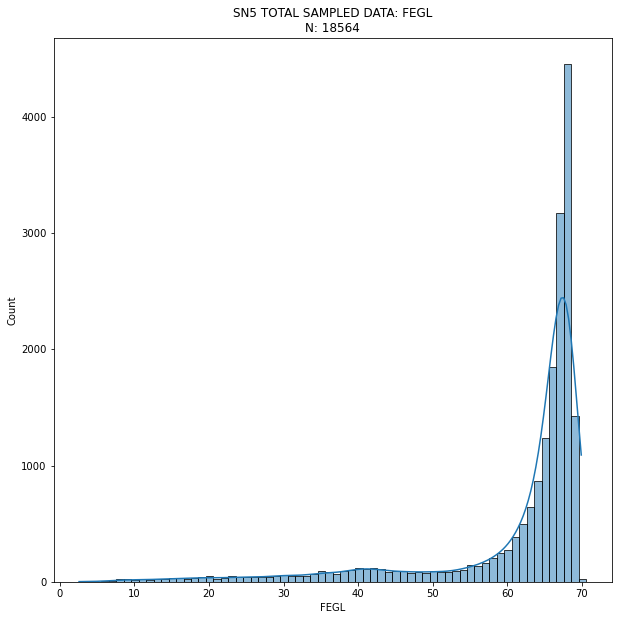

In [124]:
fig, ax = plt.subplots(figsize=chart_size)
grade = 'FEGL'
df=df_box2
kde = sea.histplot(data=df[grade],binwidth=1,kde=True)
kde.set_title(proj + ' TOTAL SAMPLED DATA: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_ALL_SAMPLES.jpeg', transparent=None)
plt.show()

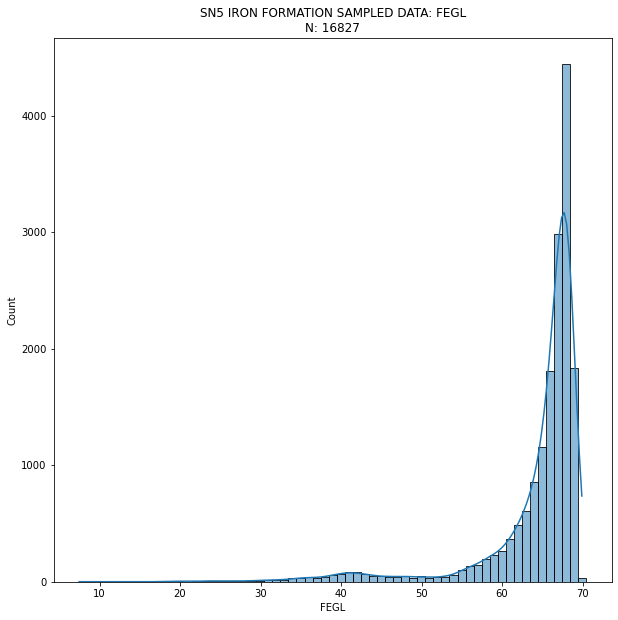

In [125]:
fig, ax = plt.subplots(figsize=chart_size)
grade = 'FEGL'
df=df_ff
kde = sea.histplot(data=df[grade],binwidth=1,kde=True)
kde.set_title(proj + ' IRON FORMATION SAMPLED DATA: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_IRON_FORMATION_SAMPLES.jpeg', transparent=None)
plt.show()

C:\DADOS\CONDA3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\DADOS\CONDA3\lib\site-packages\seaborn\distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


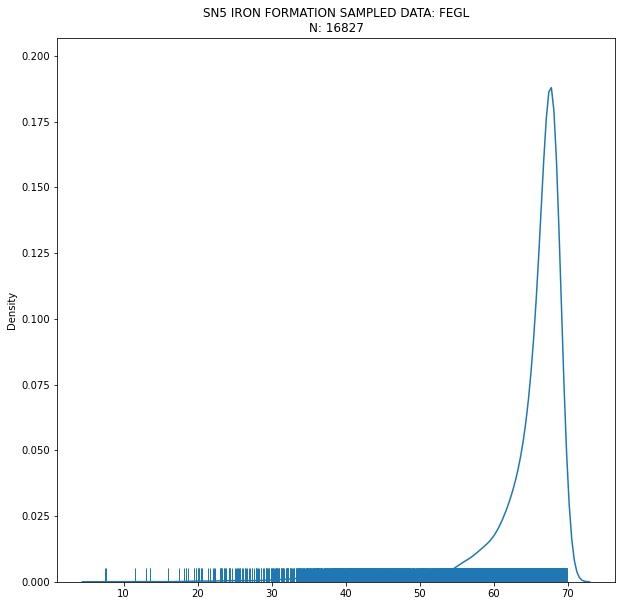

In [126]:
fig, ax = plt.subplots(figsize=chart_size)
grade = 'FEGL'
df=df_ff
kde = sea.distplot(x=df[grade],kde=True, hist=False, rug=True)
kde.set_title(proj + ' IRON FORMATION SAMPLED DATA: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_IRON_FORMATION_SAMPLES_rug.jpeg', transparent=None)
plt.show()

## BARREN PATTERN

In [127]:
df_maf.head()

,CLV,CLM,CLI,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FOGL,KGL,CUGL
4,MBT,MBT,MD,56.91,NaN,0.17,NaN,0.10,9.35,NaN,NaN,NaN,NaN,NaN,NaN
5,MD,MD,MD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18,MD,MD,MD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25,MBT,MBT,MD,52.66,NaN,0.22,NaN,0.27,9.72,NaN,NaN,NaN,NaN,NaN,NaN
26,MD,MD,MD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


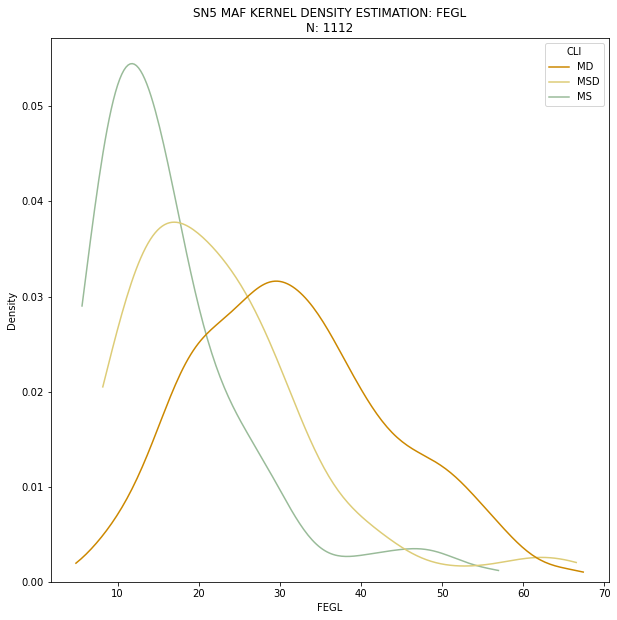

In [128]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'FEGL'
df=df_maf

kde=sea.kdeplot(data=df,x="FEGL",hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' MAF KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

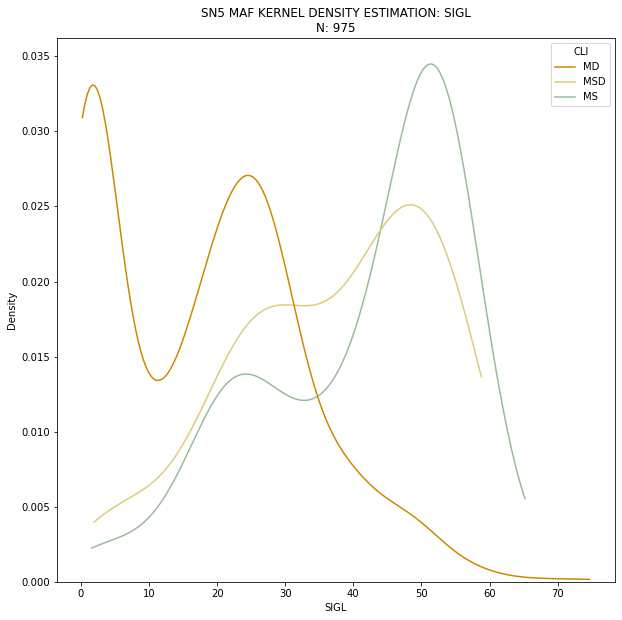

In [129]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'SIGL'
df=df_maf

kde=sea.kdeplot(data=df,x=grade,hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' MAF KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

In [130]:
#investigando primeiro pico de sílica

In [131]:
i = df_maf['SIGL'].between(15,35)

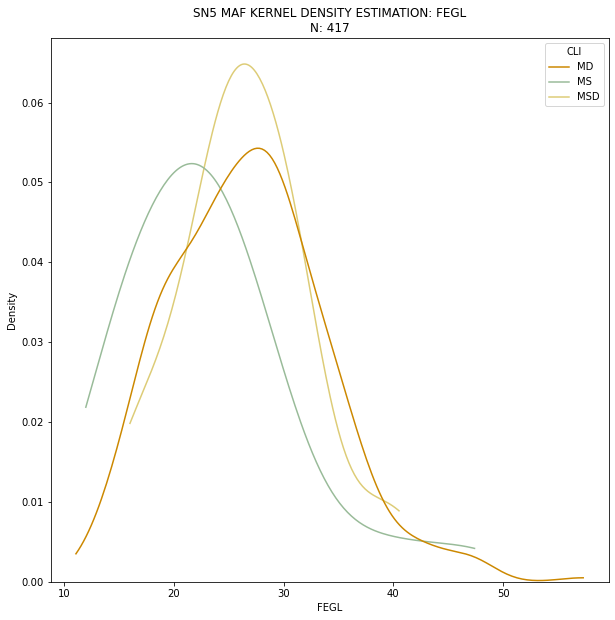

In [132]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'FEGL'
df=df_maf.loc[i,:]

kde=sea.kdeplot(data=df,x=grade,hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' MAF KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_TESTE_SIGL(20-35).jpeg', transparent=None)
plt.show()

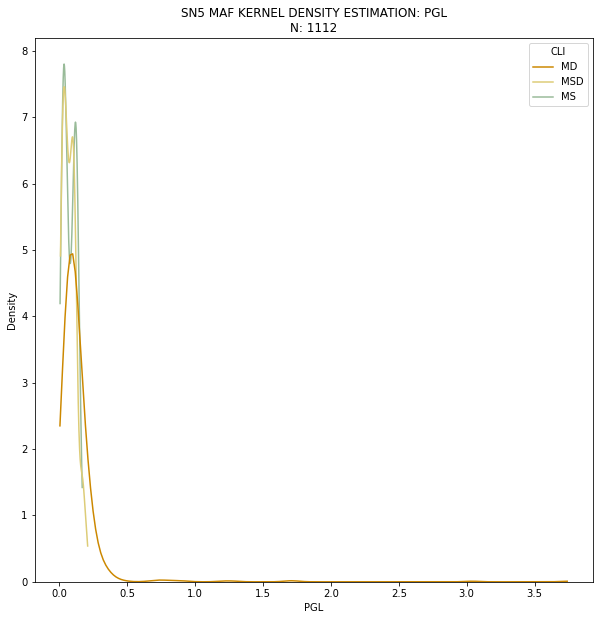

In [133]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'PGL'
df=df_maf

kde=sea.kdeplot(data=df,x=grade,hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' MAF KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

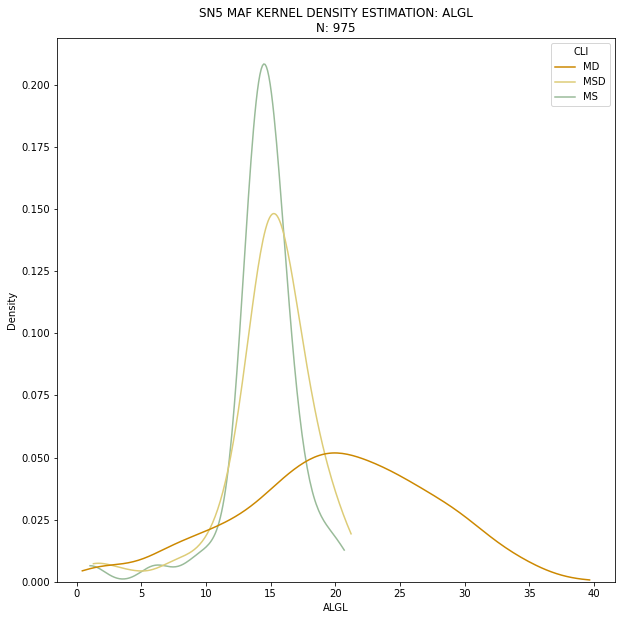

In [134]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'ALGL'
df=df_maf

kde=sea.kdeplot(data=df,x=grade,hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' MAF KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

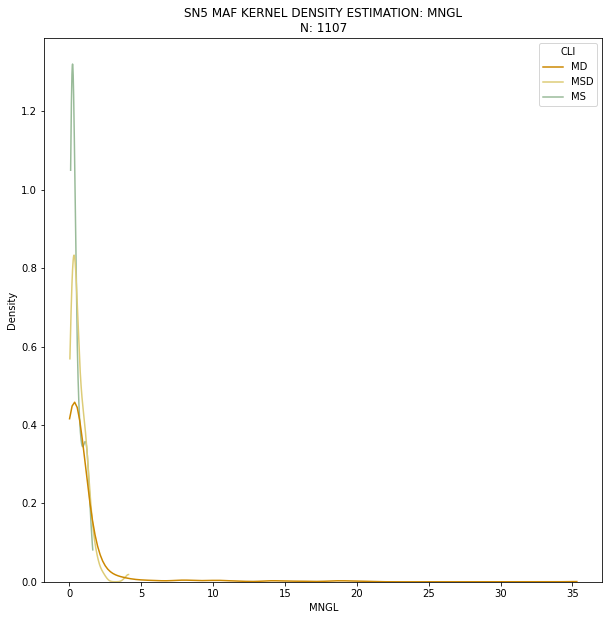

In [135]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'MNGL'
df=df_maf

kde=sea.kdeplot(data=df,x=grade,hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' MAF KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

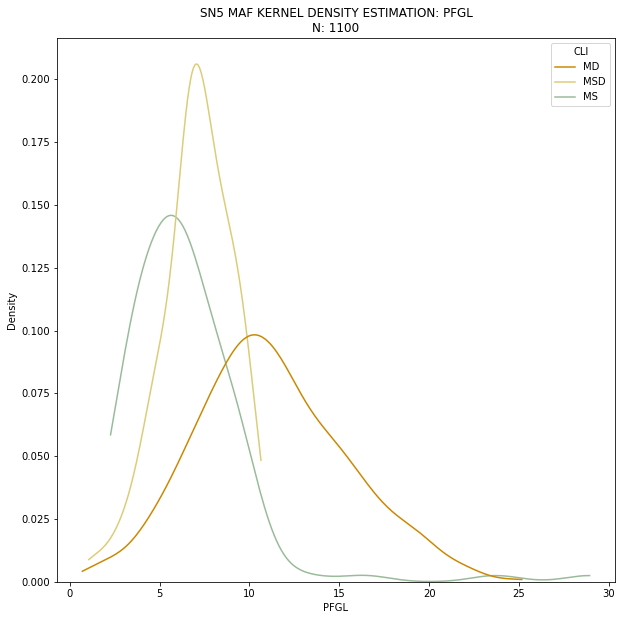

In [65]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'PFGL'
df=df_maf

kde=sea.kdeplot(data=df,x=grade,hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' MAF KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

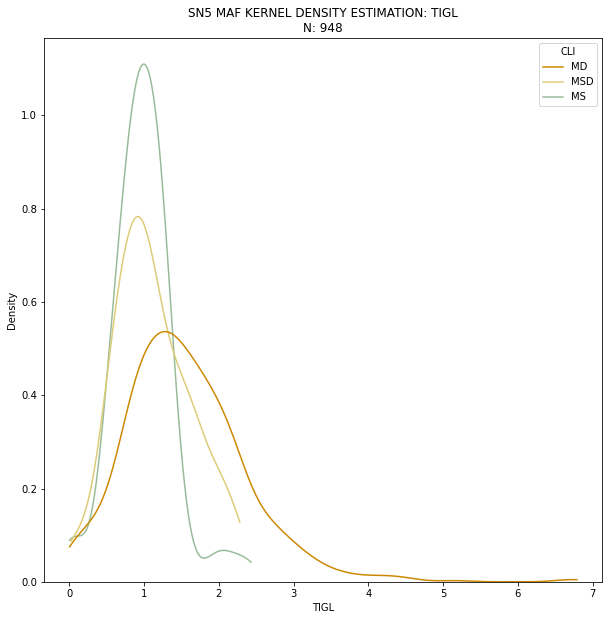

In [66]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'TIGL'
df=df_maf

kde=sea.kdeplot(data=df,x=grade,hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' MAF KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

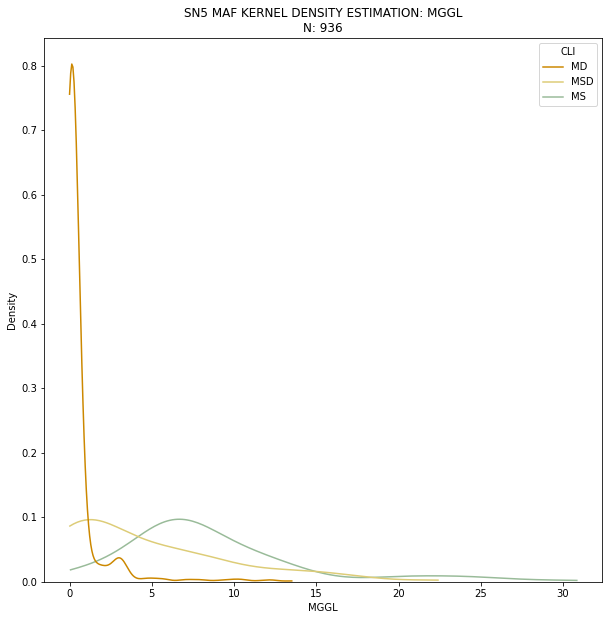

In [67]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'MGGL'
df=df_maf

kde=sea.kdeplot(data=df,x=grade,hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' MAF KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

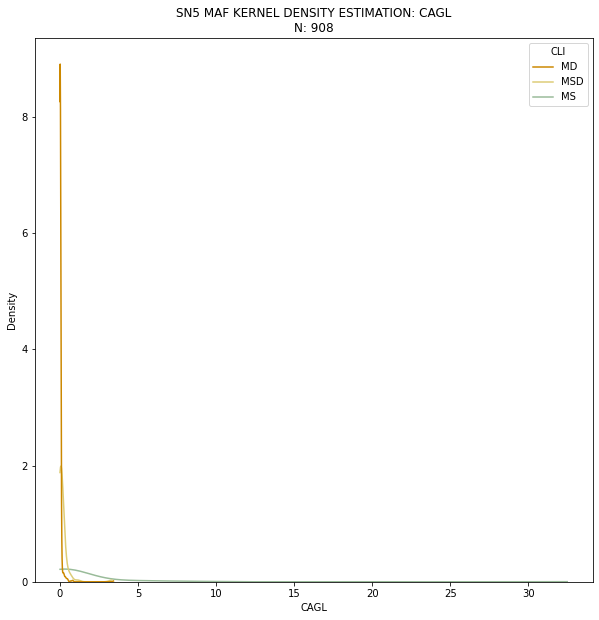

In [68]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'CAGL'
df=df_maf

kde=sea.kdeplot(data=df,x=grade,hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' MAF KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

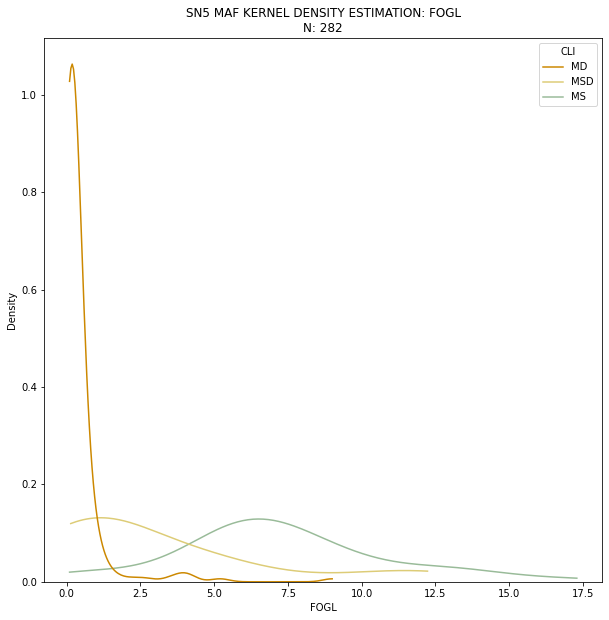

In [69]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'FOGL'
df=df_maf

kde=sea.kdeplot(data=df,x=grade,hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' MAF KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

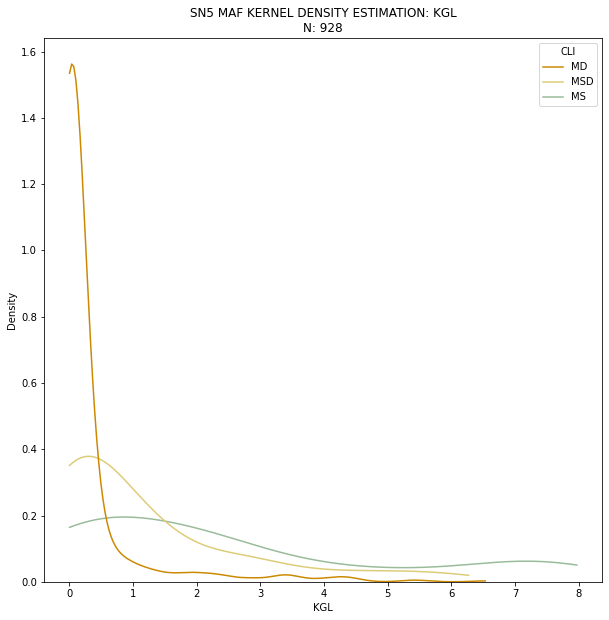

In [70]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'KGL'
df=df_maf

kde=sea.kdeplot(data=df,x=grade,hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' MAF KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

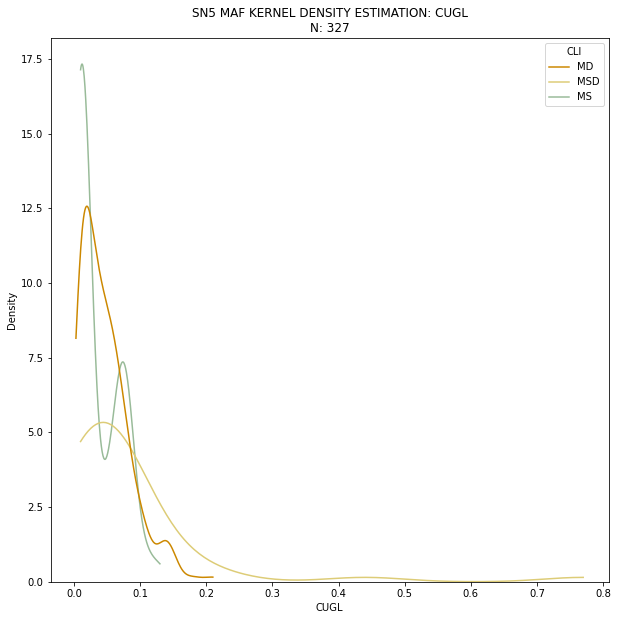

In [71]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'CUGL'
df=df_maf

kde=sea.kdeplot(data=df,x=grade,hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' MAF KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

## FE2+ ASSESSMENT

In [72]:
df_ms.head()

,CLV,CLM,CLI,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FOGL,KGL,CUGL
113,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
117,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
159,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
160,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
163,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [73]:
df_ms['FEGL2PLUS'] = df_ms['FOGL'].apply(fe_biv)
df_ms['FE2OVERFEGL'] = df_ms['FEGL2PLUS'] / df_ms['FEGL'] 

In [74]:
df_ms

,CLV,CLM,CLI,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FOGL,KGL,CUGL,FEGL2PLUS,FE2OVERFEGL
113,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
117,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
159,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
160,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
163,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
168,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
176,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
179,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
185,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
191,MS,MS,MS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


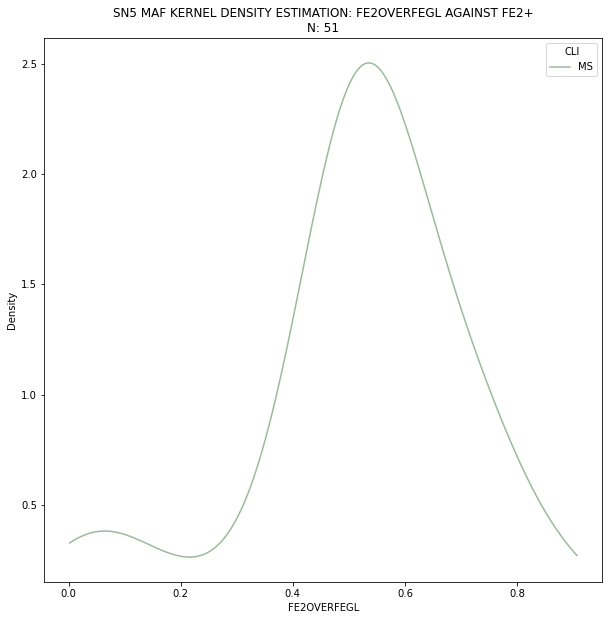

In [75]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'FE2OVERFEGL'
df=df_ms

kde=sea.kdeplot(data=df,x=grade,hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)
#kde=sea.kdeplot(data=df,x='FEGL2PLUS',hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' MAF KERNEL DENSITY ESTIMATION: '+ grade + ' AGAINST FE2+' +'\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + 'VS_FE2PLUS_KDE.jpeg', transparent=None)
plt.show()

In [3]:
# until 80% ... as we can notice, these rocks aren't magnetic (really?)...
# fe2+ as function of magnetic suscpectibility is made from someone whose mineralogy awaress is at least naive...

## IRON FORMATION

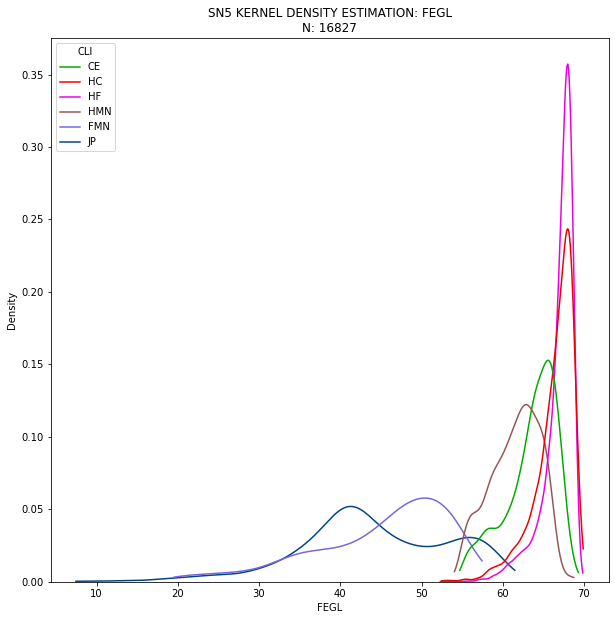

In [76]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'FEGL'
df=df_ff

kde=sea.kdeplot(data=df_ff,x="FEGL",hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()



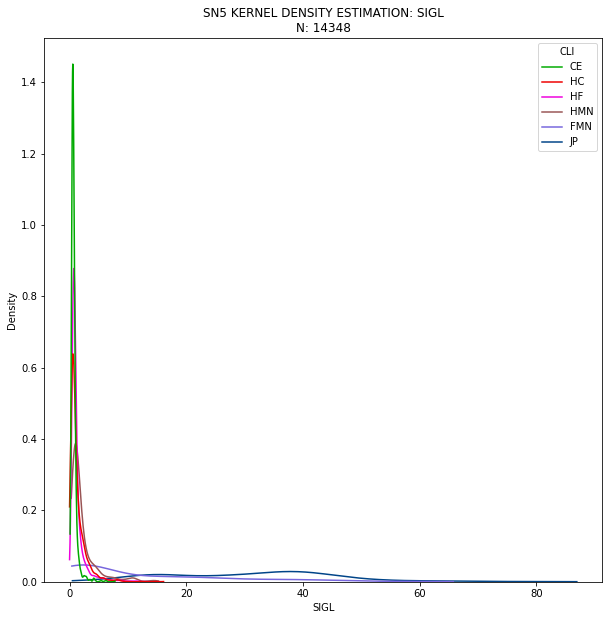

In [77]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'SIGL'
df=df_ff

kde=sea.kdeplot(data=df_ff,x=grade, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

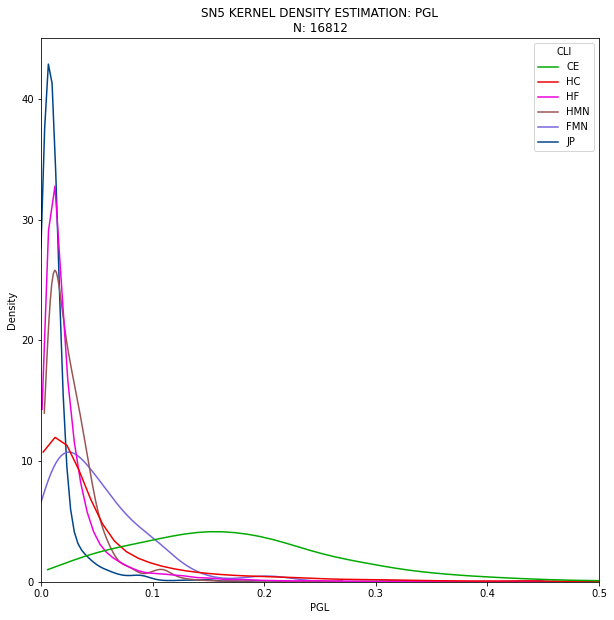

In [78]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'PGL'
df=df_ff

kde=sea.kdeplot(data=df_ff,x=grade, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

plt.xlim(0, 0.5)

kde.set_title(proj + ' KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

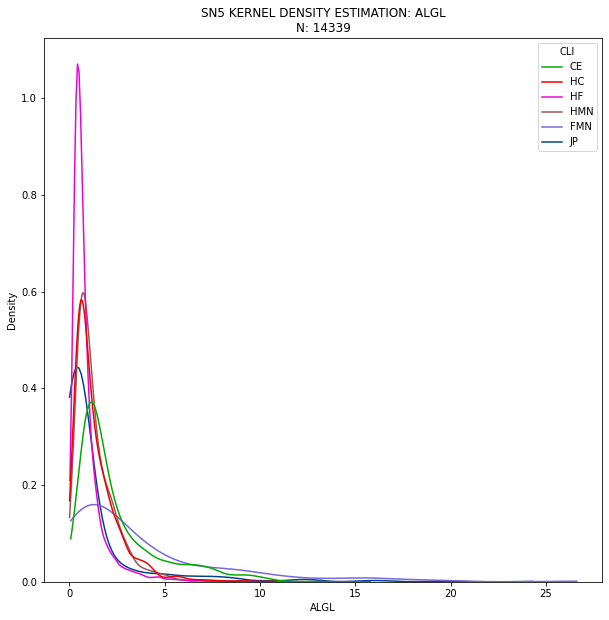

In [79]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'ALGL'
df=df_ff

kde=sea.kdeplot(data=df_ff,x=grade, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)


kde.set_title(proj + ' KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

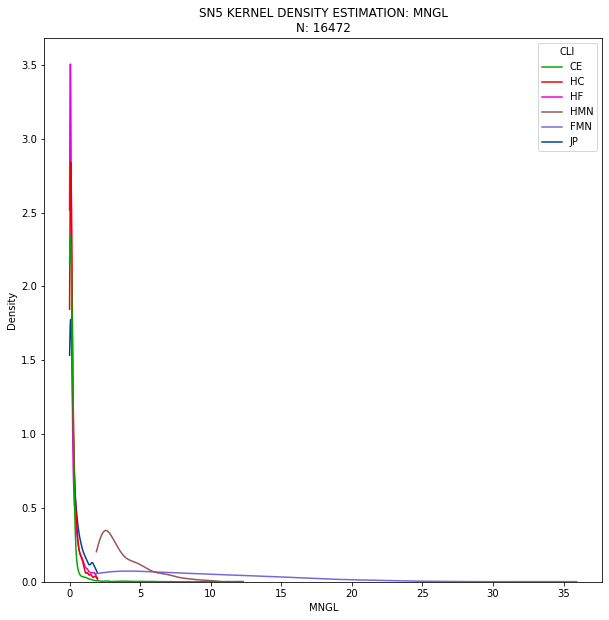

In [80]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'MNGL'
df=df_ff

kde=sea.kdeplot(data=df_ff,x=grade, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)


kde.set_title(proj + ' KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

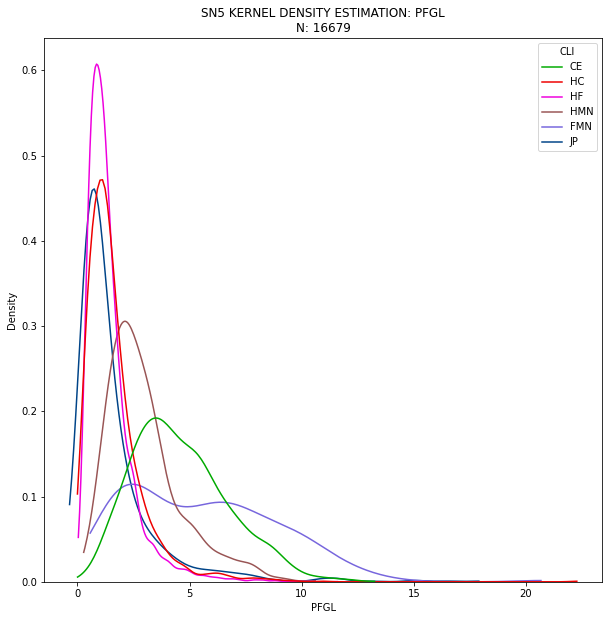

In [81]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'PFGL'
df=df_ff

kde=sea.kdeplot(data=df_ff,x=grade, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)


kde.set_title(proj + ' KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

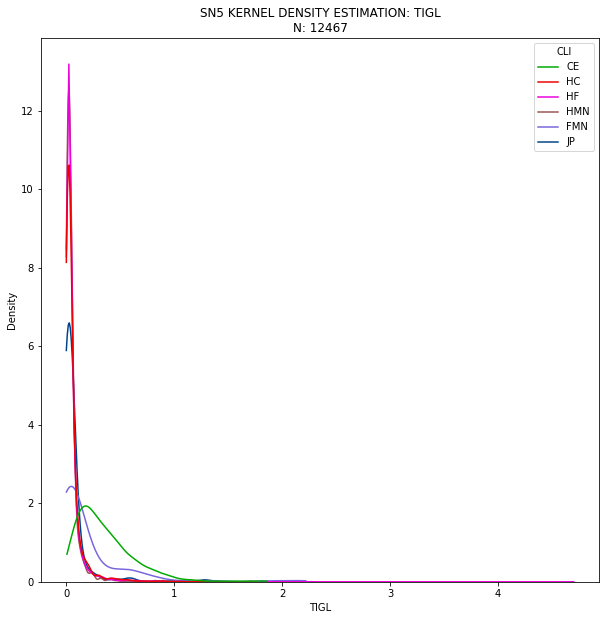

In [82]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'TIGL'
df=df_ff

kde=sea.kdeplot(data=df_ff,x=grade, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)


kde.set_title(proj + ' KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

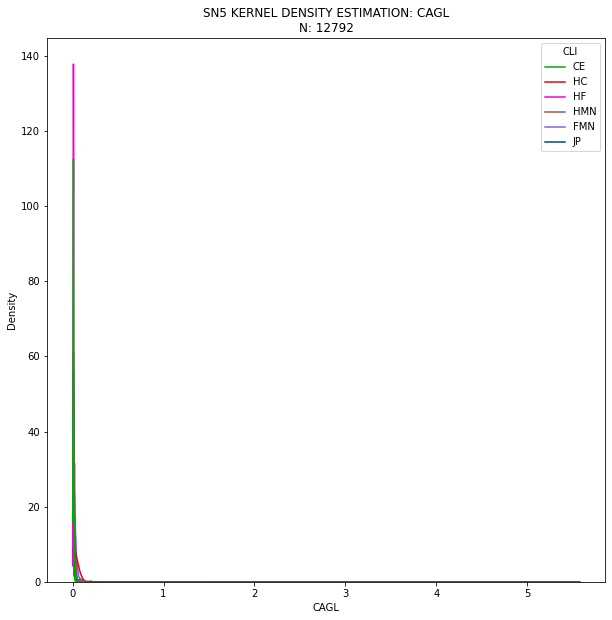

In [83]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'CAGL'
df=df_ff

kde=sea.kdeplot(data=df_ff,x=grade, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)


kde.set_title(proj + ' KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

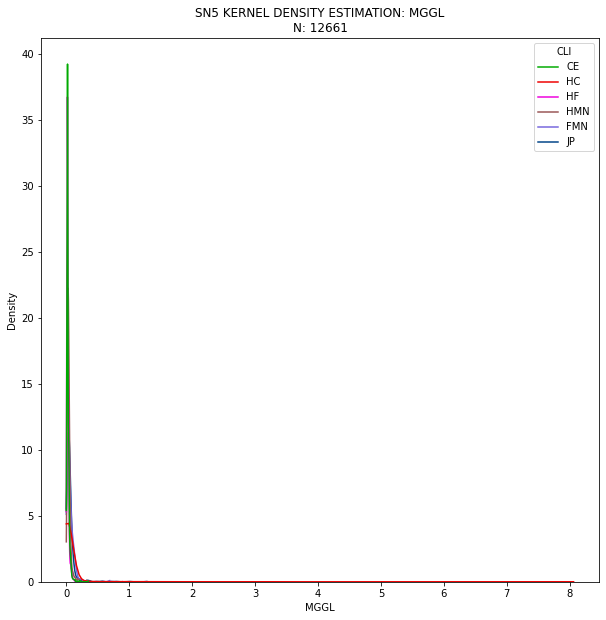

In [84]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'MGGL'
df=df_ff

kde=sea.kdeplot(data=df_ff,x=grade, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)


kde.set_title(proj + ' KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

C:\DADOS\CONDA3\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


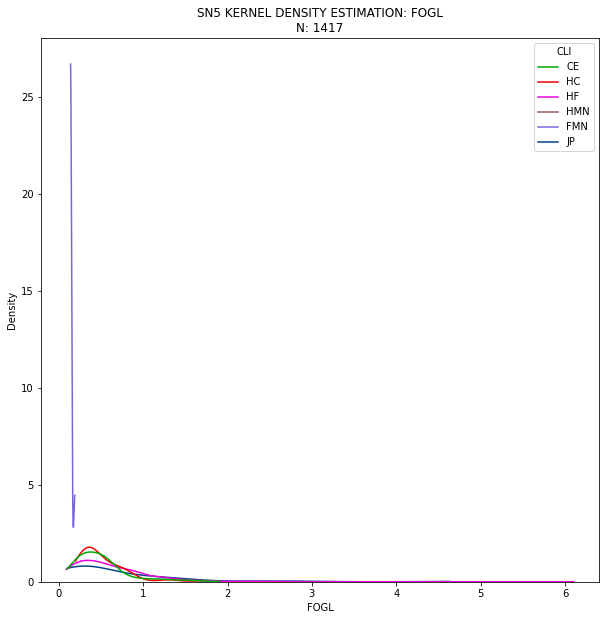

In [85]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'FOGL'
df=df_ff

kde=sea.kdeplot(data=df_ff,x=grade, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)


kde.set_title(proj + ' KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

## Creating Boxplots for all Rocks:

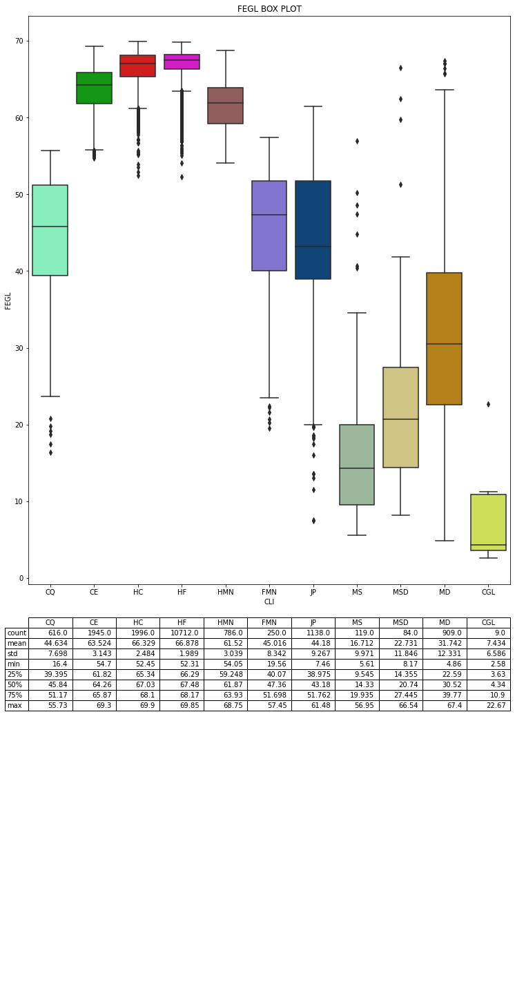

In [86]:
df = df_box4
grade = 'FEGL'
breakdown = 'CLI'
# getting data subset and creating stats table summary to attach to chart:
bp_df=df.loc[0:,[breakdown,grade] ]

gen_stats=bp_df.groupby([breakdown]).describe()

# droping multilevel useless columns
stats1=gen_stats.droplevel(0, axis=1)

# avoiding too many decimals places in summmary
stats2=stats1.round({'count':0, 'mean': 3, 'std': 3, 'min': 3, '25%':3, '50%':3, '75%':3,'max':3})

# sorting rocks according chart
stats3=stats2.loc[model_rocks]

stats4=stats3.transpose()

# second chart twice bigger in height
widths=[1,1]
heights=[1,0.5]


fig=plt.figure(constrained_layout=True, figsize=[20,20])

spec = fig.add_gridspec(nrows=2, ncols=2, width_ratios=widths, height_ratios=heights)

# creating 2 places for 2 charts (one for table summary)
graf1 = fig.add_subplot(spec[0,1])
plt.title(grade + " BOX PLOT")

graf2= fig.add_subplot(spec[1,1])

# boxploting
bp=sea.boxplot(x=breakdown, y=grade, data=df, ax= graf1, order=model_rocks, palette=litocolor)


# creating matplotlib table to attach to chart
graf2.axis("off")
tab = graf2.table(cellText=stats4.values,
                  
                  rowLabels=stats4.index,
                  colLabels=stats4.columns,
                  cellLoc = 'right', rowLoc = 'left',
                  fontsize=10,                  
                  loc='top')

tab.auto_set_font_size(False)
tab.set_fontsize(10)




plt.savefig(proj + "_" + grade +'BOXPLOT_N_SUMMARY.png')
plt.show()

In [87]:
stats2

,count,mean,std,min,25%,50%,75%,max
CLI,,,,,,,,
CE,1945.0,63.524,3.143,54.70,61.820,64.26,65.870,69.30
CGL,9.0,7.434,6.586,2.58,3.630,4.34,10.900,22.67
CQ,616.0,44.634,7.698,16.40,39.395,45.84,51.170,55.73
FMN,250.0,45.016,8.342,19.56,40.070,47.36,51.698,57.45
HC,1996.0,66.329,2.484,52.45,65.340,67.03,68.100,69.90
HF,10712.0,66.878,1.989,52.31,66.290,67.48,68.170,69.85
HMN,786.0,61.520,3.039,54.05,59.248,61.87,63.930,68.75
JP,1138.0,44.180,9.267,7.46,38.975,43.18,51.762,61.48
MD,909.0,31.742,12.331,4.86,22.590,30.52,39.770,67.40


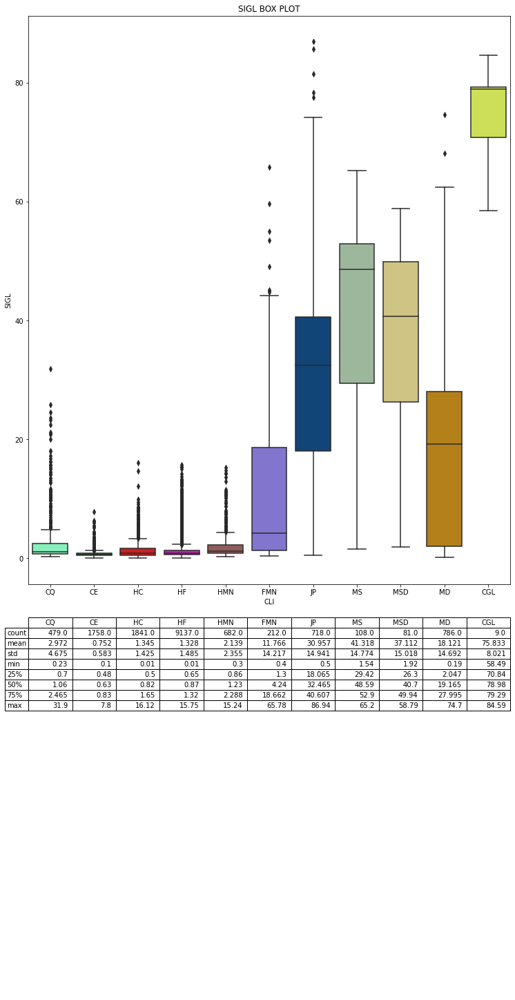

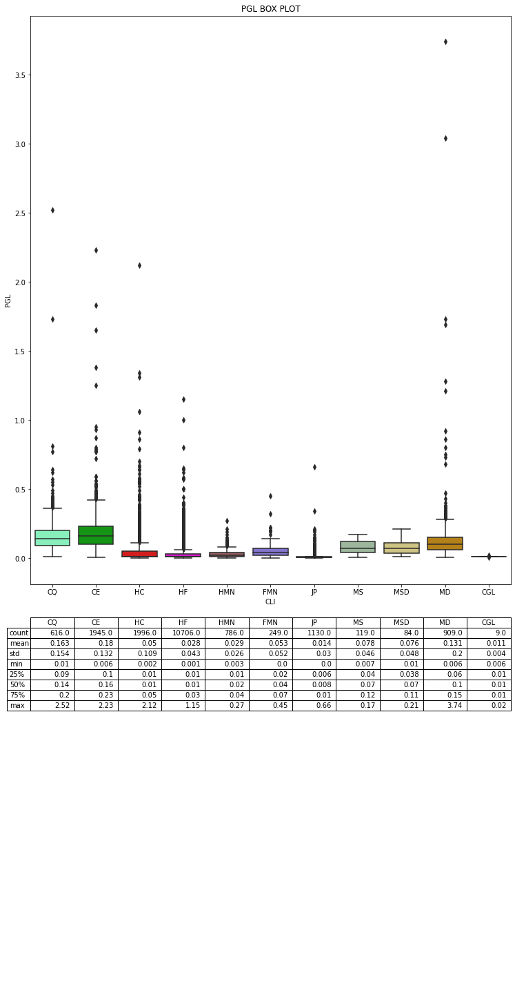

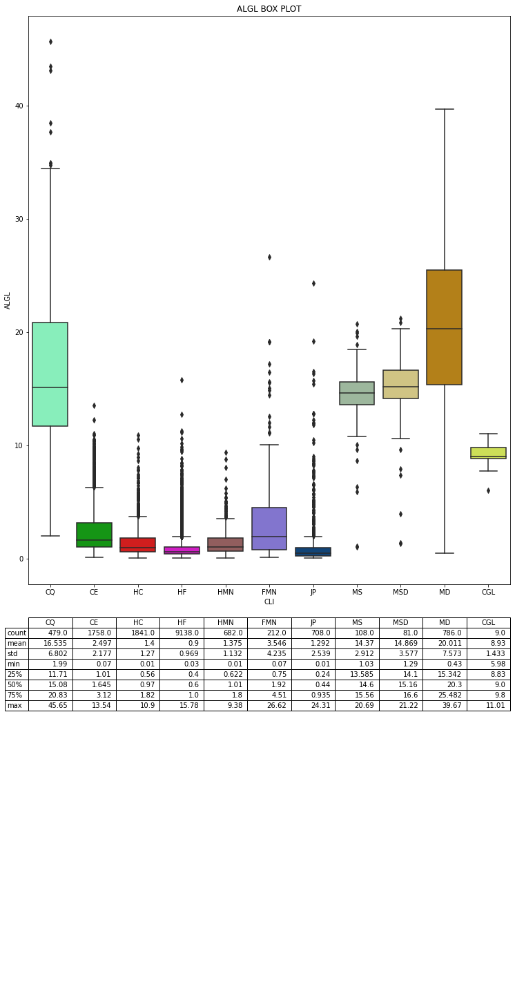

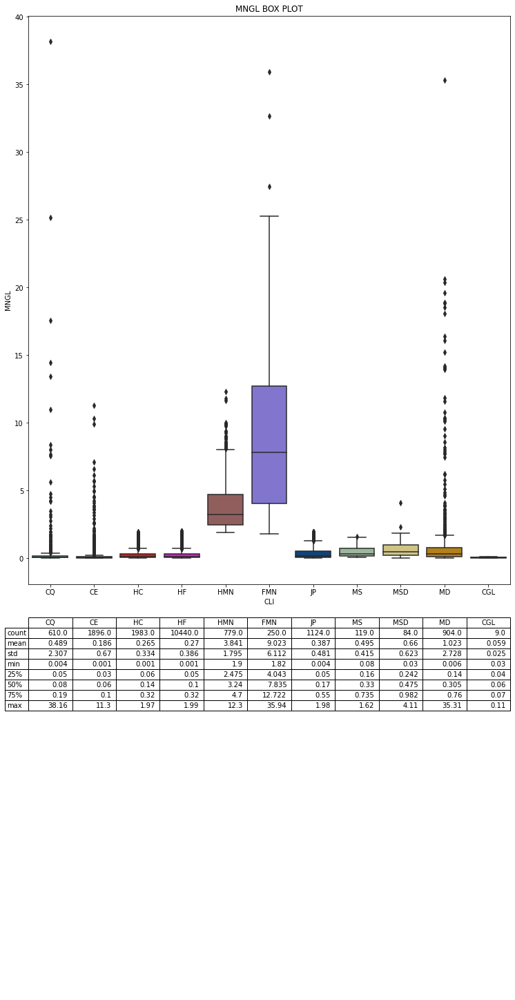

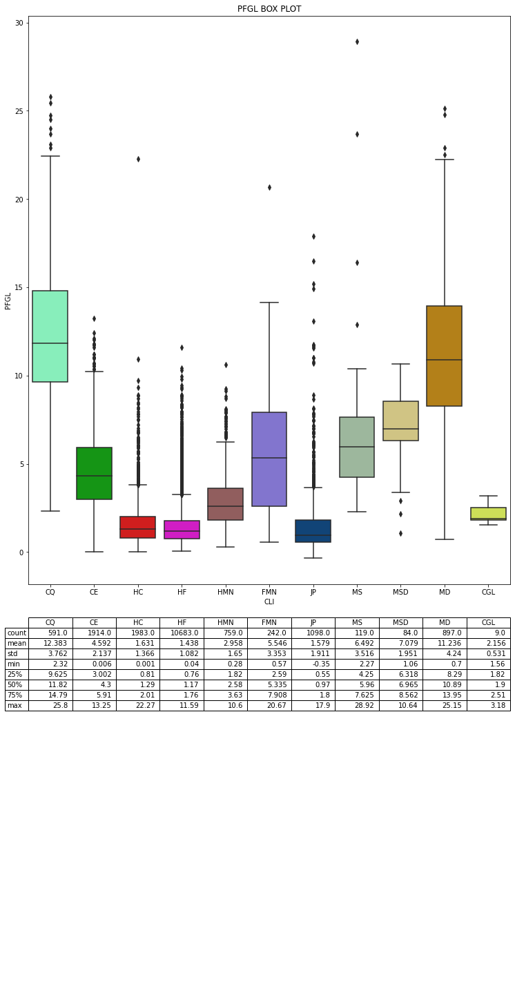

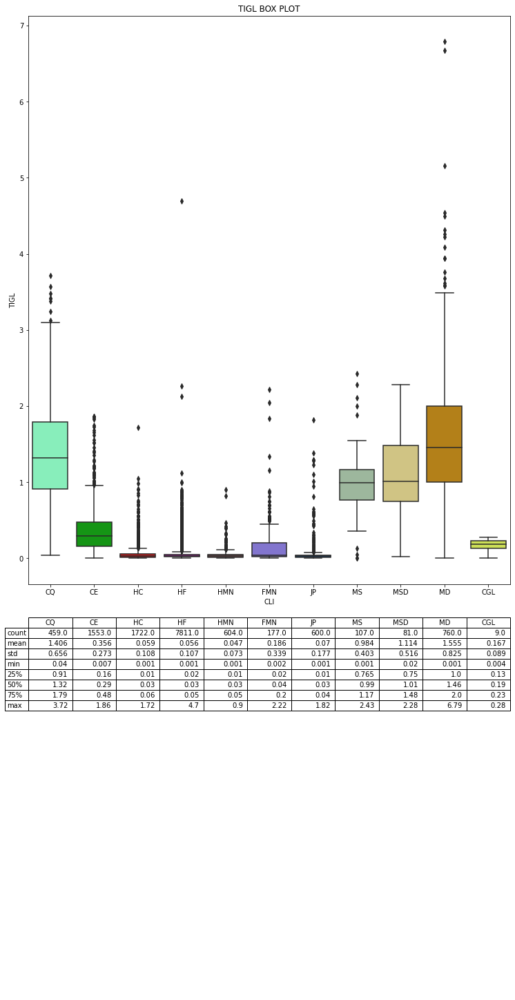

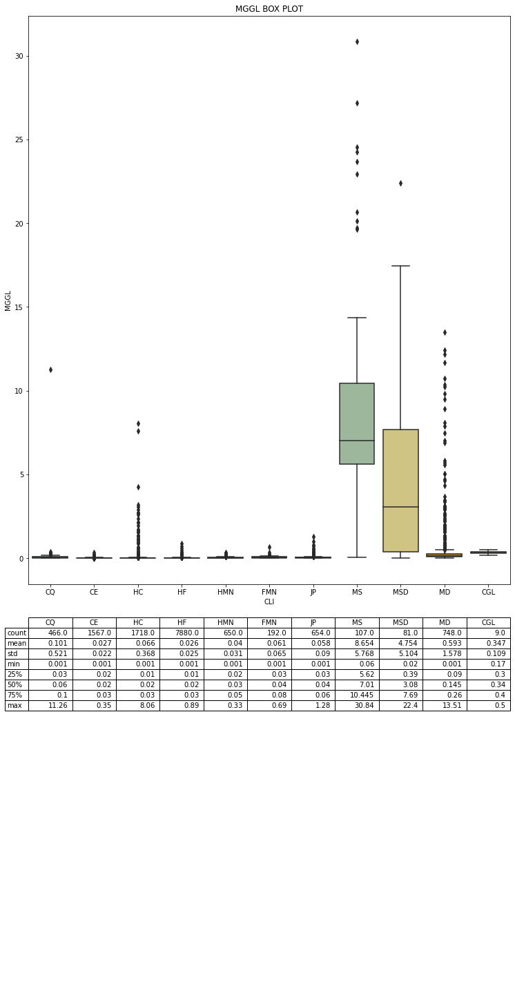

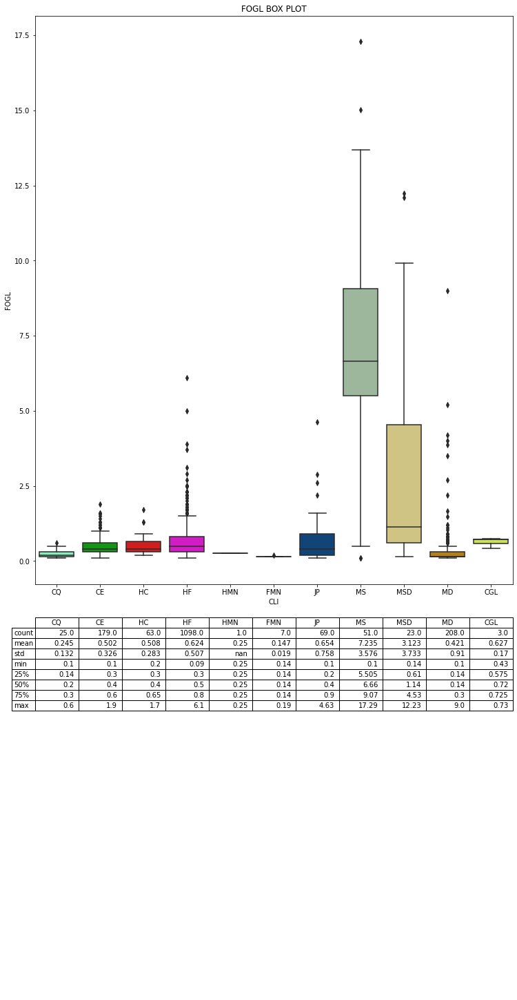

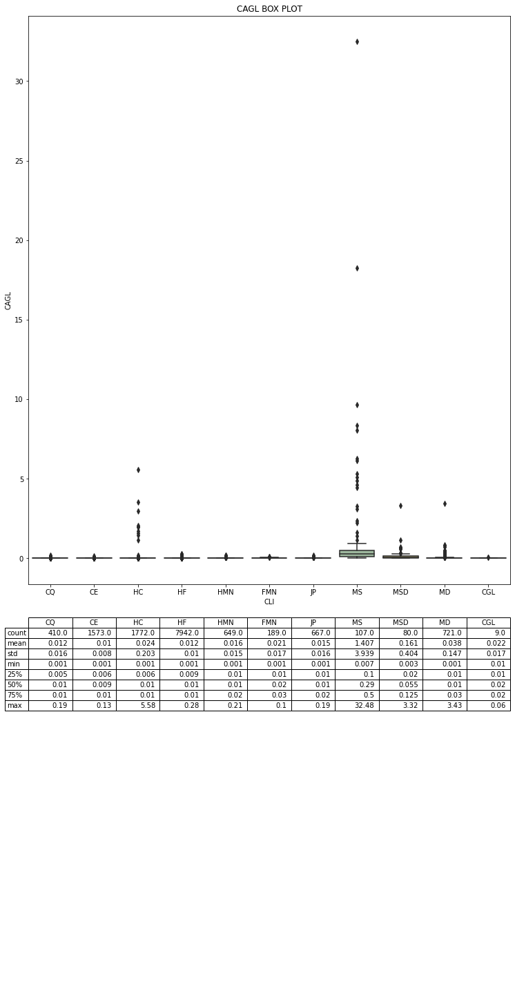

In [88]:
# repeating using other grades (SIGL, PGL, ALGL, MNGL, PFGL, TIGL, CAGL, MGGL)

other_grades = ['SIGL', 'PGL', 'ALGL', 'MNGL', 'PFGL', 'TIGL', 'MGGL', 'FOGL', 'CAGL']

for grade in other_grades:

    df = df_box4
    breakdown = 'CLI'
    # getting data subset and creating stats table summary to attach to chart:
    bp_df=df.loc[0:,[breakdown,grade] ]

    gen_stats=bp_df.groupby([breakdown]).describe()

    # droping multilevel useless columns
    stats1=gen_stats.droplevel(0, axis=1)

    # avoiding too many decimals places in summmary
    stats2=stats1.round({'count':0, 'mean': 3, 'std': 3, 'min': 3, '25%':3, '50%':3, '75%':3,'max':3})

    # sorting rocks according chart
    stats3=stats2.loc[model_rocks]

    stats4=stats3.transpose()

    # second chart twice bigger in height
    widths=[1,1]
    heights=[1,0.5]


    fig=plt.figure(constrained_layout=True, figsize=[20,20])

    spec = fig.add_gridspec(nrows=2, ncols=2, width_ratios=widths, height_ratios=heights)

    # creating 2 places for 2 charts (one for table summary)
    graf1 = fig.add_subplot(spec[0,1])
    plt.title(grade + " BOX PLOT")

    graf2= fig.add_subplot(spec[1,1])

    # boxploting
    bp=sea.boxplot(x=breakdown, y=grade, data=df, ax= graf1, order=model_rocks, palette=litocolor)


    # creating matplotlib table to attach to chart
    graf2.axis("off")
    tab = graf2.table(cellText=stats4.values,

                      rowLabels=stats4.index,
                      colLabels=stats4.columns,
                      cellLoc = 'right', rowLoc = 'left',
                      fontsize=10,                  
                      loc='top')

    tab.auto_set_font_size(False)
    tab.set_fontsize(10)




    plt.savefig(proj + "_" + grade +'BOXPLOT_N_SUMMARY.png')
    plt.show()

## Iron Formation BoxPlots

###### getting dataframe unitl G3

In [89]:
bplt_cols = ['CLV', 'CLM', 'CLI', 'FEGL', 'SIGL', 'PGL', 'ALGL', 'MNGL', 'PFGL',
       'TIGL', 'MGGL', 'CAGL', 'FOGL', 'KGL', 'CUGL', 'G1A', 'G1B', 'G2', 'G3']

In [90]:
sel_cols = fso.filter(bplt_cols)


In [91]:
sel_cols.head()

,CLV,CLM,CLI,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FOGL,KGL,CUGL,G1A,G1B,G2,G3
0,CM,CE,CE,65.91,NaN,0.12,NaN,0.03,4.49,NaN,NaN,NaN,NaN,NaN,NaN,67.16,15.13,16.88,0.68
1,HD,HC,HC,66.96,NaN,0.11,NaN,0.02,2.81,NaN,NaN,NaN,NaN,NaN,NaN,71.79,10.78,16.67,0.56
2,HM,HC,HC,67.32,NaN,0.07,NaN,0.03,2.04,NaN,NaN,NaN,NaN,NaN,NaN,55.53,8.13,33.49,2.69
3,HM,HC,HC,64.78,NaN,0.12,NaN,0.03,4.20,NaN,NaN,NaN,NaN,NaN,NaN,60.94,12.94,24.27,1.70
4,MBT,MBT,MD,56.91,NaN,0.17,NaN,0.10,9.35,NaN,NaN,NaN,NaN,NaN,NaN,22.57,18.07,51.04,8.23


###### SELECTING IRON FORMATIONS SAMPLES

In [92]:
ff_rocks

['CE', 'HF', 'HC', 'FMN', 'HMN', 'JP']

In [93]:
bplt = sel_cols[sel_cols.CLI.isin(ff_rocks)]

In [94]:
bplt.head()

,CLV,CLM,CLI,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FOGL,KGL,CUGL,G1A,G1B,G2,G3
0,CM,CE,CE,65.91,NaN,0.12,NaN,0.03,4.49,NaN,NaN,NaN,NaN,NaN,NaN,67.16,15.13,16.88,0.68
1,HD,HC,HC,66.96,NaN,0.11,NaN,0.02,2.81,NaN,NaN,NaN,NaN,NaN,NaN,71.79,10.78,16.67,0.56
2,HM,HC,HC,67.32,NaN,0.07,NaN,0.03,2.04,NaN,NaN,NaN,NaN,NaN,NaN,55.53,8.13,33.49,2.69
3,HM,HC,HC,64.78,NaN,0.12,NaN,0.03,4.20,NaN,NaN,NaN,NaN,NaN,NaN,60.94,12.94,24.27,1.70
6,HD,HC,CE,66.66,NaN,0.13,NaN,0.04,3.23,NaN,NaN,NaN,NaN,NaN,NaN,61.10,16.85,21.46,0.52


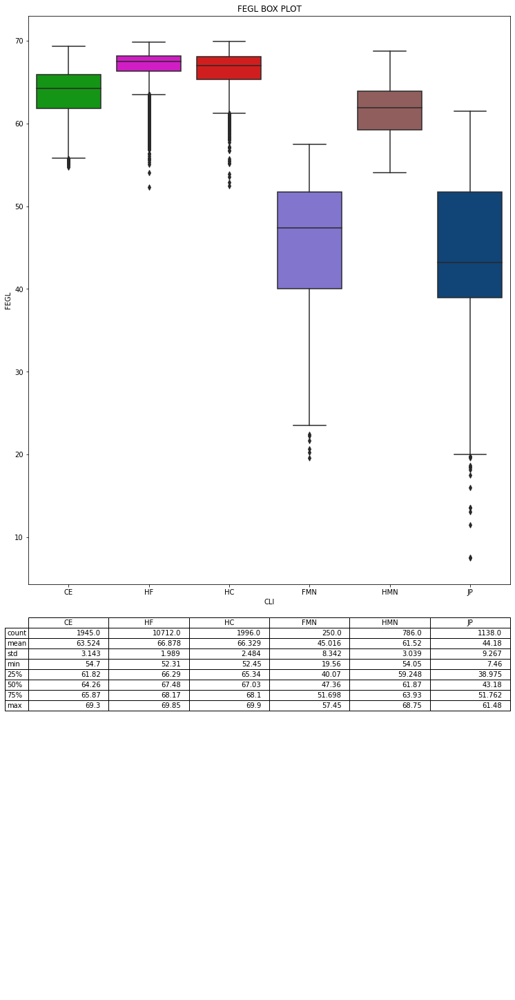

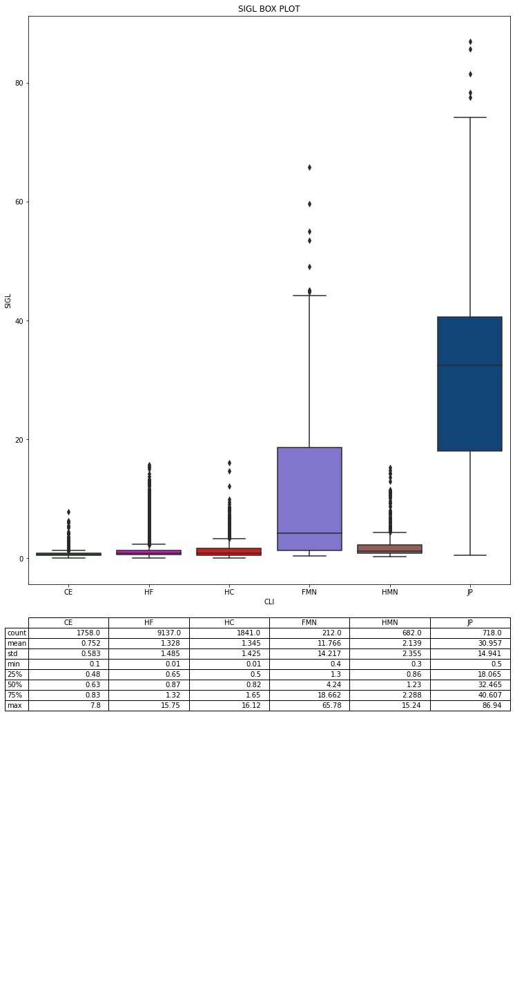

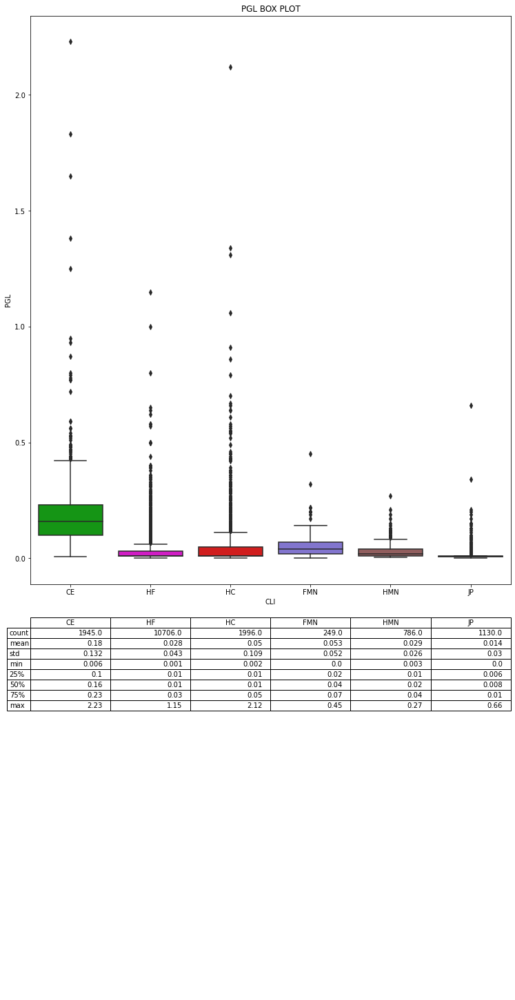

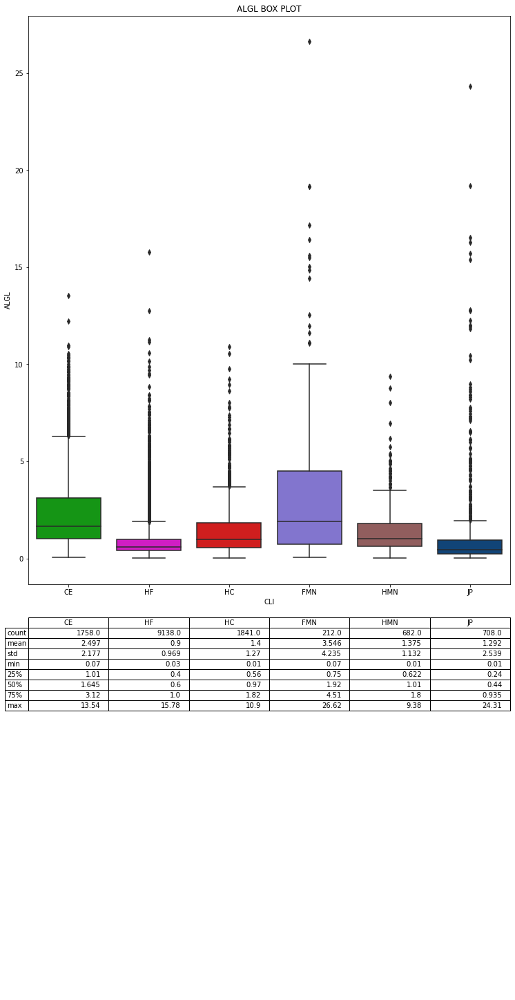

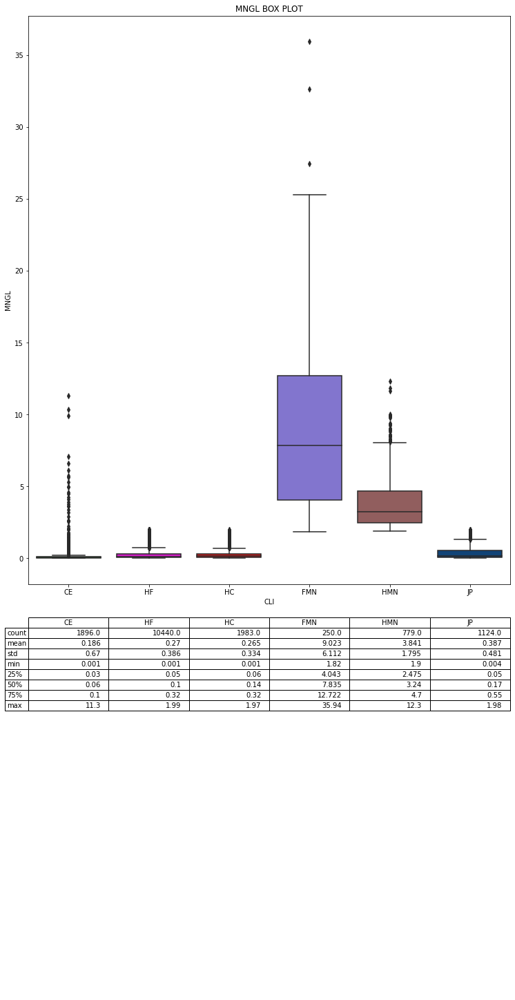

...

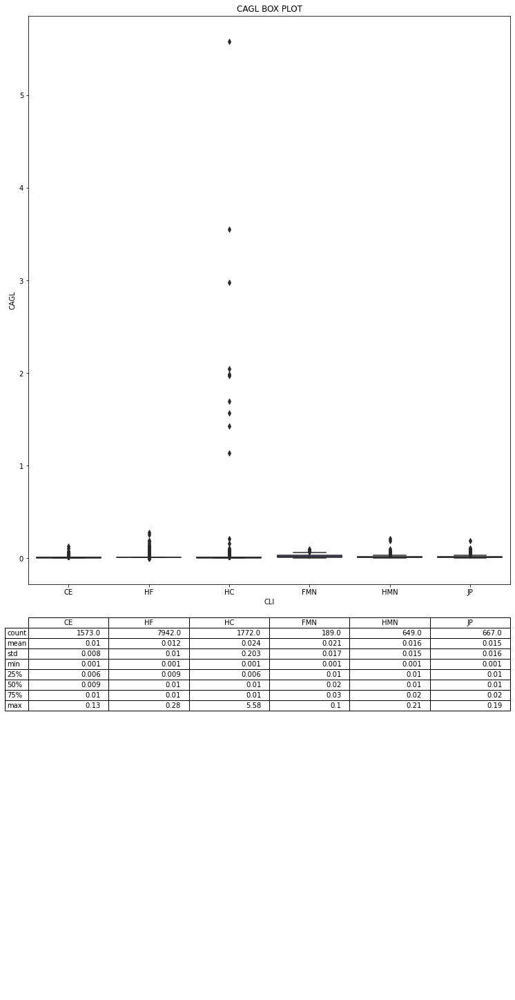

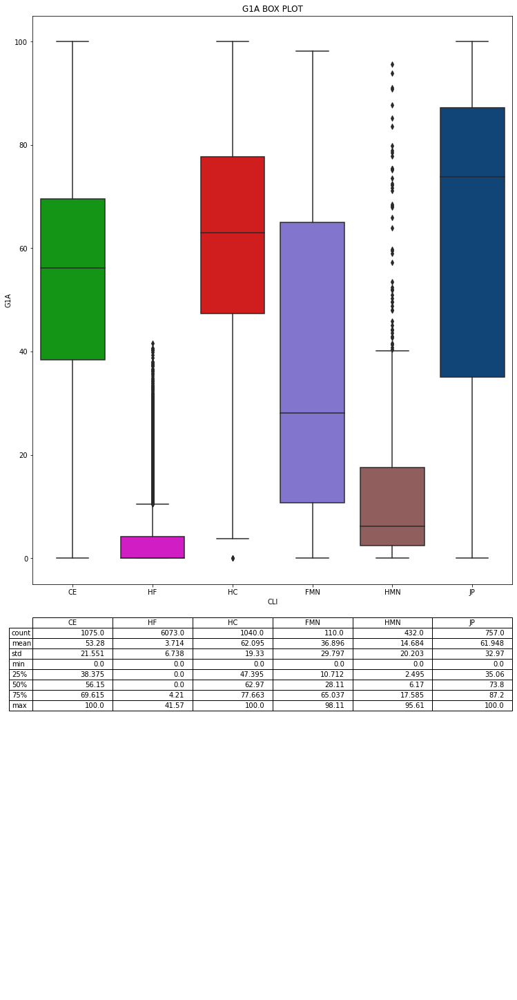

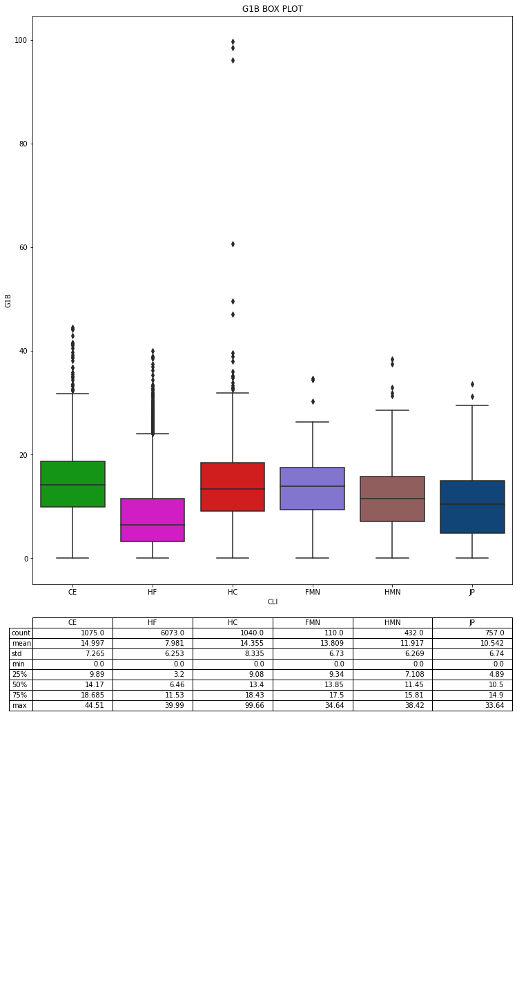

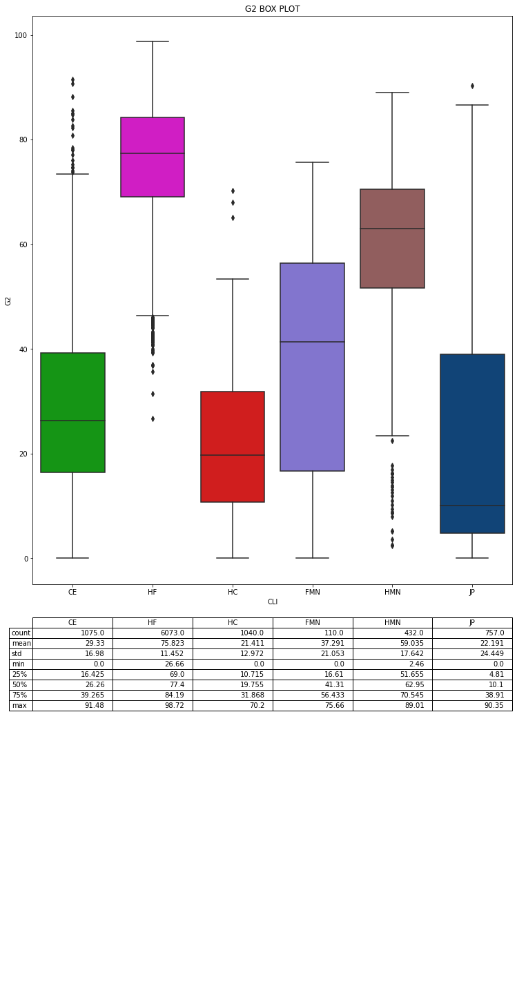

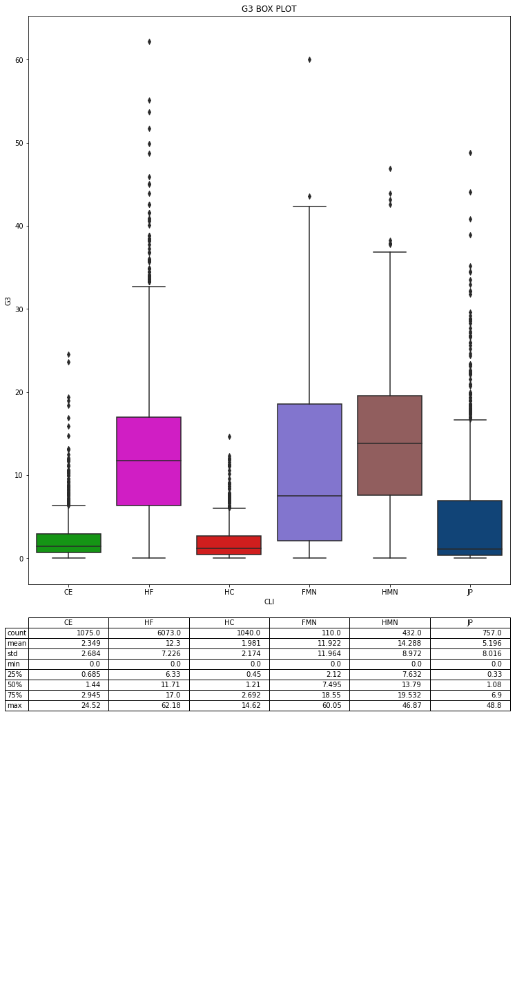

In [95]:
all_grades = ['FEGL','SIGL', 'PGL', 'ALGL', 'MNGL', 'PFGL', 'TIGL', 'MGGL', 'FOGL', 'CAGL', 'G1A', 'G1B', 'G2', 'G3']
#all_grades = ['FEGL','SIGL']

for grade in all_grades:

    df = bplt
    breakdown = 'CLI'
    # getting data subset and creating stats table summary to attach to chart:
    bp_df=df.loc[0:,[breakdown,grade] ]

    gen_stats=bp_df.groupby([breakdown]).describe()

    # droping multilevel useless columns
    stats1=gen_stats.droplevel(0, axis=1)

    # avoiding too many decimals places in summmary
    stats2=stats1.round({'count':0, 'mean': 3, 'std': 3, 'min': 3, '25%':3, '50%':3, '75%':3,'max':3})

    # sorting rocks according chart
    stats3=stats2.loc[ff_rocks]

    stats4=stats3.transpose()

    # second chart twice bigger in height
    widths=[1,1]
    heights=[1,0.5]


    fig=plt.figure(constrained_layout=True, figsize=[20,20])

    spec = fig.add_gridspec(nrows=2, ncols=2, width_ratios=widths, height_ratios=heights)

    # creating 2 places for 2 charts (one for table summary)
    graf1 = fig.add_subplot(spec[0,1])
    plt.title(grade + " BOX PLOT")

    graf2= fig.add_subplot(spec[1,1])

    # boxploting
    bp=sea.boxplot(x=breakdown, y=grade, data=df, ax= graf1, order=ff_rocks, palette=litocolor)


    # creating matplotlib table to attach to chart
    graf2.axis("off")
    tab = graf2.table(cellText=stats4.values,

                      rowLabels=stats4.index,
                      colLabels=stats4.columns,
                      cellLoc = 'right', rowLoc = 'left',
                      fontsize=10,                  
                      loc='top')

    tab.auto_set_font_size(False)
    tab.set_fontsize(10)




    plt.savefig(proj + "_" + grade +'_IRON_FORMATION_BOXPLOT_N_SUMMARY.png')
    plt.show()

## GLOBAL CORRELATIONS

In [96]:
# LAST DATAFRAME SUITS WELL

In [97]:
bplt.columns

Index(['CLV', 'CLM', 'CLI', 'FEGL', 'SIGL', 'PGL', 'ALGL', 'MNGL', 'PFGL',
       'TIGL', 'MGGL', 'CAGL', 'FOGL', 'KGL', 'CUGL', 'G1A', 'G1B', 'G2',
       'G3'],
      dtype='object')

In [98]:
# EXCLUDING ['TIGL', 'MGGL', 'CAGL', 'FOGL', 'KGL', 'CUGL']

In [99]:
df_pair = bplt.loc[:,['CLV', 'CLM', 'CLI', 'FEGL', 'SIGL', 'PGL', 'ALGL', 'MNGL', 'PFGL']].copy()

In [100]:
df_pair.head()

,CLV,CLM,CLI,FEGL,SIGL,PGL,ALGL,MNGL,PFGL
0,CM,CE,CE,65.91,NaN,0.12,NaN,0.03,4.49
1,HD,HC,HC,66.96,NaN,0.11,NaN,0.02,2.81
2,HM,HC,HC,67.32,NaN,0.07,NaN,0.03,2.04
3,HM,HC,HC,64.78,NaN,0.12,NaN,0.03,4.20
6,HD,HC,CE,66.66,NaN,0.13,NaN,0.04,3.23


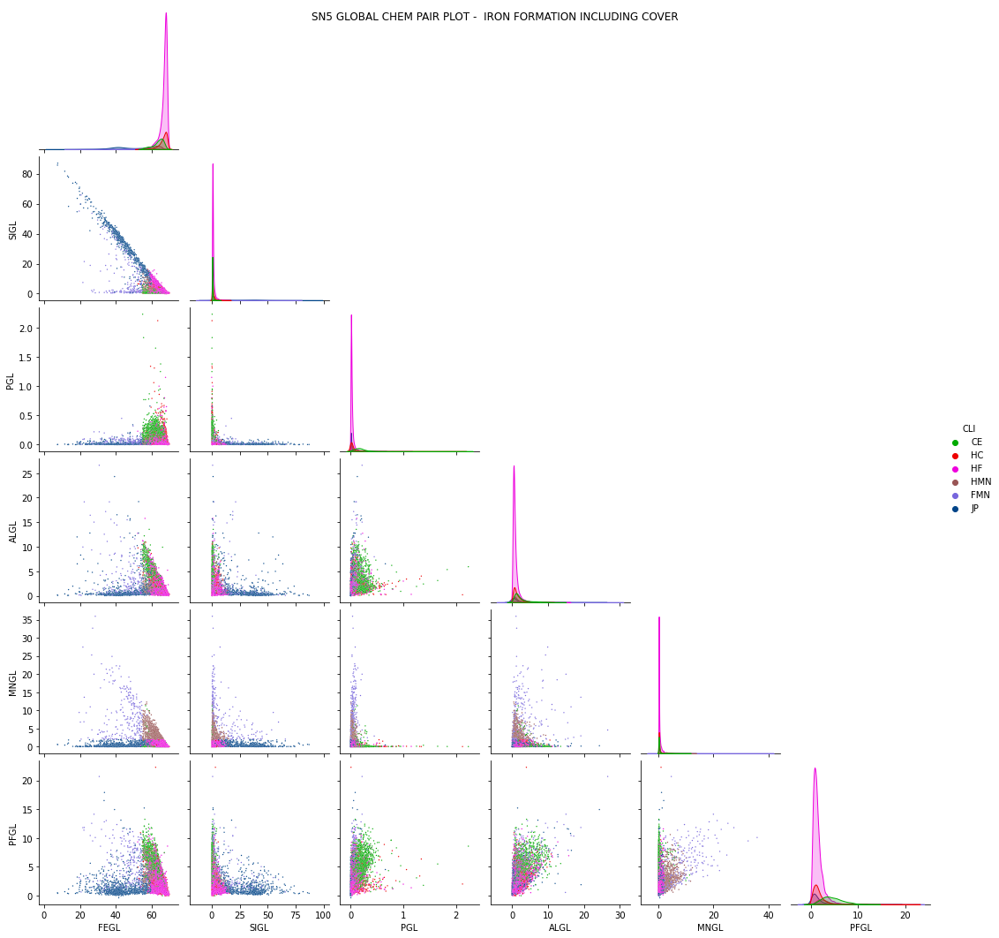

In [101]:
g=sea.pairplot(df_pair, kind="scatter", hue="CLI",  palette=litocolor,  corner=True,  plot_kws={"s": 2})
g.fig.suptitle(proj + " GLOBAL CHEM PAIR PLOT -  IRON FORMATION INCLUDING COVER") # y= some height>1
plt.savefig(proj + '_IRON_FORMATION_GLOBAL_PAIRPLOT.png')
plt.show()

## GLOBAL PLUS OVERSIZES 19MM, 8MM, 0.15MM 

In [102]:
df_pair2 = bplt.loc[:,['CLV', 'CLM', 'CLI', 'FEGL', 'SIGL', 'PGL', 'ALGL', 'MNGL', 'PFGL','G1A', 'G1B', 'G2','G3']].copy()

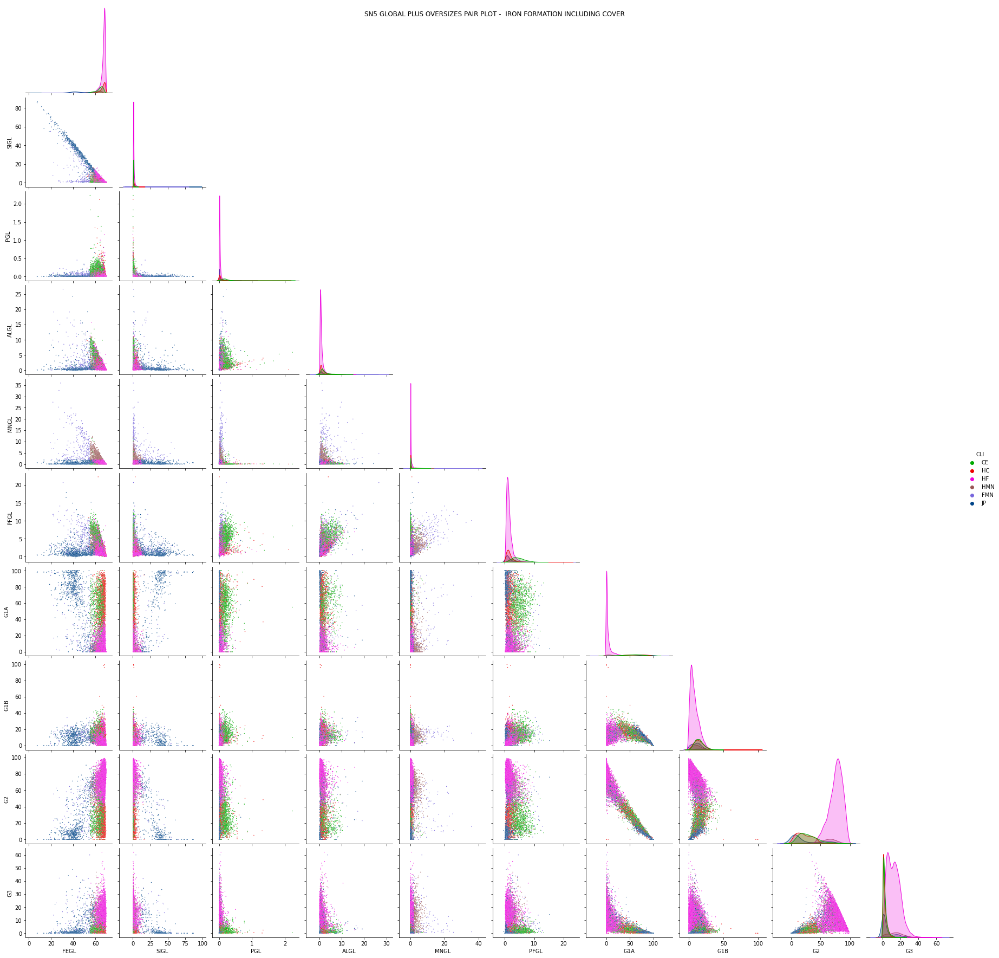

In [103]:
g=sea.pairplot(df_pair2, kind="scatter", hue="CLI",  palette=litocolor,  corner=True,  plot_kws={"s": 2})
g.fig.suptitle(proj + " GLOBAL PLUS OVERSIZES PAIR PLOT -  IRON FORMATION INCLUDING COVER") # y= some height>1
plt.savefig(proj + '_IRON_FORMATION_GLOBAL_N\'_FRACTIONS_PAIRPLOT.png')
plt.show()

## OVERSIZES


In [104]:
df_pair3 = bplt.loc[:,['CLI', 'G1A', 'G1B', 'G2','G3']].copy()

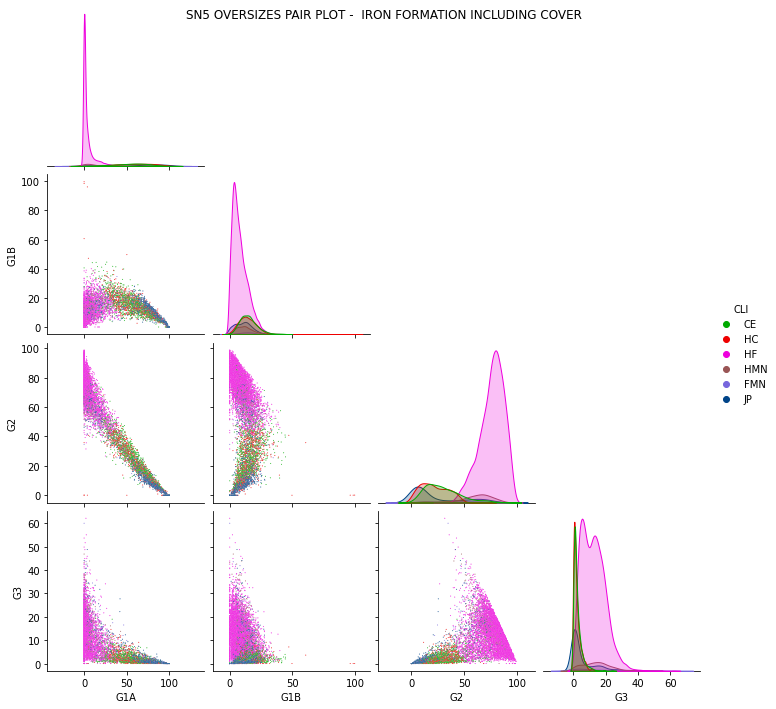

In [105]:
g=sea.pairplot(df_pair3, kind="scatter", hue="CLI",  palette=litocolor,  corner=True, plot_kws={"s": 1})
g.fig.suptitle(proj + " OVERSIZES PAIR PLOT -  IRON FORMATION INCLUDING COVER") # y= some height>1

plt.savefig(proj + '_IRON_FORMATION_OVERSIZES_PAIRPLOT.png')
plt.show()

## KERNEL DENSITY PLOTS DETAILING OVERSIZES

In [106]:
kde_oversize = bplt.loc[:,['CLI', 'G1A', 'G1B', 'G2','G3']].copy()

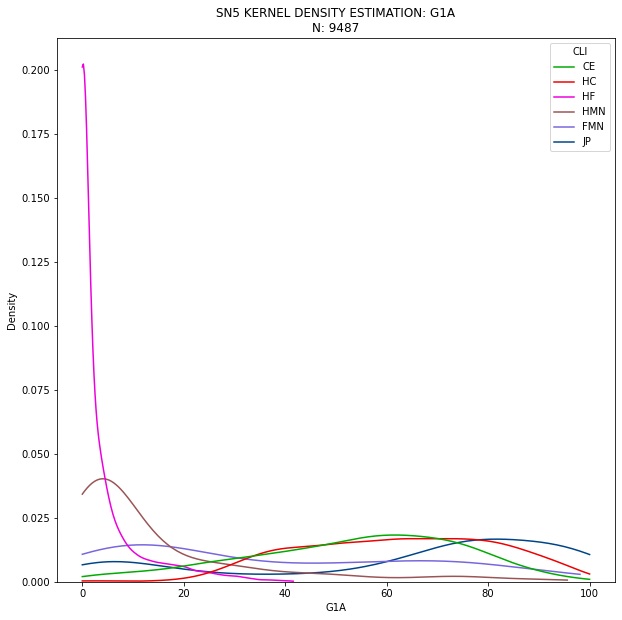

In [107]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'G1A'
df=bplt

kde=sea.kdeplot(data=df, x=grade,hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

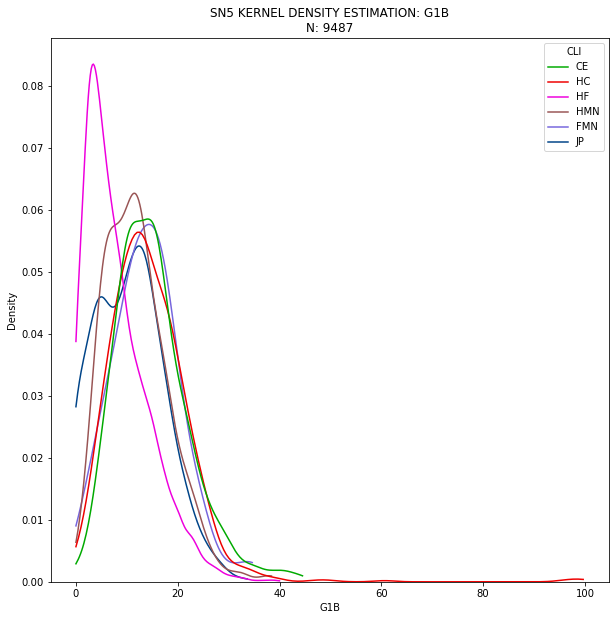

In [108]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'G1B'
df=bplt

kde=sea.kdeplot(data=df, x=grade,hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

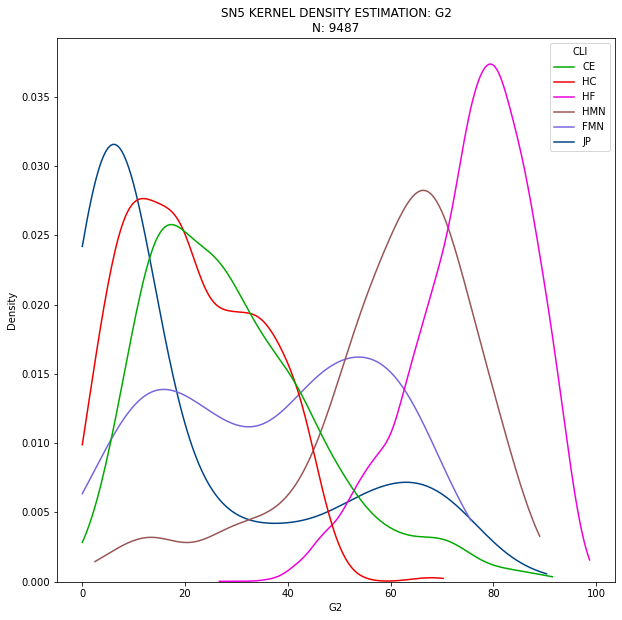

In [109]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'G2'
df=bplt

kde=sea.kdeplot(data=df, x=grade,hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

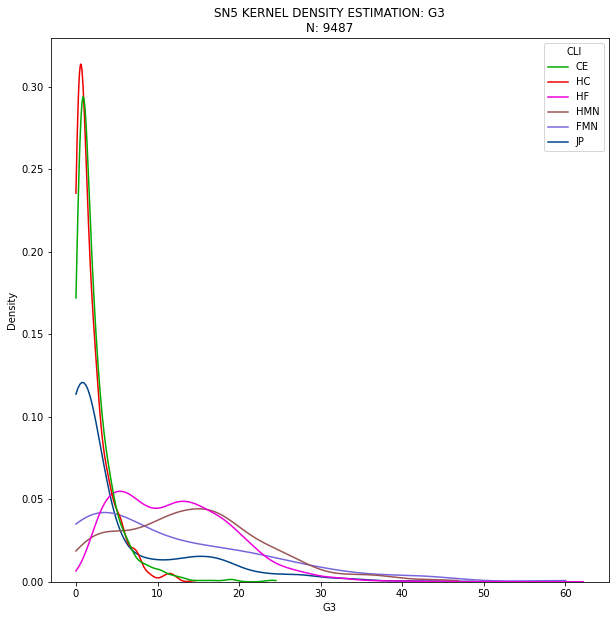

In [110]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'G3'
df=bplt

kde=sea.kdeplot(data=df, x=grade,hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' KERNEL DENSITY ESTIMATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

## HF MASS DISCOUNT ASSESMENT

In [111]:
df_hf = fso.loc[fso['CLI']=='HF',['CLI', 'G1A', 'G1B', 'G2','G3']].copy()

In [112]:
df_hf.head()

,CLI,G1A,G1B,G2,G3
8,HF,11.60,17.82,63.69,5.94
9,HF,12.70,13.52,66.89,6.86
10,HF,21.16,19.43,56.25,3.09
17,HF,NaN,NaN,NaN,NaN
21,HF,25.30,12.79,57.73,4.15


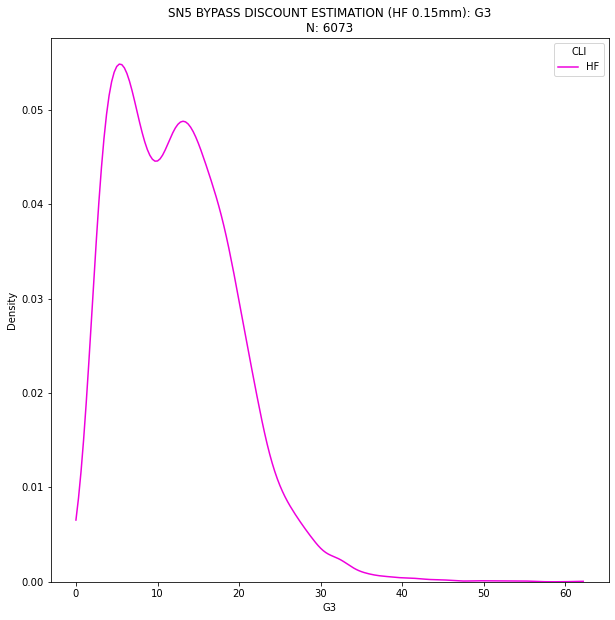

In [113]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'G3'
df=df_hf

kde=sea.kdeplot(data=df, x=grade,hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

kde.set_title(proj + ' BYPASS DISCOUNT ESTIMATION (HF 0.15mm): '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE.jpeg', transparent=None)
plt.show()

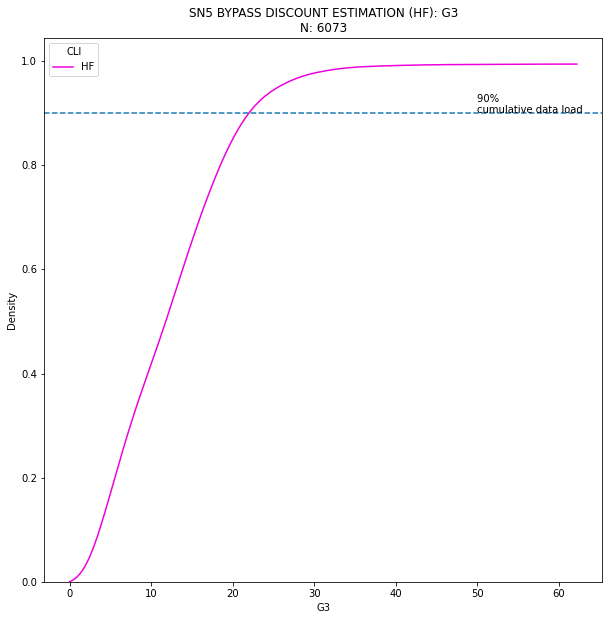

In [114]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'G3'
df=df_hf

kde=sea.kdeplot(data=df, x=grade,hue="CLI", cumulative=True,common_norm=False, palette=litocolor, alpha=.5, cut=0)

ax1 = kde.axes

ax1.axhline(0.90, ls='--')
ax1.text(50, 0.90, '90% \ncumulative data load')


kde.set_title(proj + ' BYPASS DISCOUNT ESTIMATION (HF): '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_KDE_CUMULATIVE.jpeg', transparent=None)
plt.show()

## METAL MIGRATION

In [115]:
df_g = fso.loc[fso['CLI'].isin(ff_rocks),['CLI', 'FEGL', 'FE1A', 'FE1B', 'FE2', 'FE3', 'G1A', 'G1B', 'G2', 'G3', 'SIGL', 'PGL', 'ALGL', 'MNGL', 'PFGL', 'TIGL', 'CAGL', 'MGGL', 'FQGL', 'FQ1A', 'FQ1B', 'FQ2', 'FQ3'] ]

In [116]:
df_g.head()

,CLI,FEGL,FE1A,FE1B,FE2,FE3,G1A,G1B,G2,G3,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,CAGL,MGGL,FQGL,FQ1A,FQ1B,FQ2,FQ3
0,CE,65.91,65.80,66.05,66.37,62.34,67.16,15.13,16.88,0.68,NaN,0.12,NaN,0.03,4.49,NaN,NaN,NaN,100.70,100.77,100.65,100.49,99.98
1,HC,66.96,66.96,66.88,67.17,63.57,71.79,10.78,16.67,0.56,NaN,0.11,NaN,0.02,2.81,NaN,NaN,NaN,99.94,99.85,100.38,100.00,99.99
2,HC,67.32,67.09,67.18,67.89,65.55,55.53,8.13,33.49,2.69,NaN,0.07,NaN,0.03,2.04,NaN,NaN,NaN,99.64,99.45,99.40,99.99,99.99
3,HC,64.78,65.91,64.07,62.90,56.95,60.94,12.94,24.27,1.70,NaN,0.12,NaN,0.03,4.20,NaN,NaN,NaN,99.88,99.69,99.88,100.35,99.99
6,CE,66.66,66.58,66.70,66.93,63.62,61.10,16.85,21.46,0.52,NaN,0.13,NaN,0.04,3.23,NaN,NaN,NaN,100.03,100.06,100.00,99.96,99.39


In [117]:
df_g.dropna(subset=['FEGL', 'FE1A', 'FE1B', 'FE2', 'FE3'],inplace=True)

In [118]:
df_g.shape

(5911, 23)

In [119]:
df_g['DELTA1A'] = df_g.FEGL - df_g.FE1A
df_g['DELTA1B'] = df_g.FEGL - df_g.FE1B
df_g['DELTA2'] = df_g.FEGL - df_g.FE2
df_g['DELTA3'] = df_g.FEGL - df_g.FE3

df_g['ADELTA1A'] = np.abs(df_g['DELTA1A'])
df_g['ADELTA1B'] = np.abs(df_g['DELTA1B'])
df_g['ADELTA2'] = np.abs(df_g['DELTA2'])
df_g['ADELTA3'] = np.abs(df_g['DELTA3'])

In [120]:
df_g.head()

,CLI,FEGL,FE1A,FE1B,FE2,FE3,G1A,G1B,G2,G3,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,CAGL,MGGL,FQGL,FQ1A,FQ1B,FQ2,FQ3,DELTA1A,DELTA1B,DELTA2,DELTA3,ADELTA1A,ADELTA1B,ADELTA2,ADELTA3
0,CE,65.91,65.80,66.05,66.37,62.34,67.16,15.13,16.88,0.68,NaN,0.12,NaN,0.03,4.49,NaN,NaN,NaN,100.70,100.77,100.65,100.49,99.98,0.11,-0.14,-0.46,3.57,0.11,0.14,0.46,3.57
1,HC,66.96,66.96,66.88,67.17,63.57,71.79,10.78,16.67,0.56,NaN,0.11,NaN,0.02,2.81,NaN,NaN,NaN,99.94,99.85,100.38,100.00,99.99,0.00,0.08,-0.21,3.39,0.00,0.08,0.21,3.39
2,HC,67.32,67.09,67.18,67.89,65.55,55.53,8.13,33.49,2.69,NaN,0.07,NaN,0.03,2.04,NaN,NaN,NaN,99.64,99.45,99.40,99.99,99.99,0.23,0.14,-0.57,1.77,0.23,0.14,0.57,1.77
3,HC,64.78,65.91,64.07,62.90,56.95,60.94,12.94,24.27,1.70,NaN,0.12,NaN,0.03,4.20,NaN,NaN,NaN,99.88,99.69,99.88,100.35,99.99,-1.13,0.71,1.88,7.83,1.13,0.71,1.88,7.83
6,CE,66.66,66.58,66.70,66.93,63.62,61.10,16.85,21.46,0.52,NaN,0.13,NaN,0.04,3.23,NaN,NaN,NaN,100.03,100.06,100.00,99.96,99.39,0.08,-0.04,-0.27,3.04,0.08,0.04,0.27,3.04


In [121]:
df_g.groupby('CLI').describe()

FEGL                                                              \
      count       mean       std    min      25%    50%      75%    max   
CLI                                                                       
CE   1050.0  63.348581  3.076421  54.70  61.7550  63.99  65.7275  68.76   
FMN   103.0  43.682233  9.108163  19.56  36.3550  46.78  50.5600  57.45   
HC    924.0  65.921894  2.349237  55.72  64.8725  66.59  67.6850  69.36   
HF   2860.0  66.114472  2.259408  52.31  65.2175  66.77  67.7000  69.69   
HMN   368.0  61.260163  2.913747  54.05  59.2325  61.77  63.5300  66.41   
JP    606.0  44.144257  8.498605  18.67  38.8550  42.70  50.8300  59.88   

       FE1A                                                               \
      count       mean       std    min      25%     50%      75%    max   
CLI                                                                        
CE   1050.0  63.470390  3.098598  47.03  61.9850  64.180  65.7200  68.60   
FMN   103.0  39.668835  9.903856  12.03  34.0950  40.140  47.2250  60.92   
HC    924.0  65.878810  2.661325  50.40  64.7300  66.680  67.7700  69.44   
HF   2860.0  61.826392  7.178874   8.27  59.6150  64.265  66.7600  69.75   
HMN   368.0  54.046033  8.115826  17.34  50.2550  55.335  60.0500  67.75   
JP    606.0  41.720033  7.723854  18.66  38.0075  40.875  45.5975  65.15   

       FE1B                                                               \
      count       mean       std    min      25%     50%      75%    max   
CLI                                                                        
CE   1050.0  63.349162  3.341987  47.87  61.7300  64.200  65.8400  68.91   
FMN   103.0  43.646699  9.141930  21.20  34.7400  45.810  50.6050  60.25   
HC    924.0  65.946710  2.424792  52.11  64.8975  66.590  67.7200  69.52   
HF   2860.0  65.003210  3.559750  33.43  63.6775  66.115  67.4300  69.83   
HMN   368.0  58.990299  5.404810  24.72  56.3450  60.155  62.6625  67.86   
JP    606.0  45.924274  8.769986  18.48  39.9025  45.205  52.7650  68.28   

        FE2                                                               \
      count       mean       std    min      25%     50%      75%    max   
CLI                                                                        
CE   1050.0  63.182810  3.669920  43.79  61.1225  63.950  65.9675  69.41   
FMN   103.0  46.611748  9.495267  20.75  39.3150  50.210  53.4550  63.59   
HC    924.0  65.994838  2.545349  44.42  65.1100  66.635  67.7225  69.41   
HF   2860.0  66.749063  1.947414  55.50  66.0075  67.310  68.0700  69.87   
HMN   368.0  62.610027  2.950806  53.40  60.7150  63.180  64.9325  68.64   
JP    606.0  48.653795  9.803644  17.39  41.2550  49.175  57.0675  67.70   

        FE3                                                                \
      count       mean        std    min      25%     50%      75%    max   
CLI                                                                         
CE   1050.0  59.293733   4.795894  37.41  56.5550  60.130  62.6900  67.55   
FMN   103.0  41.846796  12.591984  12.34  31.8400  43.620  52.5150  61.97   
HC    924.0  61.494145   4.703950  40.15  58.8800  62.680  64.8900  68.43   
HF   2860.0  64.460203   3.945517  37.95  63.6100  65.650  66.9525  69.17   
HMN   368.0  60.524620   4.697214  41.58  57.8025  61.915  63.9475  66.98   
JP    606.0  38.427987  11.005285  11.10  30.4325  37.840  45.9750  68.19   

        G1A                                                               \
      count       mean        std   min      25%     50%      75%    max   
CLI                                                                        
CE   1050.0  53.179867  20.723178  1.20  38.4725  56.020  69.2175  94.78   
FMN   103.0  37.499709  28.431718  1.50  12.6000  28.500  64.2750  94.39   
HC    924.0  60.614838  18.563994  3.83  45.8550  61.235  76.3175  97.49   
HF   2860.0   7.801364   7.954170  0.10   2.3300   4.545  10.6475  41.57   
HMN   368.0  17.224076  20.870818  0.40   3.6300  

## 19 MM

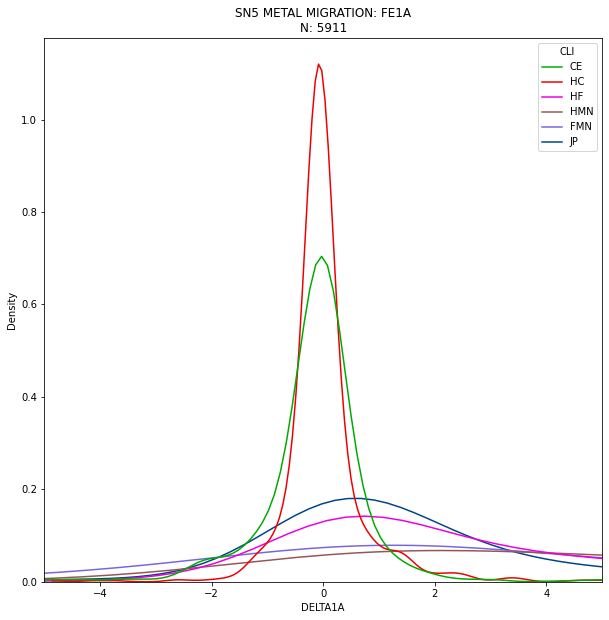

In [122]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'FE1A'
delta = 'DELTA1A'
df=df_g

kde=sea.kdeplot(data=df, x=delta, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

plt.xlim(-5, 5)

kde.set_title(proj + ' METAL MIGRATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + 'METAL_MIGRATION_KDE.jpeg', transparent=None)
plt.show()

## 8 MM

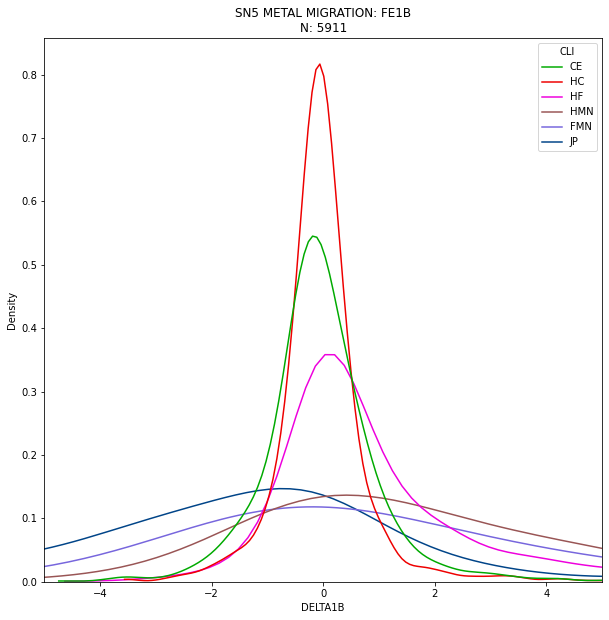

In [123]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'FE1B'
delta = 'DELTA1B'
df=df_g

kde=sea.kdeplot(data=df, x=delta, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

plt.xlim(-5, 5)

kde.set_title(proj + ' METAL MIGRATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + 'METAL_MIGRATION_KDE.jpeg', transparent=None)
plt.show()

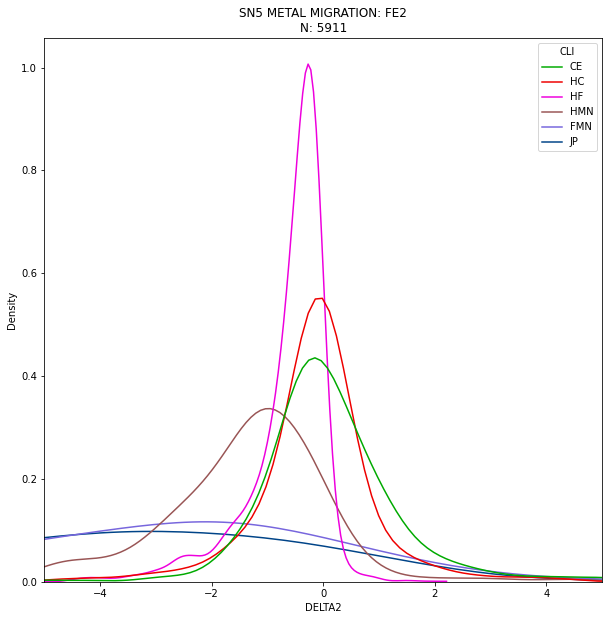

In [124]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'FE2'
delta = 'DELTA2'
df=df_g

kde=sea.kdeplot(data=df, x=delta, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

plt.xlim(-5, 5)

kde.set_title(proj + ' METAL MIGRATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + 'METAL_MIGRATION_KDE.jpeg', transparent=None)
plt.show()

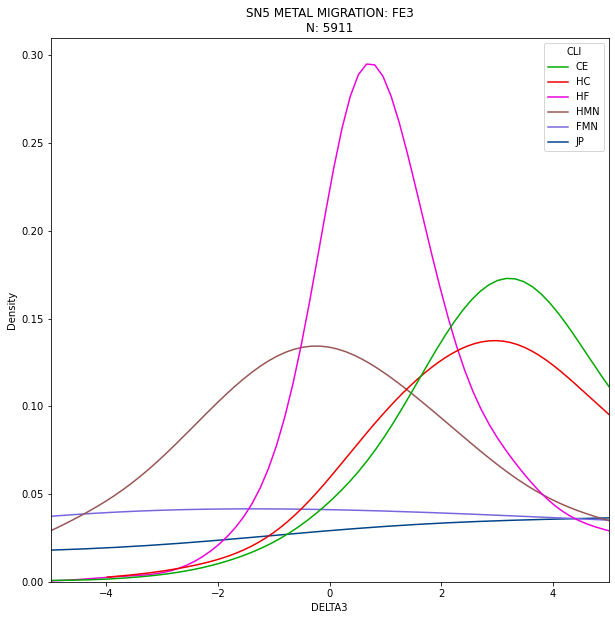

In [125]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'FE3'
delta = 'DELTA3'
df=df_g

kde=sea.kdeplot(data=df, x=delta, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

plt.xlim(-5, 5)

kde.set_title(proj + ' METAL MIGRATION: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + 'METAL_MIGRATION_KDE.jpeg', transparent=None)
plt.show()

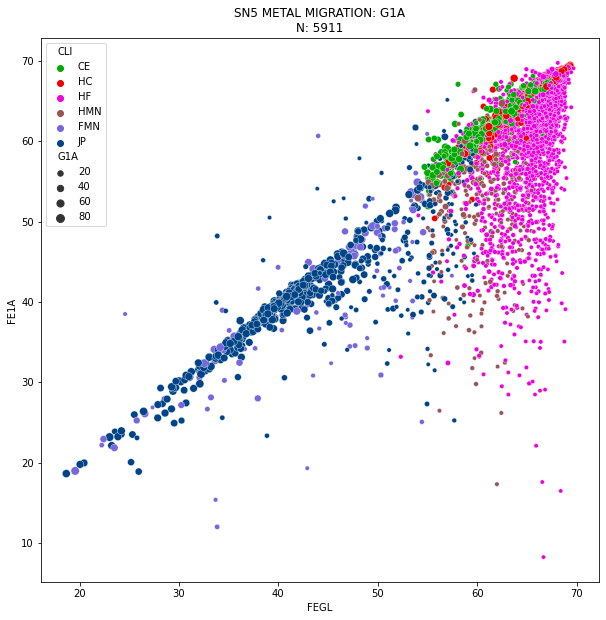

In [126]:
fig, ax = plt.subplots(figsize=chart_size)

df=df_g
grade ='1A'

sca=sea.scatterplot(data=df, x="FEGL", y="FE" + grade, hue="CLI",palette=litocolor, size="G" + grade, alpha=1)

sca.set_title(proj + ' METAL MIGRATION: G'+ grade + '\nN: ' + str(df['FE' + grade].count()))

fig.savefig('METAL_MIGRATION_G' + grade + '_scatter.jpeg', transparent=None)
plt.show()

###### INQUIRING EXTREME MIGRATIONS 19mm


In [127]:
df_g.head(10)

,CLI,FEGL,FE1A,FE1B,FE2,FE3,G1A,G1B,G2,G3,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,CAGL,MGGL,FQGL,FQ1A,FQ1B,FQ2,FQ3,DELTA1A,DELTA1B,DELTA2,DELTA3,ADELTA1A,ADELTA1B,ADELTA2,ADELTA3
0,CE,65.91,65.80,66.05,66.37,62.34,67.16,15.13,16.88,0.68,NaN,0.12,NaN,0.03,4.49,NaN,NaN,NaN,100.70,100.77,100.65,100.49,99.98,0.11,-0.14,-0.46,3.57,0.11,0.14,0.46,3.57
1,HC,66.96,66.96,66.88,67.17,63.57,71.79,10.78,16.67,0.56,NaN,0.11,NaN,0.02,2.81,NaN,NaN,NaN,99.94,99.85,100.38,100.00,99.99,0.00,0.08,-0.21,3.39,0.00,0.08,0.21,3.39
2,HC,67.32,67.09,67.18,67.89,65.55,55.53,8.13,33.49,2.69,NaN,0.07,NaN,0.03,2.04,NaN,NaN,NaN,99.64,99.45,99.40,99.99,99.99,0.23,0.14,-0.57,1.77,0.23,0.14,0.57,1.77
3,HC,64.78,65.91,64.07,62.90,56.95,60.94,12.94,24.27,1.70,NaN,0.12,NaN,0.03,4.20,NaN,NaN,NaN,99.88,99.69,99.88,100.35,99.99,-1.13,0.71,1.88,7.83,1.13,0.71,1.88,7.83
6,CE,66.66,66.58,66.70,66.93,63.62,61.10,16.85,21.46,0.52,NaN,0.13,NaN,0.04,3.23,NaN,NaN,NaN,100.03,100.06,100.00,99.96,99.39,0.08,-0.04,-0.27,3.04,0.08,0.04,0.27,3.04
7,CE,67.24,66.85,67.52,67.89,64.81,49.54,16.97,31.25,2.12,NaN,0.08,NaN,0.19,2.07,NaN,NaN,NaN,99.79,99.61,99.99,100.00,99.25,0.39,-0.28,-0.65,2.43,0.39,0.28,0.65,2.43
8,HF,67.88,68.66,68.02,68.06,64.03,11.60,17.82,63.69,5.94,NaN,0.04,NaN,0.35,1.23,NaN,NaN,NaN,99.98,99.99,99.98,99.98,99.94,-0.78,-0.14,-0.18,3.85,0.78,0.14,0.18,3.85
9,HF,66.19,68.36,67.20,66.19,60.23,12.70,13.52,66.89,6.86,NaN,0.06,NaN,0.29,2.40,NaN,NaN,NaN,99.48,99.99,99.99,99.33,99.08,-2.17,-1.01,0.00,5.96,2.17,1.01,0.00,5.96
10,HF,67.88,67.78,67.88,68.16,63.45,21.16,19.43,56.25,3.09,NaN,0.02,NaN,0.77,0.80,NaN,NaN,NaN,99.98,99.98,99.98,99.98,99.92,0.10,0.00,-0.28,4.43,0.10,0.00,0.28,4.43
11,HC,67.70,67.61,67.75,68.02,63.37,53.23,19.08,26.50,1.11,NaN,0.07,NaN,0.17,1.18,NaN,NaN,NaN,99.99,99.99,99.99,99.99,99.97,0.09,-0.05,-0.32,4.33,0.09,0.05,0.32,4.33


In [128]:
indx = df_g['ADELTA1A'] > 5 

In [129]:
df_g.loc[indx, :]

,CLI,FEGL,FE1A,FE1B,FE2,FE3,G1A,G1B,G2,G3,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,CAGL,MGGL,FQGL,FQ1A,FQ1B,FQ2,FQ3,DELTA1A,DELTA1B,DELTA2,DELTA3,ADELTA1A,ADELTA1B,ADELTA2,ADELTA3
248,HMN,57.17,51.32,52.52,58.13,59.23,8.57,8.95,70.57,11.91,1.28,0.040,1.52,7.270,5.70,0.030,0.030,0.070,99.92,99.92,99.90,99.92,99.93,5.85,4.65,-0.96,-2.06,5.85,4.65,0.96,2.06
292,HMN,61.14,51.74,64.28,62.29,56.89,9.21,14.20,68.11,8.48,6.34,0.040,1.36,2.340,1.97,0.030,0.020,0.060,99.96,99.99,99.97,99.96,99.97,9.40,-3.14,-1.15,4.25,9.40,3.14,1.15,4.25
299,HF,67.59,57.72,67.18,68.46,66.92,4.48,11.47,68.30,15.73,0.50,0.020,0.82,0.480,1.34,NaN,0.010,0.010,99.99,100.00,100.00,100.00,100.00,9.87,0.41,-0.87,0.67,9.87,0.41,0.87,0.67
402,HF,63.45,53.11,64.41,64.56,54.51,5.93,10.50,79.48,4.07,NaN,0.050,NaN,0.360,2.68,NaN,NaN,NaN,99.91,99.98,99.98,99.90,99.95,10.34,-0.96,-1.11,8.94,10.34,0.96,1.11,8.94
571,HF,67.97,62.25,67.35,68.40,67.62,2.10,13.93,64.89,19.06,NaN,0.010,NaN,0.080,0.88,NaN,NaN,NaN,99.76,99.98,99.64,99.83,99.56,5.72,0.62,-0.43,0.35,5.72,0.62,0.43,0.35
574,HF,67.87,57.98,68.41,68.29,67.56,2.91,15.34,64.00,17.74,NaN,0.010,NaN,0.340,0.98,NaN,NaN,NaN,99.89,99.99,100.23,99.87,99.63,9.89,-0.54,-0.42,0.31,9.89,0.54,0.42,0.31
580,HF,67.94,60.92,68.04,68.28,67.23,1.69,19.02,63.39,15.89,NaN,0.010,NaN,0.330,1.03,NaN,NaN,NaN,99.92,99.99,99.67,100.01,99.86,7.02,-0.10,-0.34,0.71,7.02,0.10,0.34,0.71
601,HF,67.61,53.62,66.69,68.32,66.80,1.93,10.15,71.17,16.74,NaN,0.010,NaN,0.240,1.12,NaN,NaN,NaN,99.98,100.00,99.99,99.95,100.10,13.99,0.92,-0.71,0.81,13.99,0.92,0.71,0.81
602,HF,68.00,57.38,67.22,68.51,67.29,1.43,12.77,70.89,14.89,NaN,0.010,NaN,0.140,1.52,NaN,NaN,NaN,100.67,99.99,100.18,100.94,99.87,10.62,0.78,-0.51,0.71,10.62,0.78,0.51,0.71
609,HF,68.35,60.95,68.34,68.66,67.97,2.21,14.36,70.67,12.75,NaN,0.010,NaN,0.190,0.83,NaN,NaN,NaN,100.21,100.00,99.96,100.31,99.98,7.40,0.01,-0.31,0.38,7.40,0.01,0.31,0.38


In [130]:
df1a = df_g.loc[indx, :]

In [131]:
df1a.shape

(1177, 31)

In [132]:
# insight: 1177 dados de 5911 apresentam migração metálica maior que 5% na 19mm
# deslocamento metálico ocorre na maioria das vezes com baixo valor de retidos na 19.0 mm
# não há anomalias de assembleias minerais exóticas fq1a ~ 100% 
# dessas amostras apenas hc aparentam ser influenciadas mais por conta da associação de 
# granulometria relevante juntocom mineralogia diferencial naquela faixa

In [133]:
df1a.head()

,CLI,FEGL,FE1A,FE1B,FE2,FE3,G1A,G1B,G2,G3,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,CAGL,MGGL,FQGL,FQ1A,FQ1B,FQ2,FQ3,DELTA1A,DELTA1B,DELTA2,DELTA3,ADELTA1A,ADELTA1B,ADELTA2,ADELTA3
248,HMN,57.17,51.32,52.52,58.13,59.23,8.57,8.95,70.57,11.91,1.28,0.04,1.52,7.27,5.70,0.03,0.03,0.07,99.92,99.92,99.90,99.92,99.93,5.85,4.65,-0.96,-2.06,5.85,4.65,0.96,2.06
292,HMN,61.14,51.74,64.28,62.29,56.89,9.21,14.20,68.11,8.48,6.34,0.04,1.36,2.34,1.97,0.03,0.02,0.06,99.96,99.99,99.97,99.96,99.97,9.40,-3.14,-1.15,4.25,9.40,3.14,1.15,4.25
299,HF,67.59,57.72,67.18,68.46,66.92,4.48,11.47,68.30,15.73,0.50,0.02,0.82,0.48,1.34,NaN,0.01,0.01,99.99,100.00,100.00,100.00,100.00,9.87,0.41,-0.87,0.67,9.87,0.41,0.87,0.67
402,HF,63.45,53.11,64.41,64.56,54.51,5.93,10.50,79.48,4.07,NaN,0.05,NaN,0.36,2.68,NaN,NaN,NaN,99.91,99.98,99.98,99.90,99.95,10.34,-0.96,-1.11,8.94,10.34,0.96,1.11,8.94
571,HF,67.97,62.25,67.35,68.40,67.62,2.10,13.93,64.89,19.06,NaN,0.01,NaN,0.08,0.88,NaN,NaN,NaN,99.76,99.98,99.64,99.83,99.56,5.72,0.62,-0.43,0.35,5.72,0.62,0.43,0.35


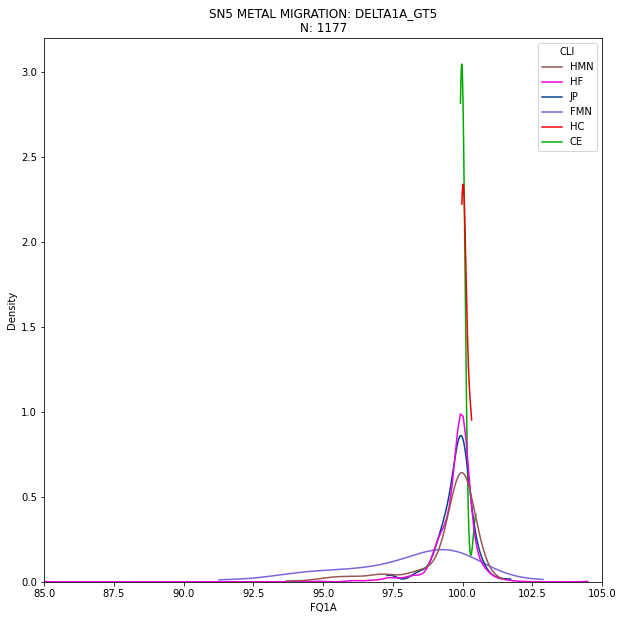

In [134]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'DELTA1A_GT5'
delta = 'FQ1A'
df=df1a

kde=sea.kdeplot(data=df, x=delta, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

plt.xlim(85, 105)

kde.set_title(proj + ' METAL MIGRATION: '+ grade + '\nN: ' + str(df[delta].count()))
fig.savefig(proj + '_' + grade + 'METAL_MIGRATION_KDE_GT5.jpeg', transparent=None)
plt.show()

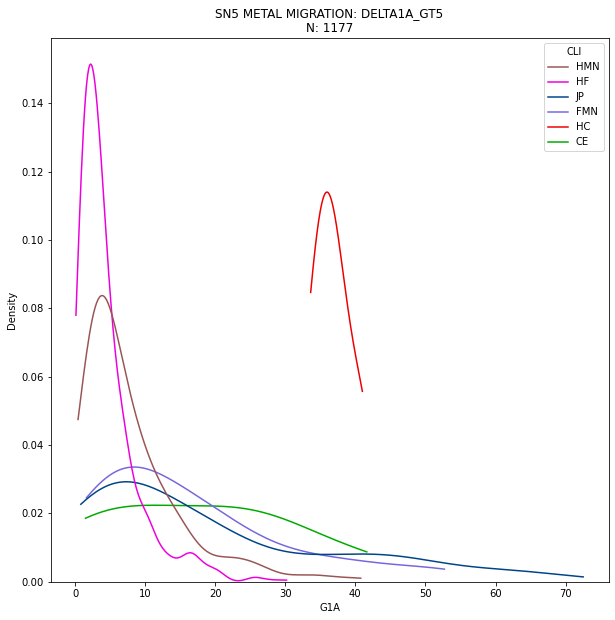

In [135]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'DELTA1A_GT5'
delta = 'G1A'
df=df1a

kde=sea.kdeplot(data=df, x=delta, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

#plt.xlim(85, 105)

kde.set_title(proj + ' METAL MIGRATION: '+ grade + '\nN: ' + str(df[delta].count()))
fig.savefig(proj + '_' + grade + 'METAL_MIGRATION_KDE_GT5.jpeg', transparent=None)
plt.show()

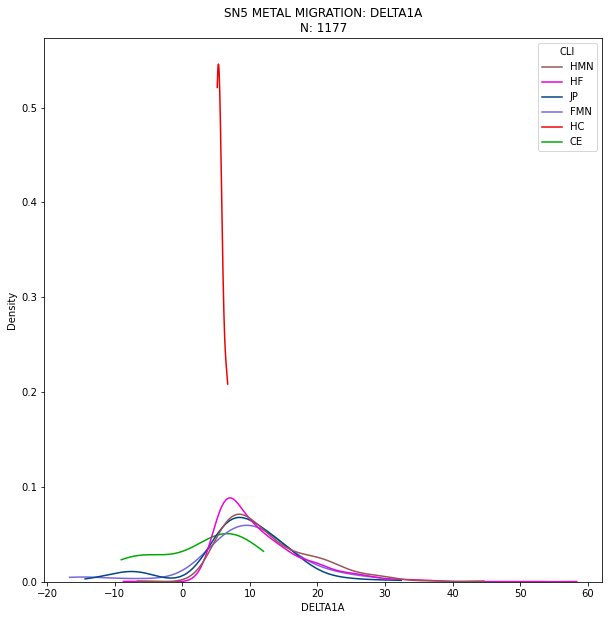

In [136]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'DELTA1A'
delta = 'DELTA1A'
df=df1a

kde=sea.kdeplot(data=df, x=delta, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

#plt.xlim(85, 105)

kde.set_title(proj + ' METAL MIGRATION: '+ grade + '\nN: ' + str(df[delta].count()))
fig.savefig(proj + '_' + grade + 'METAL_MIGRATION_KDE_GT5.jpeg', transparent=None)
plt.show()

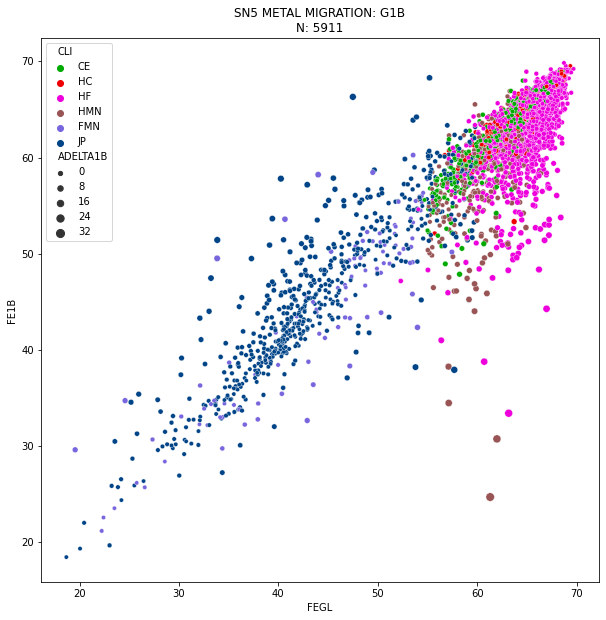

In [137]:
fig, ax = plt.subplots(figsize=chart_size)

df=df_g
grade ='1B'

sca=sea.scatterplot(data=df, x="FEGL", y="FE" + grade, hue="CLI",palette=litocolor, size="ADELTA" + grade, alpha=1)

sca.set_title(proj + ' METAL MIGRATION: G'+ grade + '\nN: ' + str(df['FE' + grade].count()))

fig.savefig('METAL_MIGRATION_G' + grade + '_scatter.jpeg', transparent=None)
plt.show()

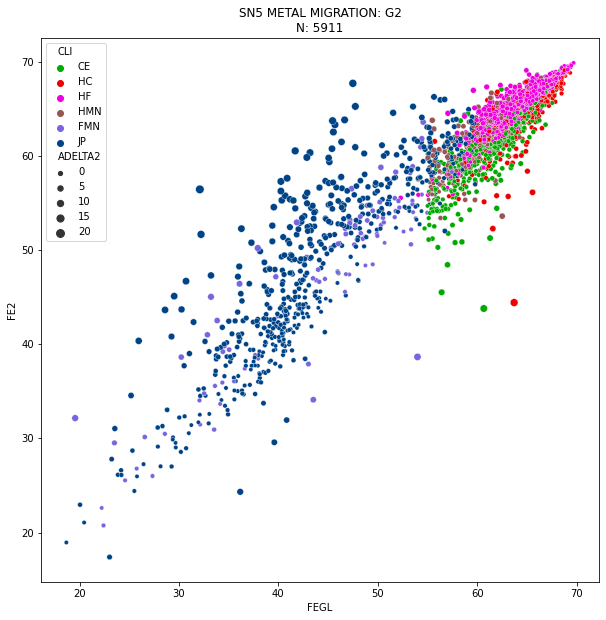

In [138]:
fig, ax = plt.subplots(figsize=chart_size)

df=df_g
grade ='2'

sca=sea.scatterplot(data=df, x="FEGL", y="FE" + grade, hue="CLI",palette=litocolor, size="ADELTA" + grade, alpha=1)

sca.set_title(proj + ' METAL MIGRATION: G'+ grade + '\nN: ' + str(df['FE' + grade].count()))

fig.savefig('METAL_MIGRATION_G' + grade + '_scatter.jpeg', transparent=None)
plt.show()

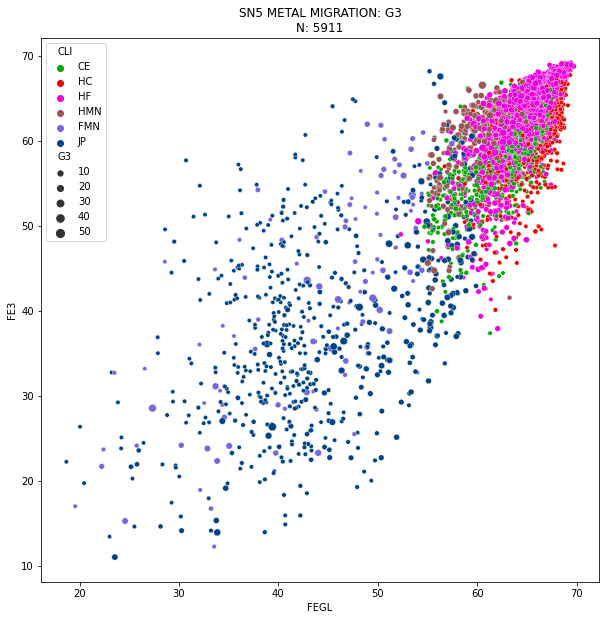

In [139]:
fig, ax = plt.subplots(figsize=chart_size)

df=df_g
grade ='3'

sca=sea.scatterplot(data=df, x="FEGL", y="FE" + grade, hue="CLI",palette=litocolor, size="G" + grade, alpha=1)

sca.set_title(proj + ' METAL MIGRATION: G'+ grade + '\nN: ' + str(df['FE' + grade].count()))

fig.savefig('METAL_MIGRATION_G' + grade + '_scatter.jpeg', transparent=None)
plt.show()

###### INQUIRING UNDERSIZE 0.15mm EXTREME MIGRATIONS

In [140]:
indx = df_g['ADELTA3'] > 5 

In [141]:
df3 = df_g.loc[indx, :]

In [142]:
df3.shape

(1397, 31)

In [143]:
df3.head()

,CLI,FEGL,FE1A,FE1B,FE2,FE3,G1A,G1B,G2,G3,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,CAGL,MGGL,FQGL,FQ1A,FQ1B,FQ2,FQ3,DELTA1A,DELTA1B,DELTA2,DELTA3,ADELTA1A,ADELTA1B,ADELTA2,ADELTA3
3,HC,64.78,65.91,64.07,62.90,56.95,60.94,12.94,24.27,1.70,NaN,0.12,NaN,0.03,4.20,NaN,NaN,NaN,99.88,99.69,99.88,100.35,99.99,-1.13,0.71,1.88,7.83,1.13,0.71,1.88,7.83
9,HF,66.19,68.36,67.20,66.19,60.23,12.70,13.52,66.89,6.86,NaN,0.06,NaN,0.29,2.40,NaN,NaN,NaN,99.48,99.99,99.99,99.33,99.08,-2.17,-1.01,0.00,5.96,2.17,1.01,0.00,5.96
76,CE,65.23,65.72,63.09,63.45,59.67,80.76,10.69,8.10,0.33,NaN,0.20,NaN,0.08,4.34,NaN,NaN,NaN,99.99,100.00,99.99,100.00,99.97,-0.49,2.14,1.78,5.56,0.49,2.14,1.78,5.56
155,HF,61.99,63.43,62.95,63.45,55.27,13.70,15.36,54.07,16.87,6.12,0.04,2.14,0.64,1.73,0.14,0.02,0.02,99.97,99.97,99.98,99.97,99.97,-1.44,-0.96,-1.46,6.72,1.44,0.96,1.46,6.72
156,HF,67.31,67.67,67.48,67.37,62.14,24.20,23.59,49.33,2.88,1.36,0.02,0.86,0.26,0.95,0.05,0.02,0.08,99.96,99.97,99.96,99.95,99.87,-0.36,-0.17,-0.06,5.17,0.36,0.17,0.06,5.17


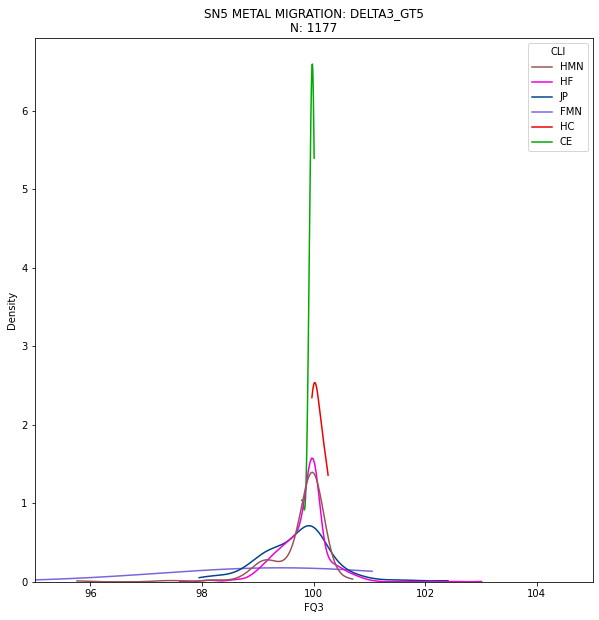

In [144]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'DELTA3_GT5'
delta = 'FQ3'
df=df1a

kde=sea.kdeplot(data=df, x=delta, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

plt.xlim(95, 105)

kde.set_title(proj + ' METAL MIGRATION: '+ grade + '\nN: ' + str(df[delta].count()))
fig.savefig(proj + '_' + grade + 'METAL_MIGRATION_KDE_GT5.jpeg', transparent=None)
plt.show()

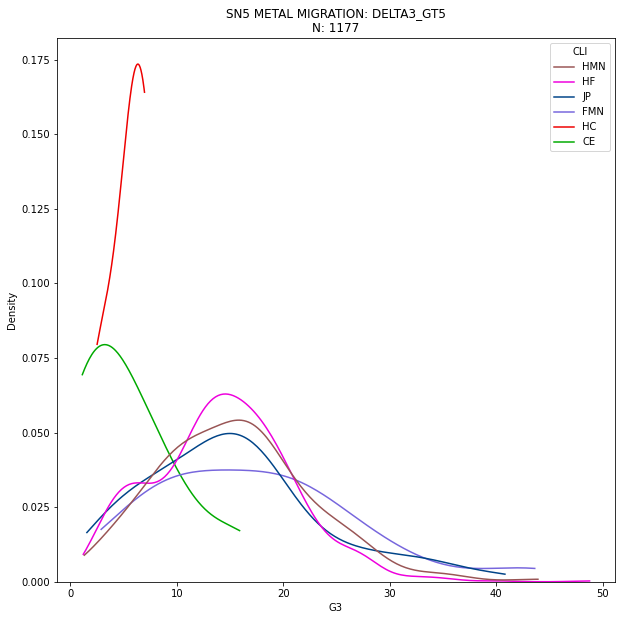

In [145]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'DELTA3_GT5'
delta = 'G3'
df=df1a

kde=sea.kdeplot(data=df, x=delta, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

#plt.xlim(85, 105)

kde.set_title(proj + ' METAL MIGRATION: '+ grade + '\nN: ' + str(df[delta].count()))
fig.savefig(proj + '_' + grade + 'METAL_MIGRATION_KDE_GT5.jpeg', transparent=None)
plt.show()

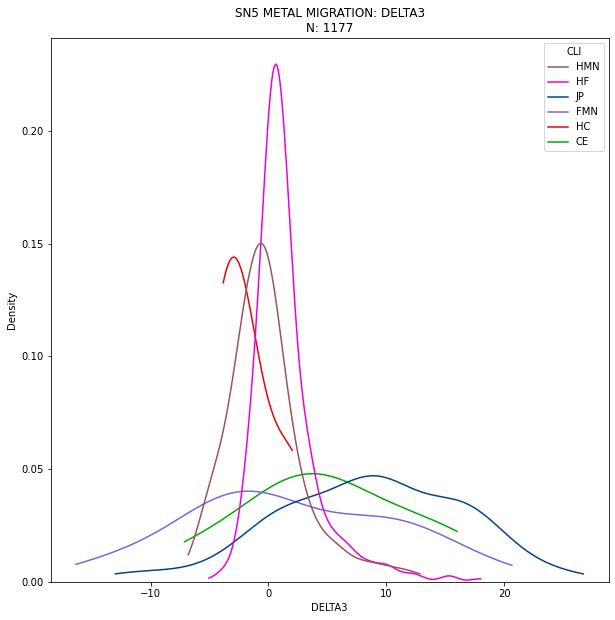

In [146]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'DELTA3'
delta = 'DELTA3'
df=df1a

kde=sea.kdeplot(data=df, x=delta, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

#plt.xlim(85, 105)

kde.set_title(proj + ' METAL MIGRATION: '+ grade + '\nN: ' + str(df[delta].count()))
fig.savefig(proj + '_' + grade + 'METAL_MIGRATION_KDE_GT5.jpeg', transparent=None)
plt.show()

## COMPARING GLOBAL GRADES

In [147]:
globals = ['CLI', 'FEGL', 'SIGL', 'PGL', 'ALGL', 'MNGL', 'PFGL', 'TIGL', 'MGGL', 'CAGL', 'FEGLA', 'SIGLA', 'PGLA', 'ALGLA', 'MNGLA', 'PFGLA', 'TIGLA', 'MGGLA', 'CAGLA']

In [148]:
df_global = fso.loc[:, globals ]

In [149]:
grades = ['FE', 'SI', 'P', 'AL', 'MN', 'PF']

In [150]:
for g in grades:
    df_global['DIF' + g] = df_global[g + 'GLA'] - df_global[g + 'GL'] 

In [151]:
df_global['TEOR']='teor'

In [152]:
df_global.head()

,CLI,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FEGLA,SIGLA,PGLA,ALGLA,MNGLA,PFGLA,TIGLA,MGGLA,CAGLA,DIFFE,DIFSI,DIFP,DIFAL,DIFMN,DIFPF,TEOR
0,CE,65.91,NaN,0.12,NaN,0.03,4.49,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,teor
1,HC,66.96,NaN,0.11,NaN,0.02,2.81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,teor
2,HC,67.32,NaN,0.07,NaN,0.03,2.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,teor
3,HC,64.78,NaN,0.12,NaN,0.03,4.20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,teor
4,MD,56.91,NaN,0.17,NaN,0.10,9.35,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,teor


In [153]:
valid_rows = df_global['FEGL']. notna() & df_global['FEGLA']. notna()

In [154]:
df_gla_gl = df_global.loc[valid_rows, :].copy()

In [155]:
df_gla_gl.head()

,CLI,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FEGLA,SIGLA,PGLA,ALGLA,MNGLA,PFGLA,TIGLA,MGGLA,CAGLA,DIFFE,DIFSI,DIFP,DIFAL,DIFMN,DIFPF,TEOR
94,HF,68.47,0.58,0.02,0.43,0.09,0.85,0.03,0.03,0.01,68.43,0.58,0.03,0.43,0.10,0.85,0.03,0.03,0.01,-0.04,0.0,0.01,0.0,0.01,0.00,teor
95,HF,67.81,0.60,0.04,0.53,0.39,1.18,0.05,0.01,0.01,67.86,0.60,0.03,0.53,0.38,1.18,0.05,0.01,0.01,0.05,0.0,-0.01,0.0,-0.01,0.00,teor
108,HF,67.79,0.53,0.07,0.65,0.47,1.01,0.06,0.01,0.02,67.70,0.53,0.11,0.65,0.48,1.02,0.06,0.01,0.02,-0.09,0.0,0.04,0.0,0.01,0.01,teor
123,HF,67.45,0.63,0.02,0.50,0.97,1.05,0.04,0.01,0.01,67.42,0.63,0.03,0.50,0.97,1.05,0.04,0.01,0.01,-0.03,0.0,0.01,0.0,0.00,0.00,teor
124,HF,68.17,0.52,0.02,0.42,0.55,0.77,0.03,NaN,0.01,68.16,0.52,0.02,0.42,0.55,0.77,0.03,NaN,0.01,-0.01,0.0,0.00,0.0,0.00,0.00,teor


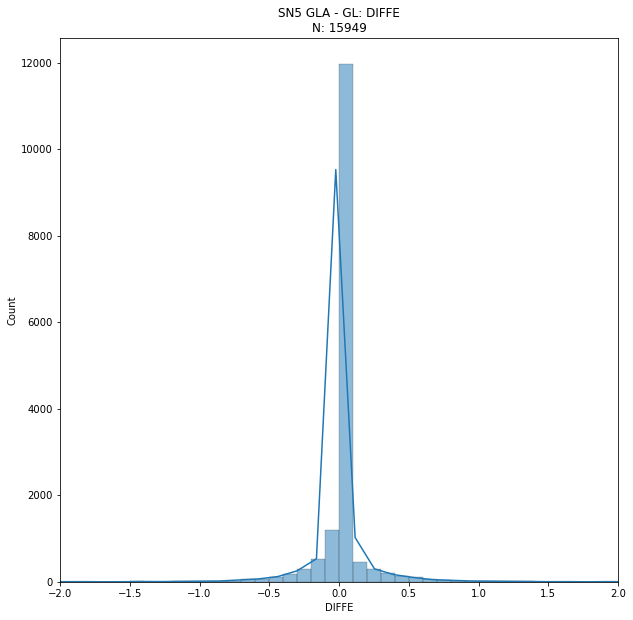

In [156]:
fig, ax = plt.subplots(figsize=chart_size)
grade = 'DIFFE'
df = df_gla_gl
kde = sea.histplot(data=df[grade],binwidth=0.1,kde=True)

plt.xlim(-2, 2)

kde.set_title(proj + ' GLA - GL: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_GRADE_DIFFERENCES_GLA_MINUS_GL.jpeg', transparent=None)
plt.show()

## VIOLIN PLOTS

In [157]:
# developing...

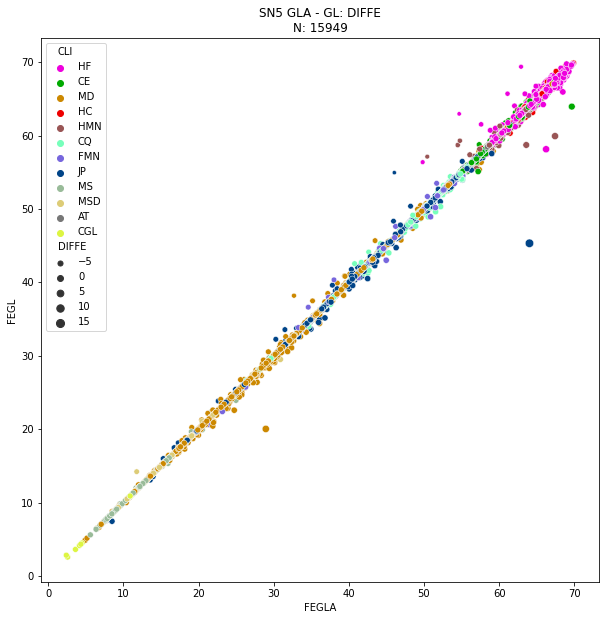

In [158]:
fig, ax = plt.subplots(figsize=chart_size)

df = df_gla_gl
grade ='DIFFE'

sca=sea.scatterplot(data=df, x="FEGLA", y="FEGL", hue="CLI",palette=litocolor, size=grade, alpha=1)

sca.set_title(proj + ' GLA - GL: '+ grade + '\nN: ' + str(df['FEGLA'].count()))

fig.savefig(proj +'_GLA - GL ' + grade + '_scatter.jpeg', transparent=None)
plt.show()

In [159]:
grades

['FE', 'SI', 'P', 'AL', 'MN', 'PF']

In [160]:
df_delta  = df_gla_gl.loc[:, ['CLI','DIFFE']]
df_delta.head(5)

,CLI,DIFFE
94,HF,-0.04
95,HF,0.05
108,HF,-0.09
123,HF,-0.03
124,HF,-0.01


In [161]:
#dictionary to control min max xlim:
data = {
    'FE':{'MIN':-2, 'MAX':2},
    'SI':{'MIN':-0.2, 'MAX':0.2},
    'P':{'MIN':-0.06, 'MAX':0.06},
    'FE':{'MIN':-2, 'MAX':2},
    'AL':{'MIN':-0.2, 'MAX':0.2},
    'MN':{'MIN':-1, 'MAX':1},
    'PF':{'MIN':-0.4, 'MAX':0.4}
}

In [162]:
data['FE']['MAX']

2

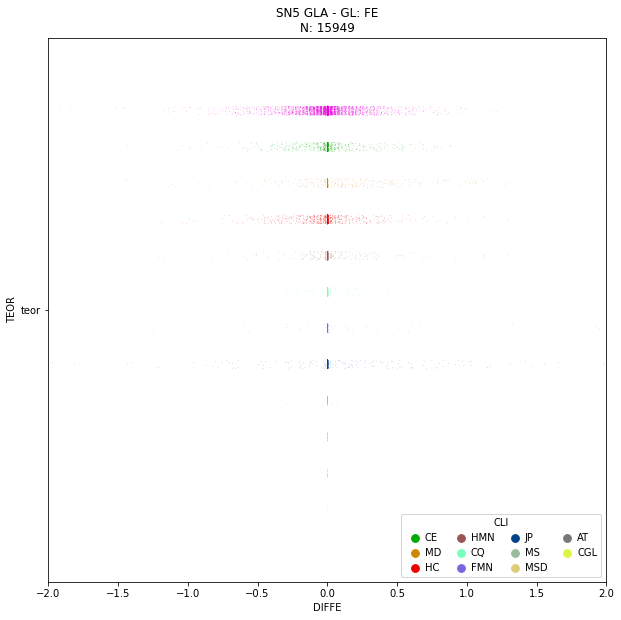

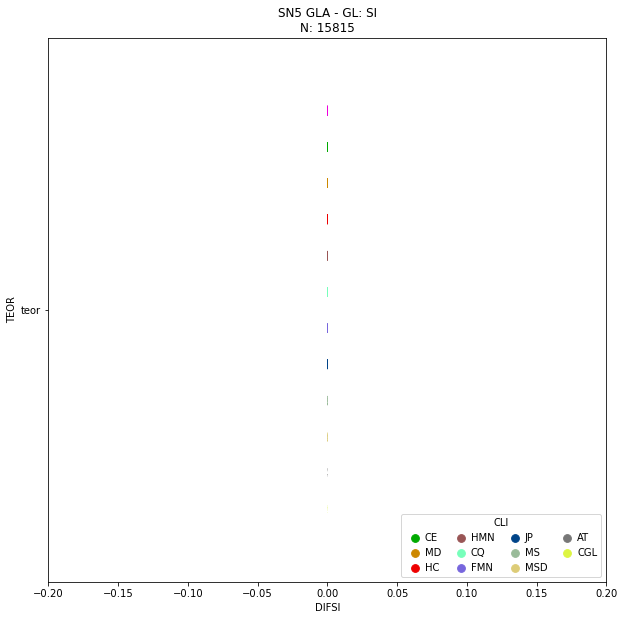

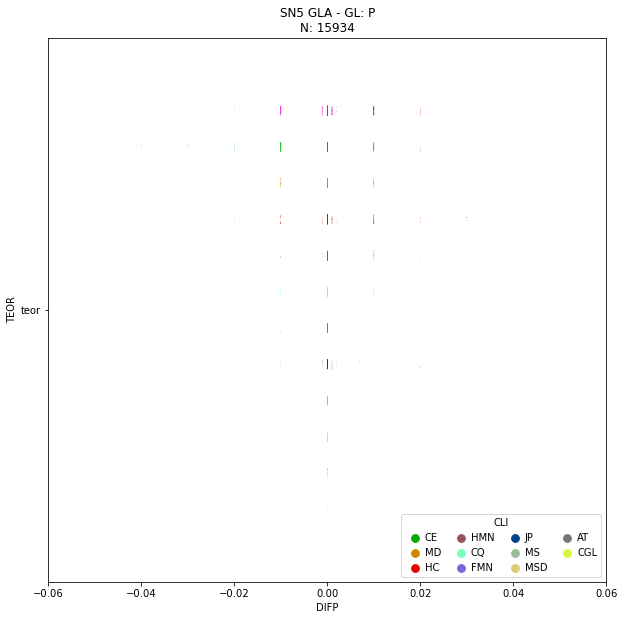

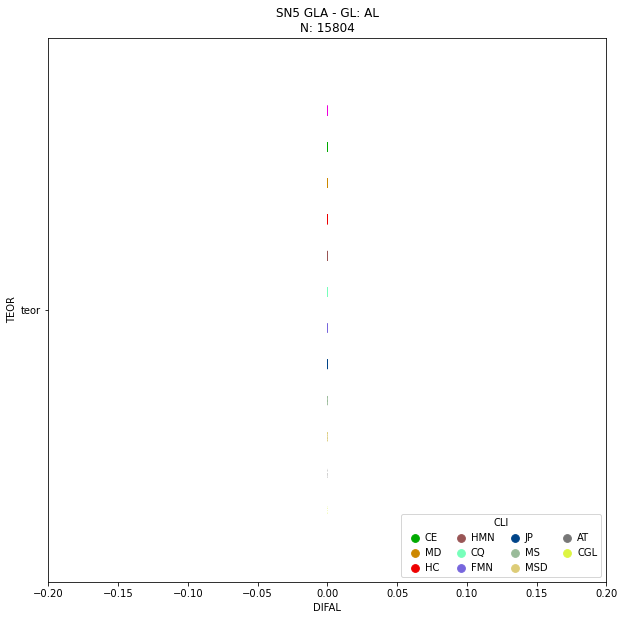

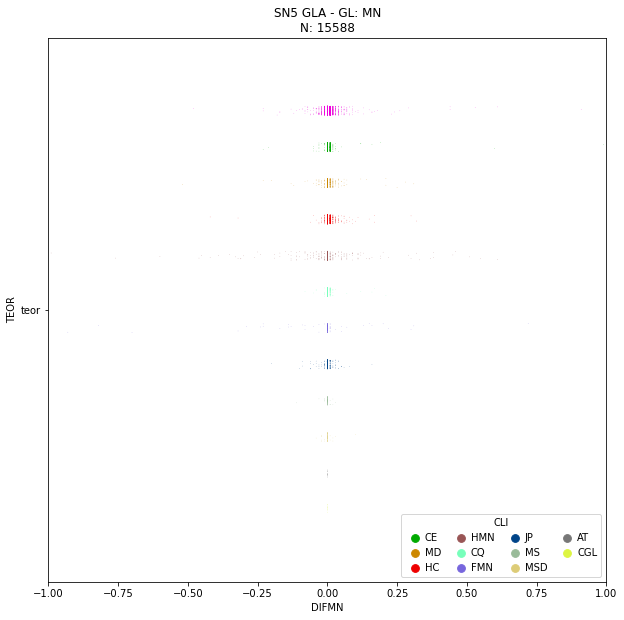

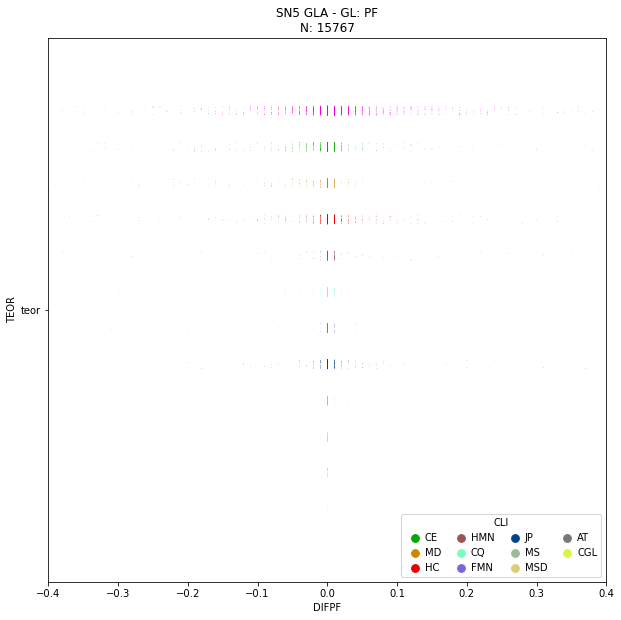

In [163]:
for t in grades:
    #df_delta  = df_gla_gl.loc[:, ['CLI', 'DIF' + t]]

    #df_delta_m = pd.melt(df_delta, 'CLI', var_name='DIF' + t)
    
    fig, ax = plt.subplots(figsize=chart_size)

    df = df_gla_gl

    # Show the conditional means
    #sea.pointplot(x="DIF" + t, y="TEOR", hue="CLI",
    #              data=df, dodge=.532, join=False, palette=litocolor,
    #              markers="d", scale=.75, ci=None)


    stp = sea.stripplot(x="DIF" + t, y="TEOR",hue="CLI", data=df, dodge=True, alpha=0.85, zorder=1, palette=litocolor , size=0.5)

    plt.xlim(data[t]['MIN'], data[t]['MAX'])
    #sea.pointplot(x="D_FEGL", y="TEOR", hue="CLI",
    #              data=df_gl, dodge=0.5, join=False, palette=litocolor,
    #              scale=.75, ci=None)
    
    stp.set_title(proj + ' GLA - GL: '+ t + '\nN: ' + str(df[t + 'GLA'].count())) 
    
    # Improve the legend 
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[1:], labels[1:], title="CLI",
              handletextpad=0, columnspacing=1,
              loc="lower right", ncol=4, frameon=True)
    
    fig.savefig(proj +'_GLA - GL ' + t + '_stripplot.jpeg', transparent=None)
    

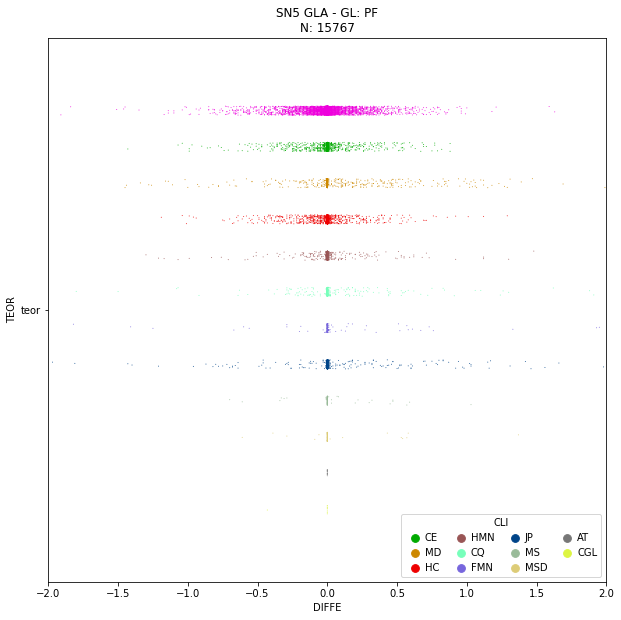

In [164]:
fig, ax = plt.subplots(figsize=chart_size)

df = df_gla_gl

    # Show the conditional means
    #sea.pointplot(x="value", y="measurement", hue="species",
    #              data=iris, dodge=.532, join=False, palette="dark",
    #              markers="d", scale=.75, ci=None)


stp = sea.stripplot(x="DIFFE", y="TEOR",hue="CLI", data=df, dodge=True, alpha=0.85, zorder=1, palette=litocolor, size=1)

plt.xlim(-2, 2)
    #sea.pointplot(x="D_FEGL", y="TEOR", hue="CLI",
    #              data=df_gl, dodge=0.5, join=False, palette=litocolor,
    #              scale=.75, ci=None)
    
stp.set_title(proj + ' GLA - GL: '+ t + '\nN: ' + str(df[t + 'GLA'].count())) 
    
    # Improve the legend 
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[1:], labels[1:], title="CLI",
        handletextpad=0, columnspacing=1,
        loc="lower right", ncol=4, frameon=True)

fig.savefig(proj +'_GLA - GL ' + t + '_stripplot.jpeg', transparent=None)
    

In [165]:
  #  df_delta_m.head(3)

In [ ]:
# there are 2 methods for grade assessment: 
# - straight total rock (know as 'global analisada')
# - weigthed mean grade derived from oversizes and respective grades;

# the difference read along our data, can provide us the noise assumed in qaqc protocols...

## SIMPLE BIF APROACH

In [166]:
df_gla_gl.head()

,CLI,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FEGLA,SIGLA,PGLA,ALGLA,MNGLA,PFGLA,TIGLA,MGGLA,CAGLA,DIFFE,DIFSI,DIFP,DIFAL,DIFMN,DIFPF,TEOR
94,HF,68.47,0.58,0.02,0.43,0.09,0.85,0.03,0.03,0.01,68.43,0.58,0.03,0.43,0.10,0.85,0.03,0.03,0.01,-0.04,0.0,0.01,0.0,0.01,0.00,teor
95,HF,67.81,0.60,0.04,0.53,0.39,1.18,0.05,0.01,0.01,67.86,0.60,0.03,0.53,0.38,1.18,0.05,0.01,0.01,0.05,0.0,-0.01,0.0,-0.01,0.00,teor
108,HF,67.79,0.53,0.07,0.65,0.47,1.01,0.06,0.01,0.02,67.70,0.53,0.11,0.65,0.48,1.02,0.06,0.01,0.02,-0.09,0.0,0.04,0.0,0.01,0.01,teor
123,HF,67.45,0.63,0.02,0.50,0.97,1.05,0.04,0.01,0.01,67.42,0.63,0.03,0.50,0.97,1.05,0.04,0.01,0.01,-0.03,0.0,0.01,0.0,0.00,0.00,teor
124,HF,68.17,0.52,0.02,0.42,0.55,0.77,0.03,NaN,0.01,68.16,0.52,0.02,0.42,0.55,0.77,0.03,NaN,0.01,-0.01,0.0,0.00,0.0,0.00,0.00,teor


###### SIMPLE BIF, HEMATITE, OTHER

###### OTHER ARGS: p, al, mn, pf, ca, ti, mg, k

In [167]:
df_gla_gl['BIF'] = df_gla_gl.apply( lambda x: simple_chem_bif(x['FEGLA'], x['SIGLA']), axis = 1)

df_gla_gl['HEM'] = df_gla_gl.apply( lambda x: naive_hematite(x['FEGLA']), axis = 1)

df_gla_gl['OTHER'] = df_gla_gl.apply( lambda x: other(x['PGLA'], x['ALGLA'], x['MNGLA'], x['PFGLA'], x['CAGLA'], x['TIGLA'], x['MGGLA'], 0.01), axis = 1)

df_gla_gl['MENORES'] = df_gla_gl.apply( lambda x: menores(x['CAGLA'], x['TIGLA'], x['MGGLA']), axis = 1)


In [168]:
df_gla_gl.head()

,CLI,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FEGLA,SIGLA,PGLA,ALGLA,MNGLA,PFGLA,TIGLA,MGGLA,CAGLA,DIFFE,DIFSI,DIFP,DIFAL,DIFMN,DIFPF,TEOR,BIF,HEM,OTHER,MENORES
94,HF,68.47,0.58,0.02,0.43,0.09,0.85,0.03,0.03,0.01,68.43,0.58,0.03,0.43,0.10,0.85,0.03,0.03,0.01,-0.04,0.0,0.01,0.0,0.01,0.00,teor,98.22961,97.64961,1.5847,0.07
95,HF,67.81,0.60,0.04,0.53,0.39,1.18,0.05,0.01,0.01,67.86,0.60,0.03,0.53,0.38,1.18,0.05,0.01,0.01,0.05,0.0,-0.01,0.0,-0.01,0.00,teor,97.43622,96.83622,2.4515,0.07
108,HF,67.79,0.53,0.07,0.65,0.47,1.01,0.06,0.01,0.02,67.70,0.53,0.11,0.65,0.48,1.02,0.06,0.01,0.02,-0.09,0.0,0.04,0.0,0.01,0.01,teor,97.13790,96.60790,2.7707,0.09
123,HF,67.45,0.63,0.02,0.50,0.97,1.05,0.04,0.01,0.01,67.42,0.63,0.03,0.50,0.97,1.05,0.04,0.01,0.01,-0.03,0.0,0.01,0.0,0.00,0.00,teor,96.83834,96.20834,3.2019,0.06
124,HF,68.17,0.52,0.02,0.42,0.55,0.77,0.03,NaN,0.01,68.16,0.52,0.02,0.42,0.55,0.77,0.03,NaN,0.01,-0.01,0.0,0.00,0.0,0.00,0.00,teor,97.78432,97.26432,NaN,NaN


In [169]:
# droping np.nan on ternary variables

In [170]:
tern = df_gla_gl.dropna(subset=['BIF', 'HEM', 'OTHER']).copy()

In [171]:
df_gla_gl.shape

(15949, 30)

In [172]:
tern.shape

(13135, 30)

In [173]:
# possible custom installation in your python environment ... see dependencies block above...

In [174]:
import ternary

###### NORMALIZE DATA

In [175]:
# make sure there are no important exceptions before normalization

In [176]:
cols = ['HEM', 'SIGLA', 'OTHER']

In [177]:
for col in cols:
    tern[col[0]] = tern[col] * 100 / tern[cols].sum(axis=1)

In [178]:
tern.head()

,CLI,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FEGLA,SIGLA,PGLA,ALGLA,MNGLA,PFGLA,TIGLA,MGGLA,CAGLA,DIFFE,DIFSI,DIFP,DIFAL,DIFMN,DIFPF,TEOR,BIF,HEM,OTHER,MENORES,H,S,O
94,HF,68.47,0.58,0.02,0.43,0.09,0.85,0.03,0.03,0.01,68.43,0.58,0.03,0.43,0.10,0.85,0.03,0.03,0.01,-0.04,0.0,0.01,0.0,0.01,0.00,teor,98.22961,97.64961,1.5847,0.07,97.831273,0.581079,1.587648
95,HF,67.81,0.60,0.04,0.53,0.39,1.18,0.05,0.01,0.01,67.86,0.60,0.03,0.53,0.38,1.18,0.05,0.01,0.01,0.05,0.0,-0.01,0.0,-0.01,0.00,teor,97.43622,96.83622,2.4515,0.07,96.945070,0.600674,2.454256
108,HF,67.79,0.53,0.07,0.65,0.47,1.01,0.06,0.01,0.02,67.70,0.53,0.11,0.65,0.48,1.02,0.06,0.01,0.02,-0.09,0.0,0.04,0.0,0.01,0.01,teor,97.13790,96.60790,2.7707,0.09,96.696280,0.530485,2.773235
123,HF,67.45,0.63,0.02,0.50,0.97,1.05,0.04,0.01,0.01,67.42,0.63,0.03,0.50,0.97,1.05,0.04,0.01,0.01,-0.03,0.0,0.01,0.0,0.00,0.00,teor,96.83834,96.20834,3.2019,0.06,96.169641,0.629747,3.200612
125,HF,67.25,0.69,0.03,0.58,1.06,1.05,0.04,0.01,0.03,67.21,0.69,0.03,0.58,1.07,1.06,0.04,0.01,0.03,-0.04,0.0,0.00,0.0,0.01,0.01,teor,96.59867,95.90867,3.4679,0.08,95.844866,0.689541,3.465593


In [179]:
mean= tern[['H', 'S', 'O']].mean(axis=0)
mean

H    88.287871
S     4.423164
O     7.288964
dtype: float64

In [180]:
litocolor

{'AG': '#FFEEBB',
 'AT': '#777777',
 'CE': '#00AA00',
 'CQ': '#77FFBB',
 'FMN': '#7766DD',
 'HC': '#EE0000',
 'HF': '#EE00DD',
 'HMN': '#995555',
 'JP': '#004488',
 'MD': '#CC8800',
 'MS': '#99BB99',
 'MSD': '#DDCC77',
 'SR': '#FFFFFF',
 'DT': '#FFFFFF',
 'CGL': '#DDF542'}

In [181]:
litocolor['JP']

'#004488'

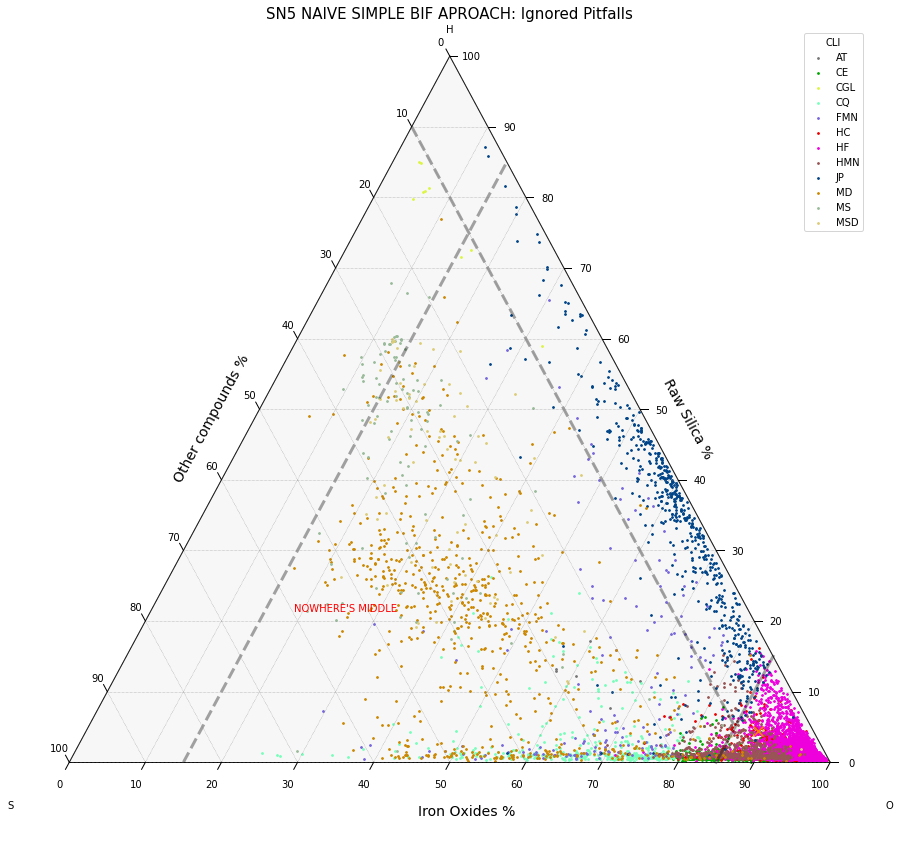

In [182]:
# Set up the figure.
fig, tax = ternary.figure(scale=100)
fig.set_size_inches(15,15)

# Plot the points in groups.
for name, group in tern.groupby('CLI'):
    
    # Note that we have to shuffle the order.
    # This will place Q at the top, F on the left.
    # So the column order is: right, top, left.
    points = group[['H', 'S', 'O']].values
    tax.scatter(points, marker='o', label=name, c=litocolor[name], s=3)
    #tax.scatter(points, marker='o', label=name, c=tern['CLI'].map(litocolor))

# Plot and label the mean.
tax.scatter([mean], marker='x', s=100)
tax.get_axes().text(29.5, 18.5, "NOWHERE'S MIDDLE", color='red')


# Axis labels. (See below for corner labels.)
fontsize = 14
offset = 0.08
tax.left_axis_label("Other compounds %", fontsize=fontsize, offset=offset)
tax.right_axis_label("Raw Silica %", fontsize=fontsize, offset=offset)
tax.bottom_axis_label("Iron Oxides %", fontsize=fontsize, offset=-offset)
tax.set_title(proj + " NAIVE SIMPLE BIF APROACH: Ignored Pitfalls", fontsize=15, pad=10)


# Draw some lines.
p1, p2 = (85,15, 0), (85, 0, 15)
tax.line(p1, p2, linewidth=3, color='k', alpha=0.35, linestyle="-")

p1, p2 = (0, 90, 10), (85, 5, 10)
tax.line(p1, p2, linewidth=3, color='k', alpha=0.35, linestyle="--")

p1, p2 = (15, 0, 85), (15, 85, 0)
tax.line(p1, p2, linewidth=3, color='k', alpha=0.35, linestyle="--")

# Corner labels.
fontsize = 10
offset = 0.1
tax.top_corner_label("H", fontsize=fontsize, offset=0.15)
tax.left_corner_label("S", fontsize=fontsize, offset=offset)
tax.right_corner_label("O", fontsize=fontsize, offset=offset)

# Decorations.
tax.legend(title="CLI")
tax.boundary(linewidth=1)
tax.gridlines(multiple=10, color="gray")
tax.ticks(axis='lbr', linewidth=1, multiple=10)
tax.get_axes().axis('off')

tax.show()

###### '''INSIGHTS: 
    - COMPOSIÇÕES FÁCEIS EM SN5;
    - BEDROCK QUÍMICO DE CONTRIBUIÇÃO SILICICLÁSTICA PEQUENA OU AUSENTE;
    - SEM ZONA DE FRONTEIRA NA INTERFACE DE CORROSÃO: SÃO RAROS SOMA DE OUTROS + SÍLICA > 7.0%
    - BARREN ROCK EM DIFERENTES ESTÁGIOS DE ALTERAÇÃO INTEMPÉRICA;
    - HÁ REGISTROS DE MD COM O MESMO PADRÃO DA CQ, TESTAR REGIONALIZAÇÃO E RECOMENDÁVEL RETORNO À CAIXA DE TESTEMUNHO;
    - ALGUNS REGISTROS INTERPRETADOS COMO JP SUGEREM SER AMOSTRAS DE FORTE CONTAMINAÇÃO OU MESMO AMOSTRAGEM REALIZADA SOBRE 
       MAIS DE 1 COMPOSIÇÃO;
    - HÁ AMOSTRAS DE HEMATITA COMPACTA COM DIFERENCIAIS DE SÍLICA ~10% (METALOGÊNESE INDEPENDENTE?);
    - GRUPO DE HEMATITAS MANGANESÍFERAS + FERRO MANGANÊS SUGERE POSSÍVEL MINERALOGIA MENOS ACURADA FAZENDO-SE USO DA NOSSA 
       FÓRMULA DE FECHAMENTO ESTEQUIOMÉTRICO (SER MENOS RIGOROS COM FQS DESSA CLASSE; ESTUDAR COM PETROGRAFIA QUANTITATIVA;)
    - JP's CONVENCIONAIS RARAMENTE SÃO PIORES DO QUE MEIO BANDAMENTO(EXPECTATIVA DE COMUM DE TEORES SUPERIORES A 35% FEGL);
    - ENCAIXANTE QUANDO FRESCA, RARAMENTE PASSA DE 20% FEGL, COM SÍLICA BRUTA COMUM EM SEQ METAVULCANOSEDIMENTARES INTRA CRATON;
'''

###### BIF KDE

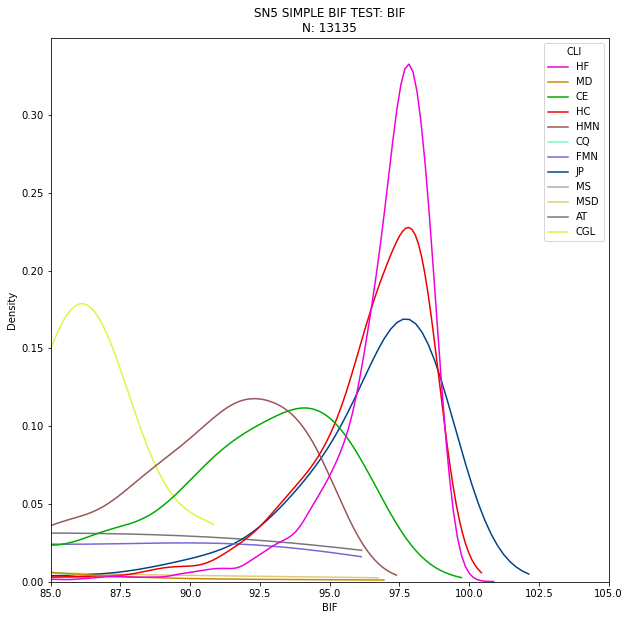

In [183]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'BIF'

df = tern

kde=sea.kdeplot(data=df, x=grade, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

plt.xlim(85, 105)

kde.set_title(proj + ' SIMPLE BIF TEST: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + 'SIMPLE_BIF_GLA.jpeg', transparent=None)
plt.show()

In [184]:
tern_ff = tern.loc[tern.CLI.isin(ff_rocks),:].copy()

In [185]:
tern_wst = tern.loc[~tern.CLI.isin(ff_rocks),:].copy()

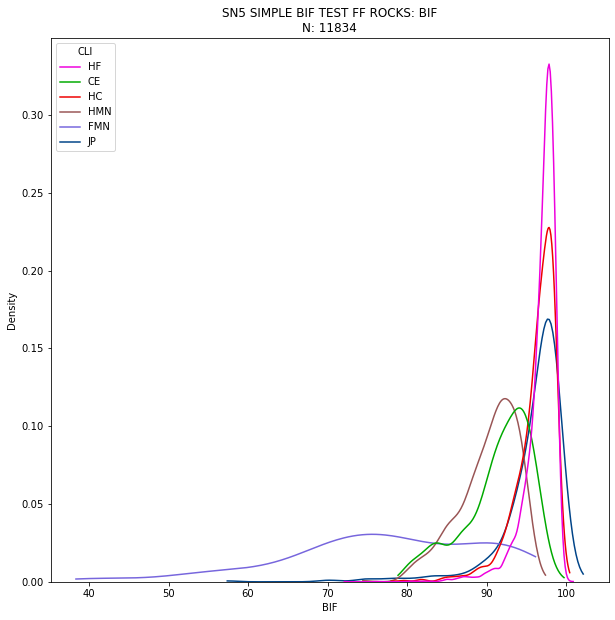

In [186]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'BIF'

df = tern_ff

kde=sea.kdeplot(data=df, x=grade, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

#plt.xlim(85, 105)

kde.set_title(proj + ' SIMPLE BIF TEST FF ROCKS: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + 'SIMPLE_BIF_FF_ROCKS_GLA.jpeg', transparent=None)
plt.show()

In [187]:
# INSIGHT: COBERTURA E ROCHAS COM MN NÃO RESOLVEM BEM COM REDUÇÃO SÍLICA HEMATITA

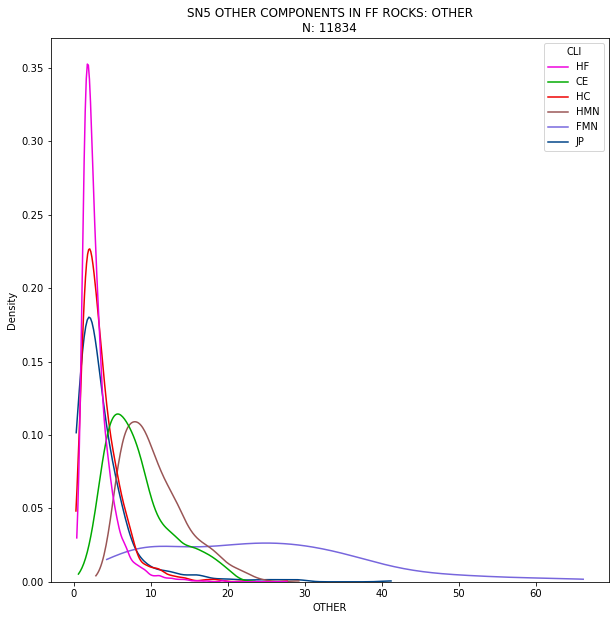

In [188]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'OTHER'

df = tern_ff

kde=sea.kdeplot(data=df, x=grade, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

#plt.xlim(85, 40)

kde.set_title(proj + ' OTHER COMPONENTS IN FF ROCKS: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_ROCKS_GLA.jpeg', transparent=None)
plt.show()

###### RELEVANCIA DE MENORES (CA, TI, MG)

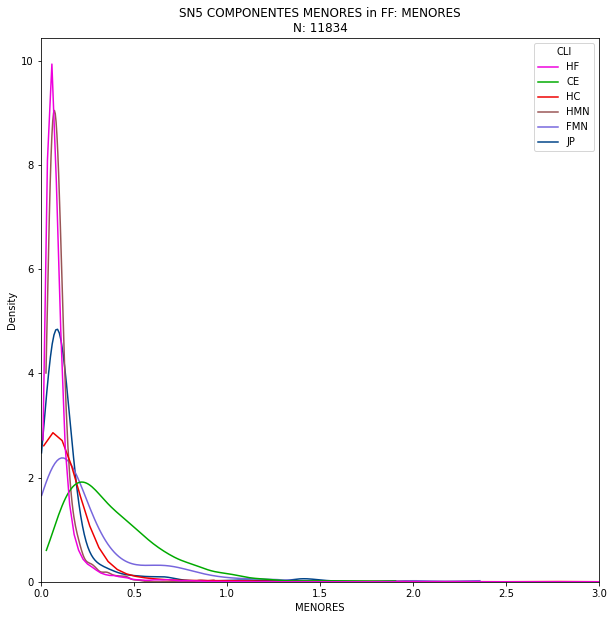

In [189]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'MENORES'

df = tern_ff

kde=sea.kdeplot(data=df, x=grade, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

plt.xlim(0, 3)

kde.set_title(proj + ' COMPONENTES MENORES in FF: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_FF_ROCKS_GLA.jpeg', transparent=None)
plt.show()

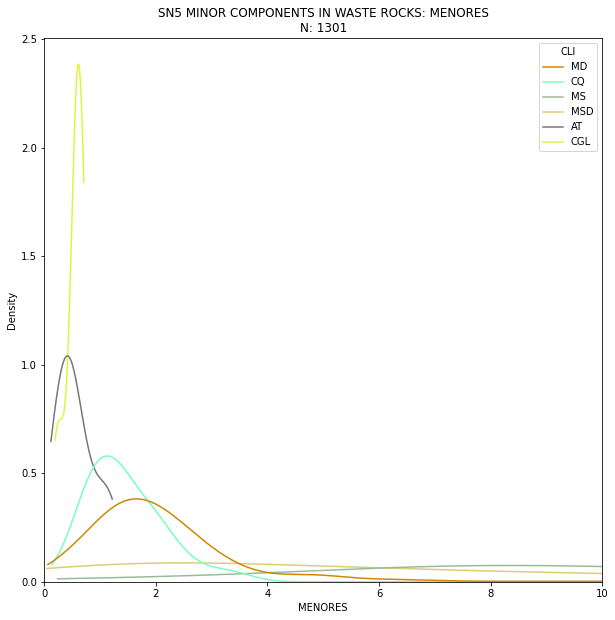

In [190]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'MENORES'

df = tern_wst

kde=sea.kdeplot(data=df, x=grade, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

plt.xlim(0, 10)

kde.set_title(proj + ' MINOR COMPONENTS IN WASTE ROCKS: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_WASTE_ROCKS_GLA.jpeg', transparent=None)
plt.show()

In [191]:
#NEXT STEP: SEE SN5_BASIC_STATS_TABLE.ipynb

In [192]:
# SN5_basic_stats_table_GLA.xlsx
# SN5_basic_stats_table_GL.xlsx
# SN5_basic_stats_table_G1A.xlsx
# SN5_basic_stats_table_G1B.xlsx
# SN5_basic_stats_table_G2.xlsx
# SN5_basic_stats_table_G3.xlsx


## READING DATA AVAILABLE

#### GLOBAL GRADES

In [193]:
fso.head(3)

,FURO,NA,DE,ATE,LENGTH,CLV,CLM,CLI,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FOGL,KGL,CUGL,G1,G1A,G1B,G2,G2A,G2B,G3,FE1,SI1,P1,AL1,MN1,PF1,TI1,MG1,CA1,FO1,K1,CU1,FE1A,SI1A,P1A,AL1A,MN1A,PF1A,TI1A,MG1A,CA1A,FO1A,K1A,CU1A,FE1B,SI1B,P1B,AL1B,MN1B,PF1B,TI1B,MG1B,CA1B,FO1B,K1B,CU1B,FE2,SI2,P2,AL2,MN2,PF2,TI2,MG2,CA2,FO2,K2,CU2,FE2A,SI2A,P2A,AL2A,MN2A,PF2A,TI2A,MG2A,CA2A,FO2A,K2A,CU2A,FE2B,SI2B,P2B,AL2B,MN2B,PF2B,TI2B,MG2B,CA2B,FO2B,K2B,CU2B,FE3,SI3,P3,AL3,MN3,PF3,TI3,MG3,CA3,FO3,K3,CU3,FQGL,FQ1,FQ1A,FQ1B,FQ2,FQ2A,FQ2B,FQ3,FGRA,REC_P,FL_AN,FEGLA,SIGLA,PGLA,ALGLA,MNGLA,PFGLA,TIGLA,MGGLA,CAGLA,FOGLA,KGLA,CUGLA,FQ_GLA,STATUS
0,FRN5E-0092,FRN5E-0092-001,0.00,12.60,12.60,CM,CE,CE,65.91,NaN,0.12,NaN,0.03,4.49,NaN,NaN,NaN,NaN,NaN,NaN,82.29,67.16,15.13,16.88,NaN,NaN,0.68,65.84,0.34,0.12,1.18,0.03,4.60,0.13,0.003,0.001,NaN,NaN,0.001,65.80,0.34,0.12,1.21,0.03,4.65,0.14,0.003,0.001,NaN,NaN,NaN,66.05,0.36,0.12,1.03,0.03,4.37,0.12,0.004,0.001,NaN,NaN,NaN,66.37,0.37,0.11,0.95,0.02,3.88,0.11,0.002,0.003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,62.34,1.27,0.20,1.77,0.08,6.95,0.25,0.020,0.02,NaN,NaN,NaN,100.70,100.74,100.77,100.65,100.49,NaN,NaN,99.98,99.86,NaN,TPCP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,FRN5E-0092,FRN5E-0092-002,12.60,18.65,6.05,HD,HC,HC,66.96,NaN,0.11,NaN,0.02,2.81,NaN,NaN,NaN,NaN,NaN,NaN,82.57,71.79,10.78,16.67,NaN,NaN,0.56,66.95,0.32,0.11,0.67,0.02,2.83,0.07,0.002,0.002,NaN,NaN,0.002,66.96,0.31,0.11,0.65,0.02,2.77,0.07,0.002,0.002,NaN,NaN,NaN,66.88,0.33,0.12,0.77,0.02,3.26,0.08,0.004,0.003,NaN,NaN,NaN,67.17,0.33,0.11,0.69,0.02,2.57,0.08,0.004,0.008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63.57,0.76,0.23,1.39,0.04,6.06,0.23,0.010,0.06,NaN,NaN,NaN,99.94,99.92,99.85,100.38,100.00,NaN,NaN,99.99,99.82,NaN,TPCP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,FRN5E-0092,FRN5E-0092-003,18.65,26.15,7.50,HM,HC,HC,67.32,NaN,0.07,NaN,0.03,2.04,NaN,NaN,NaN,NaN,NaN,NaN,63.66,55.53,8.13,33.49,NaN,NaN,2.69,67.10,0.27,0.08,0.67,0.03,2.20,0.10,0.002,0.004,NaN,NaN,0.004,67.09,0.27,0.08,0.68,0.03,2.23,0.09,0.002,0.004,NaN,NaN,NaN,67.18,0.30,0.06,0.64,0.04,2.03,0.17,0.004,0.008,NaN,NaN,NaN,67.89,0.31,0.05,0.61,0.03,1.66,0.16,0.003,0.010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65.55,0.58,0.10,0.97,0.05,3.19,1.16,0.008,0.06,NaN,NaN,NaN,99.64,99.44,99.45,99.40,99.99,NaN,NaN,99.99,99.84,NaN,TPCP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [194]:
df_gl = fso.loc[:, 'CLI': 'CUGL']

In [195]:
df_gl_counts=df_gl.count()

df_gl_counts

CLI     26900
FEGL    18589
SIGL    15824
PGL     18574
ALGL    15815
MNGL    18223
PFGL    18404
TIGL    13896
MGGL    14085
CAGL    14132
FOGL     1728
KGL     12672
CUGL     2675
dtype: int64

In [196]:
df_gl.describe()

,FEGL,SIGL,PGL,ALGL,MNGL,PFGL,TIGL,MGGL,CAGL,FOGL,KGL,CUGL
count,18589.000000,15824.000000,18574.000000,15815.000000,18223.000000,18404.000000,13896.000000,14085.000000,14132.000000,1728.000000,12672.000000,2675.000000
mean,61.540324,4.172664,0.056003,2.806873,0.589246,2.804564,0.231935,0.159259,0.026717,0.804225,0.067205,0.019760
std,11.693752,9.831251,0.099570,5.557774,1.698793,3.407699,0.499327,1.118370,0.371984,1.482738,0.420727,0.039037
min,2.580000,0.010000,0.000000,0.010000,0.001000,-0.350000,0.001000,0.001000,0.001000,0.090000,0.001000,0.001000
25%,62.100000,0.640000,0.010000,0.470000,0.050000,0.880000,0.020000,0.020000,0.008000,0.200000,0.007000,0.005000
50%,66.470000,0.910000,0.020000,0.820000,0.110000,1.500000,0.040000,0.020000,0.010000,0.500000,0.010000,0.010000
75%,67.850000,1.810000,0.060000,1.830000,0.410000,3.070000,0.140000,0.040000,0.010000,0.800000,0.030000,0.020000
max,69.900000,86.940000,3.740000,45.650000,38.160000,28.920000,6.790000,30.840000,32.480000,17.290000,7.970000,1.000000


In [197]:
df_gl_counts[1]

18589

In [198]:
df_gl.columns

Index(['CLI', 'FEGL', 'SIGL', 'PGL', 'ALGL', 'MNGL', 'PFGL', 'TIGL', 'MGGL',
       'CAGL', 'FOGL', 'KGL', 'CUGL'],
      dtype='object')

<AxesSubplot:xlabel='CLI', ylabel='count'>

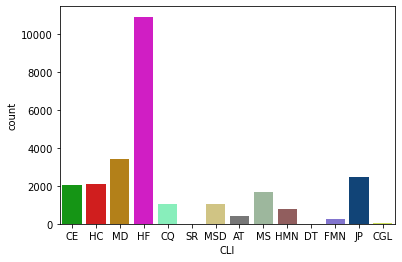

In [199]:
sea.countplot(x='CLI', data=df_gl, palette=litocolor)

In [200]:
# refining omiting last 3 variables...

In [201]:
VCOUNT = df_gl.count()

In [202]:
VCOUNT

CLI     26900
FEGL    18589
SIGL    15824
PGL     18574
ALGL    15815
MNGL    18223
PFGL    18404
TIGL    13896
MGGL    14085
CAGL    14132
FOGL     1728
KGL     12672
CUGL     2675
dtype: int64

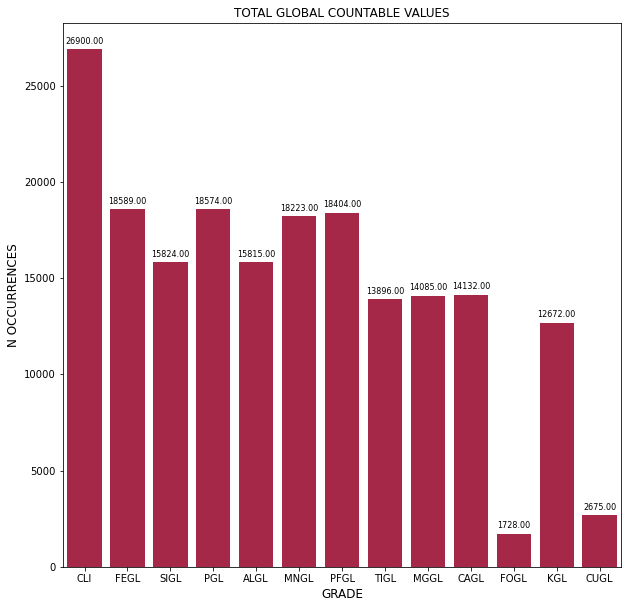

In [203]:
fig=plt.figure(figsize=chart_size)

plots=sea.barplot(x=VCOUNT.index, y=VCOUNT.values, color=valecolor['VERMELHO'])

# ITERATING OVER THE THE BARS
for bar in plots.patches:
    # Using Matplotlib's annotate function and
    # passing the coordinates where the annotation shall be done
    # x-coordinate: bar.get_x() + bar.get_width() / 2
    # y-coordinate: bar.get_height()
    # free space to be left to make graph pleasing: (0, 8)
    # ha and va stand for the horizontal and vertical alignment
    plots.annotate(format(bar.get_height(), '.2f'), 
                   (bar.get_x() + bar.get_width() / 2, 
                    bar.get_height()), ha='center', va='center',
                   size=8, xytext=(0, 8),
                   textcoords='offset points')

plt.title('TOTAL GLOBAL COUNTABLE VALUES')
plt.ylabel('N OCCURRENCES', fontsize=12)
plt.xlabel('GRADE', fontsize=12)

plt.show()

fig.savefig(proj + '_GLOBAL_GRADE_counts.jpeg', transparent=None)

In [204]:
# INSIGHTS: 18589 AMOSTRAS COM FEGL ... NESSE NÍVEL, É POSSÍVEL APROVEITAR AQUELAS QUE NÃO APRESENTAM SÍLICA?
#         : 18589 - 15824 = 2765 AMOSTRAS COM SÍLICA E ALUMINA AUSENTE

In [205]:
index = fso['FEGL'].notna() & fso['SIGL'].isna() & fso['ALGL'].isna()

In [206]:
df = fso.loc[index, :]

In [207]:
df.shape

(2772, 136)

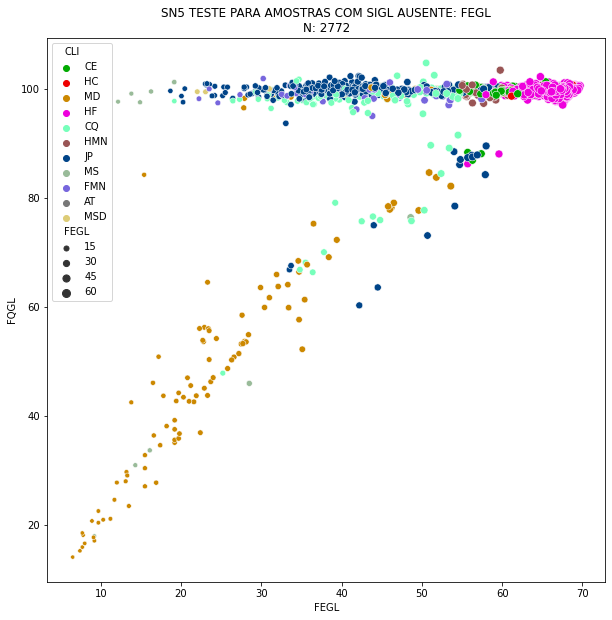

In [208]:
fig, ax = plt.subplots(figsize=chart_size)

df = df
grade ='FEGL'

sca=sea.scatterplot(data=df, x="FEGL", y="FQGL", hue="CLI",palette=litocolor, size=grade, alpha=1)

sca.set_title(proj + ' TESTE PARA AMOSTRAS COM SIGL AUSENTE: '+ grade + '\nN: ' + str(df['FEGL'].count()))

fig.savefig(proj +'_AMOSTRAS_SIGL_AUSENTE_' + grade + '_FQ_scatter.jpeg', transparent=None)
plt.show()

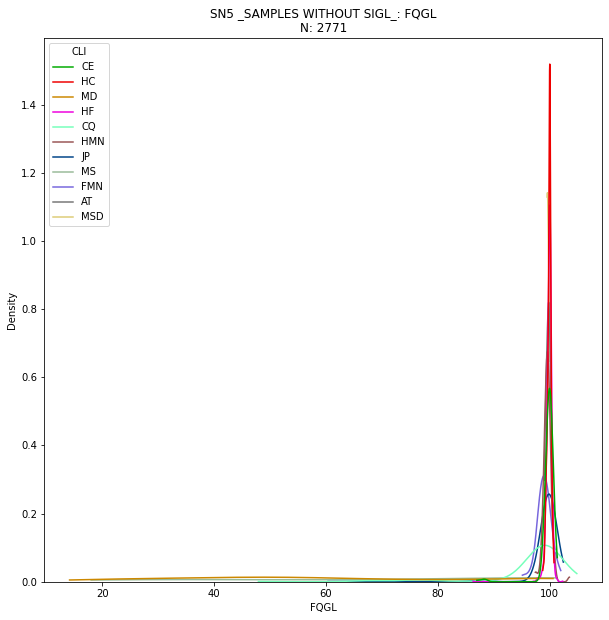

In [209]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'FQGL'

kde=sea.kdeplot(data=df, x=grade, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

#plt.xlim(0, 10)

kde.set_title(proj + ' _SAMPLES WITHOUT SIGL_: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_SAMPLES WITHOUT SIGL.jpeg', transparent=None)
plt.show()

In [210]:
# JUST REFINING RANGE:

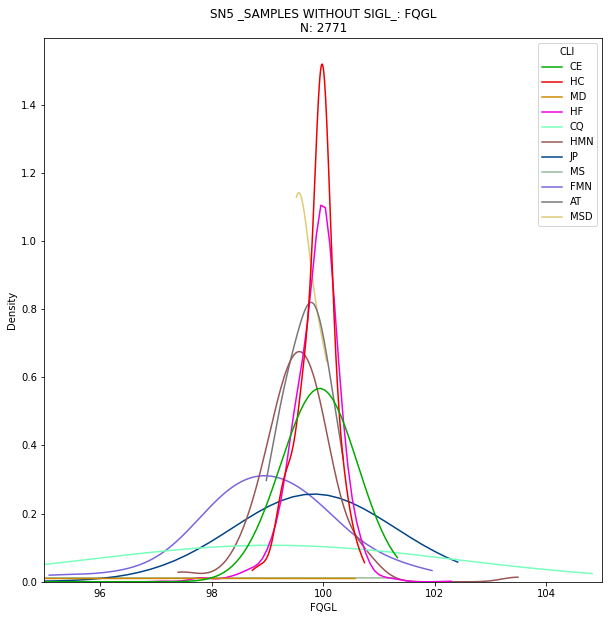

In [211]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'FQGL'

kde=sea.kdeplot(data=df, x=grade, hue="CLI", common_norm=False, palette=litocolor, alpha=.5, cut=0)

plt.xlim(95, 105)

kde.set_title(proj + ' _SAMPLES WITHOUT SIGL_: '+ grade + '\nN: ' + str(df[grade].count()))
#fig.savefig(proj + '_' + grade + '_SAMPLES WITHOUT SIGL.jpeg', transparent=None)
plt.show()

In [212]:
# INSIGHT: DÁ PARA APROVEITAR HC, HF E CE APLICANDO LD AOS FALTANTES COM FQGL ENTRE 98 E 102:
# 1926 registros de 2774, 15815 + 2774 = 18589
# sobrariam 848 amostras fora desse corredor de fechamentos, a maioria de MD, CQ e JP



## RETAINED OVERSIZES

In [213]:
df_gran = fso.loc[:, ['G1A', 'G1B', 'G2', 'G3', 'FGRA']]

total = df_gran.count()

total

G1A     10269
G1B     10269
G2      10269
G3      10269
FGRA    10269
dtype: int64

In [214]:
df_gran.describe()

,G1A,G1B,G2,G3,FGRA
count,10269.000000,10269.000000,10269.000000,10269.000000,10269.000000
mean,22.974736,10.180471,57.490796,9.201584,99.856846
std,30.199907,7.338143,27.873226,7.936834,0.452083
min,0.000000,0.000000,0.000000,0.000000,93.910000
25%,0.000000,4.480000,33.760000,2.470000,99.990000
50%,5.000000,9.010000,67.630000,7.170000,100.000000
75%,44.700000,14.590000,79.900000,14.590000,100.000000
max,100.000000,99.660000,98.720000,62.180000,100.370000


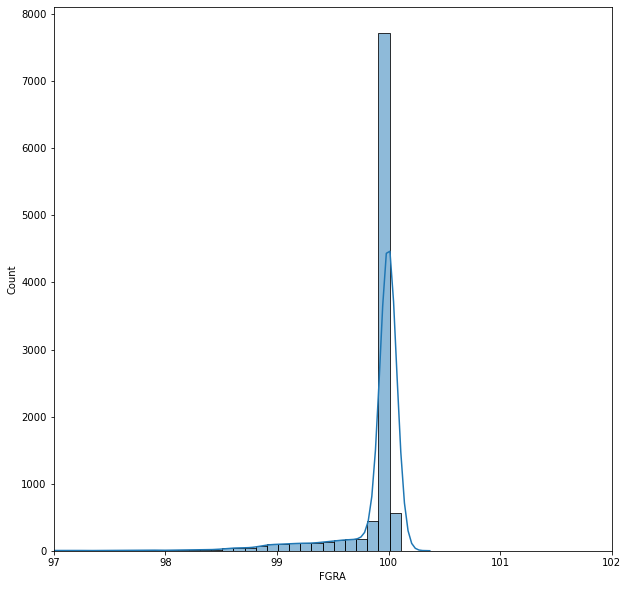

In [215]:
fig, ax = plt.subplots(figsize=chart_size) 

sea.histplot(data=df_gran, x='FGRA', kde=True, binwidth=0.1)
plt.xlim(97, 102)

plt.show()


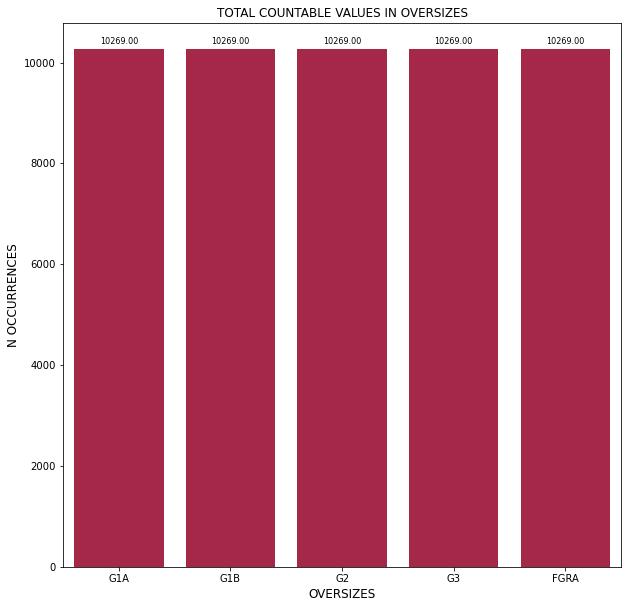

In [216]:
fig=plt.figure(figsize=chart_size)

plots=sea.barplot(x=total.index, y=total.values, color=valecolor['VERMELHO'])

# ITERATING OVER THE THE BARS
for bar in plots.patches:
    # Using Matplotlib's annotate function and
    # passing the coordinates where the annotation shall be done
    # x-coordinate: bar.get_x() + bar.get_width() / 2
    # y-coordinate: bar.get_height()
    # free space to be left to make graph pleasing: (0, 8)
    # ha and va stand for the horizontal and vertical alignment
    plots.annotate(format(bar.get_height(), '.2f'), 
                   (bar.get_x() + bar.get_width() / 2, 
                    bar.get_height()), ha='center', va='center',
                   size=8, xytext=(0, 8),
                   textcoords='offset points')

plt.title('TOTAL COUNTABLE VALUES IN OVERSIZES')
plt.ylabel('N OCCURRENCES', fontsize=12)
plt.xlabel('OVERSIZES', fontsize=12)

plt.show()

fig.savefig(proj + '_GS_COUNTABLE_VALUES.jpeg', transparent=None)

## PRE PROCESS ON DATA PATTERN IN FRACTIONS

## G1A -19 MM

In [217]:
df_g1a=fso.loc[0:, set_g1a]

In [218]:
df_g1a.head()

,G1A,FE1A,SI1A,P1A,AL1A,MN1A,PF1A,TI1A,MG1A,CA1A
0,67.16,65.80,0.34,0.12,1.21,0.03,4.65,0.14,0.003,0.001
1,71.79,66.96,0.31,0.11,0.65,0.02,2.77,0.07,0.002,0.002
2,55.53,67.09,0.27,0.08,0.68,0.03,2.23,0.09,0.002,0.004
3,60.94,65.91,0.36,0.11,1.25,0.03,3.42,0.11,0.003,0.004
4,22.57,62.89,0.51,0.16,3.28,0.05,6.24,0.29,0.010,0.004


In [219]:
stat = df_g1a.describe()
stat.style.apply(red_font_negatives, axis=0, subset=['PF1A'])

,G1A,FE1A,SI1A,P1A,AL1A,MN1A,PF1A,TI1A,MG1A,CA1A
count,10269.000000,6916.000000,6916.000000,6916.000000,6916.000000,9900.000000,6915.000000,6693.000000,6890.000000,6898.000000
mean,22.974736,57.360690,7.513749,0.080656,4.100033,0.837588,4.040991,0.256522,0.157658,0.019110
std,30.199907,12.234868,13.930878,0.130937,6.093858,2.354356,3.659119,0.449822,1.052990,0.076923
min,0.000000,2.330000,0.030000,0.001000,0.010000,0.004000,-0.730000,0.001000,0.001000,0.001000
25%,0.000000,51.755000,0.580000,0.010000,0.710000,0.050000,1.340000,0.030000,0.020000,0.008000
50%,5.000000,62.750000,0.990000,0.040000,1.610000,0.110000,2.970000,0.060000,0.030000,0.010000
75%,44.700000,66.200000,4.505000,0.110000,4.372500,0.480000,5.570000,0.250000,0.050000,0.010000
max,100.000000,69.750000,88.040000,3.980000,48.960000,38.350000,25.820000,3.780000,22.140000,3.630000


In [220]:
df_g1a['G1AZERO']=df_g1a.apply(lambda row: mass_is_zero(row['G1A']), axis=1)
df_g1a.head(100)

,G1A,FE1A,SI1A,P1A,AL1A,MN1A,PF1A,TI1A,MG1A,CA1A,G1AZERO
0,67.16,65.80,0.34,0.12,1.21,0.03,4.65,0.14,0.003,0.001,False
1,71.79,66.96,0.31,0.11,0.65,0.02,2.77,0.07,0.002,0.002,False
2,55.53,67.09,0.27,0.08,0.68,0.03,2.23,0.09,0.002,0.004,False
3,60.94,65.91,0.36,0.11,1.25,0.03,3.42,0.11,0.003,0.004,False
4,22.57,62.89,0.51,0.16,3.28,0.05,6.24,0.29,0.010,0.004,False
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
6,61.10,66.58,0.30,0.13,0.69,0.04,3.38,0.13,0.001,0.001,False
7,49.54,66.85,0.31,0.08,0.82,0.16,2.40,0.08,0.005,0.020,False
8,11.60,68.66,0.27,0.03,0.51,0.26,0.75,0.04,0.004,0.003,False
9,12.70,68.36,0.29,0.03,0.65,0.20,0.95,0.04,0.004,0.004,False


In [221]:
g1a_count = df_g1a.groupby('G1AZERO').count()[set_g1a]
g1a_count

,G1A,FE1A,SI1A,P1A,AL1A,MN1A,PF1A,TI1A,MG1A,CA1A
G1AZERO,,,,,,,,,,
False,6917,6916,6916,6916,6916,6917,6915,6693,6890,6898
True,3352,0,0,0,0,2983,0,0,0,0


In [222]:
# há teores de mn na 19 mm com valor 0

In [223]:
OVERSIZE_G1A=g1a_count.loc[0,:].values.tolist()

In [224]:
ZERO_G1A=g1a_count.loc[1,:].values.tolist()
ZERO_G1A
np.add(OVERSIZE_G1A,ZERO_G1A)

array([10269,  6916,  6916,  6916,  6916,  9900,  6915,  6693,  6890,
        6898])

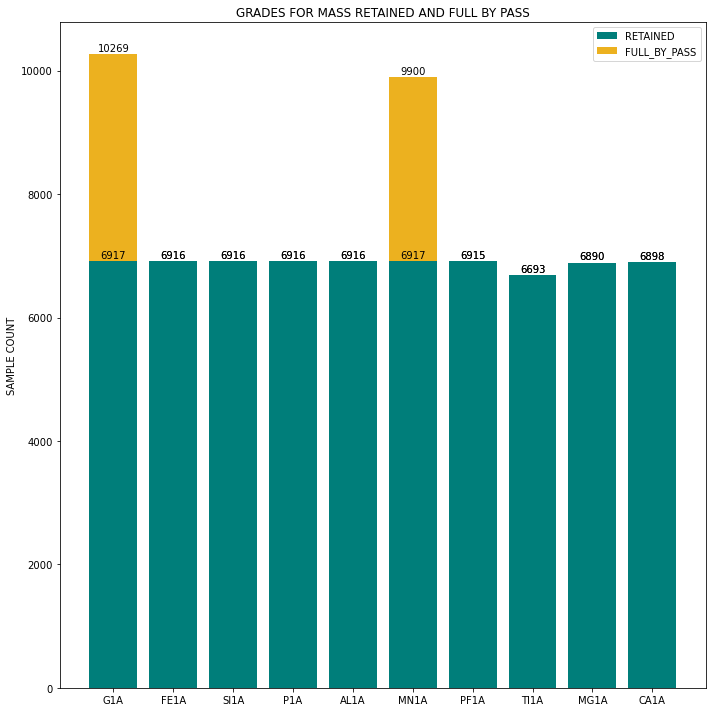

In [225]:
fig, ax = plt.subplots(figsize=chart_size)

barwidth=1

#x=np.arange(len(set_g1a))

rects1 = ax.bar(set_g1a, OVERSIZE_G1A, label='RETAINED', color=valecolor['VERDE'])
rects2 = ax.bar(set_g1a, ZERO_G1A, label='FULL_BY_PASS', bottom=OVERSIZE_G1A,color=valecolor['LARANJA'])

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('SAMPLE COUNT')
ax.set_title('GRADES FOR MASS RETAINED AND FULL BY PASS')
ax.set_xticks(set_g1a)
ax.set_xticklabels(set_g1a)
ax.legend()

ax.bar_label(rects1, padding=1)
ax.bar_label(rects2, padding=1)

fig.tight_layout()

fig.savefig(proj + '_G1A_VALUES_MASS_GRADE.jpeg', transparent=None)

In [226]:
# 1 amostra com massa retida não apresenta teores
# quase 3000 amostras com mn zero, mas deveria ser np.nan
# completar 1 PF
# completar 223 Ti
# completar 25 Mg
# completar 18 Ca
# avaliar e corrigir 5 Pf negativos
# checar e anular 2983

In [227]:
t=fso.PF1A < 0
d=fso.loc[t,:]

In [228]:
d.shape

(5, 136)

In [229]:
9900-6917

2983

In [230]:
6916 - 6898

18

## G1B - 8 MM

In [231]:
df_g1b=fso.loc[0:, set_g1b]

In [232]:
stat = df_g1b.describe()
stat.style.apply(red_font_negatives, axis=0, subset=['PF1B'])

,G1B,FE1B,SI1B,P1B,AL1B,MN1B,PF1B,TI1B,MG1B,CA1B
count,10269.000000,9787.000000,9787.000000,9787.000000,9787.000000,9786.000000,9787.000000,9498.000000,9757.000000,9757.000000
mean,10.180471,61.399376,4.634799,0.058949,2.942938,0.780652,3.019315,0.202615,0.092522,0.016350
std,7.338143,10.179820,9.858296,0.094892,5.366448,2.132508,3.270537,0.419070,0.751988,0.035588
min,0.000000,2.480000,0.030000,0.001000,0.010000,0.004000,-1.310000,0.001000,0.001000,0.001000
25%,4.480000,60.585000,0.640000,0.010000,0.570000,0.050000,1.060000,0.030000,0.010000,0.010000
50%,9.010000,65.510000,0.970000,0.020000,1.100000,0.120000,1.820000,0.050000,0.020000,0.010000
75%,14.590000,67.370000,2.610000,0.070000,2.360000,0.490000,3.610000,0.140000,0.040000,0.020000
max,99.660000,69.830000,84.540000,2.230000,44.370000,39.040000,25.270000,6.740000,22.700000,1.130000


In [233]:
df_g1b['G1BZERO']=df_g1b.apply(lambda row: mass_is_zero(row['G1B']), axis=1)
df_g1b.head(100)

,G1B,FE1B,SI1B,P1B,AL1B,MN1B,PF1B,TI1B,MG1B,CA1B,G1BZERO
0,15.13,66.05,0.36,0.12,1.03,0.03,4.37,0.12,0.004,0.001,False
1,10.78,66.88,0.33,0.12,0.77,0.02,3.26,0.08,0.004,0.003,False
2,8.13,67.18,0.30,0.06,0.64,0.04,2.03,0.17,0.004,0.008,False
3,12.94,64.07,0.65,0.12,2.56,0.03,4.53,0.19,0.010,0.006,False
4,18.07,59.71,0.58,0.16,5.59,0.07,7.93,0.37,0.020,0.006,False
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
6,16.85,66.70,0.33,0.12,0.70,0.05,3.13,0.11,0.003,0.005,False
7,16.97,67.52,0.32,0.07,0.62,0.28,1.90,0.07,0.003,0.004,False
8,17.82,68.02,0.35,0.04,0.66,0.35,1.11,0.05,0.004,0.006,False
9,13.52,67.20,0.34,0.05,1.14,0.24,1.89,0.09,0.007,0.004,False


In [234]:
g1b_count = df_g1b.groupby('G1BZERO').count()[set_g1b]
g1b_count

,G1B,FE1B,SI1B,P1B,AL1B,MN1B,PF1B,TI1B,MG1B,CA1B
G1BZERO,,,,,,,,,,
False,9787,9787,9787,9787,9787,9786,9787,9498,9757,9757
True,482,0,0,0,0,0,0,0,0,0


In [235]:
OVERSIZE_G1B=g1b_count.loc[0,:].values.tolist()
ZERO_G1B=g1b_count.loc[1,:].values.tolist()

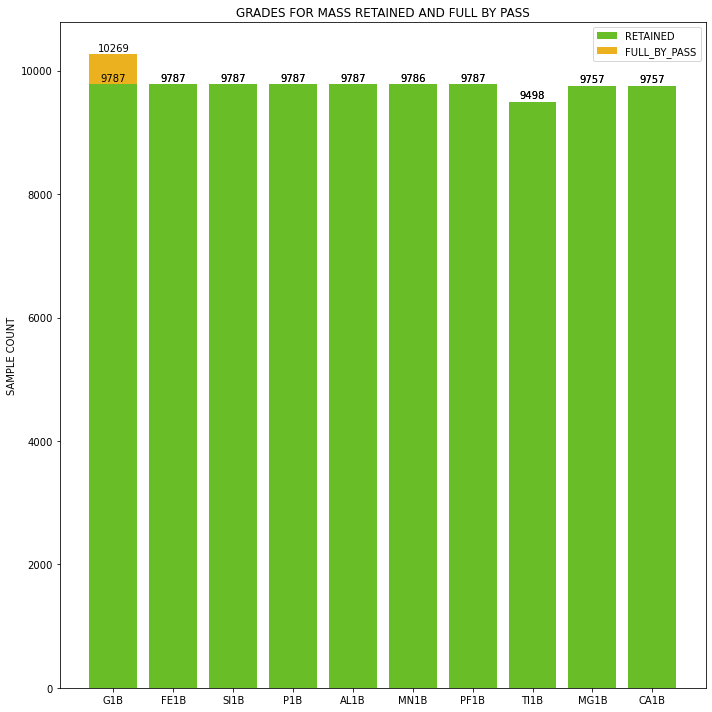

In [236]:
fig, ax = plt.subplots(figsize=chart_size)

barwidth=1

#x=np.arange(len(set_g1a))

rects1 = ax.bar(set_g1b, OVERSIZE_G1B, label='RETAINED', color=valecolor['VERDE2'])
rects2 = ax.bar(set_g1b, ZERO_G1B, label='FULL_BY_PASS', bottom=OVERSIZE_G1B,color=valecolor['LARANJA'])

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('SAMPLE COUNT')
ax.set_title('GRADES FOR MASS RETAINED AND FULL BY PASS')
ax.set_xticks(set_g1b)
ax.set_xticklabels(set_g1b)
ax.legend()

ax.bar_label(rects1, padding=1)
ax.bar_label(rects2, padding=1)

fig.tight_layout()

fig.savefig(proj + '_G1B_VALUES_MASS_GRADE.jpeg', transparent=None)

In [237]:
# completar menores com médias ou nn (tanto faz)
# corrigir pg negativa

## G2 - 0.15 MM

In [238]:
df_g2=fso.loc[0:, set_g2]

In [239]:
stat = df_g2.describe()
stat.style.apply(red_font_negatives, axis=0, subset=['PF2'])

,G2,FE2,SI2,P2,AL2,MN2,PF2,TI2,MG2,CA2
count,10269.000000,10113.000000,10113.000000,10113.000000,10113.000000,10109.000000,10112.000000,9819.000000,10076.000000,10091.000000
mean,57.490796,62.940089,3.860360,0.052028,2.452293,0.486138,2.513011,0.202709,0.075815,0.015187
std,27.873226,9.772329,8.704557,0.088271,5.258575,1.316051,3.228517,0.466844,0.623292,0.023893
min,0.000000,1.860000,0.030000,0.001000,0.010000,0.004000,0.010000,0.001000,0.001000,0.001000
25%,33.760000,63.270000,0.640000,0.010000,0.420000,0.050000,0.780000,0.020000,0.010000,0.010000
50%,67.630000,66.850000,0.940000,0.020000,0.710000,0.110000,1.260000,0.040000,0.020000,0.010000
75%,79.900000,68.030000,1.980000,0.050000,1.540000,0.390000,2.570000,0.100000,0.040000,0.020000
max,98.720000,69.950000,80.290000,1.650000,47.450000,34.200000,25.330000,6.580000,22.160000,0.860000


In [240]:
df_g2['G2ZERO']=df_g2.apply(lambda row: mass_is_zero(row['G2']), axis=1)
df_g2.head(100)

,G2,FE2,SI2,P2,AL2,MN2,PF2,TI2,MG2,CA2,G2ZERO
0,16.88,66.37,0.37,0.11,0.95,0.02,3.88,0.11,0.002,0.003,False
1,16.67,67.17,0.33,0.11,0.69,0.02,2.57,0.08,0.004,0.008,False
2,33.49,67.89,0.31,0.05,0.61,0.03,1.66,0.16,0.003,0.010,False
3,24.27,62.90,0.61,0.13,3.55,0.04,5.62,0.25,0.010,0.010,False
4,51.04,54.23,0.76,0.17,10.66,0.12,10.56,0.60,0.030,0.010,False
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
6,21.46,66.93,0.33,0.12,0.67,0.04,2.83,0.11,0.004,0.004,False
7,31.25,67.89,0.31,0.06,0.55,0.21,1.59,0.05,0.006,0.008,False
8,63.69,68.06,0.34,0.03,0.64,0.30,1.16,0.05,0.005,0.006,False
9,66.89,66.19,0.35,0.06,1.36,0.28,2.36,0.10,0.006,0.004,False


In [241]:
g2_count = df_g2.groupby('G2ZERO').count()[set_g2]
g2_count

,G2,FE2,SI2,P2,AL2,MN2,PF2,TI2,MG2,CA2
G2ZERO,,,,,,,,,,
False,10113,10113,10113,10113,10113,10109,10112,9819,10076,10091
True,156,0,0,0,0,0,0,0,0,0


In [242]:
OVERSIZE_G2=g2_count.loc[0,:].values.tolist()
ZERO_G2=g2_count.loc[1,:].values.tolist()

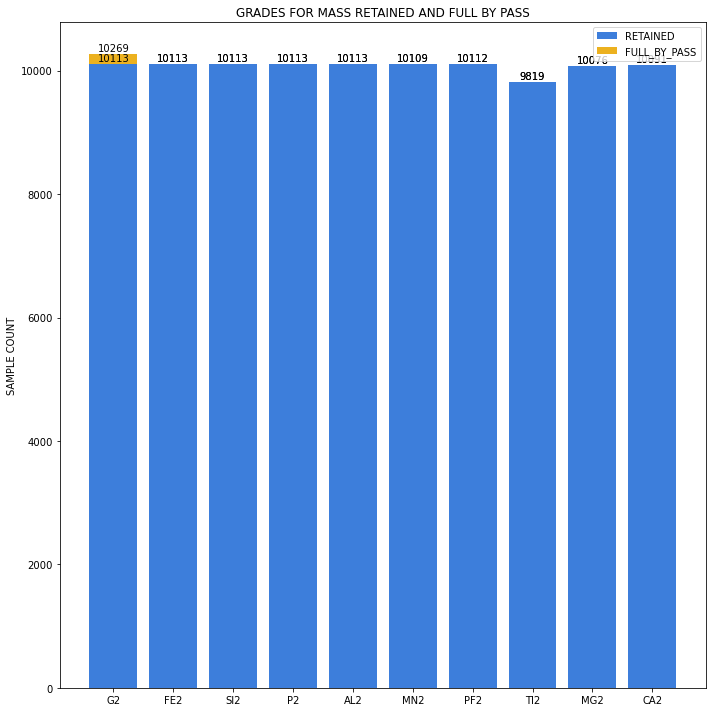

In [243]:
fig, ax = plt.subplots(figsize=chart_size)

barwidth=1

#x=np.arange(len(set_g1a))

rects1 = ax.bar(set_g2, OVERSIZE_G2, label='RETAINED', color=valecolor['AZUL'])
rects2 = ax.bar(set_g2, ZERO_G2, label='FULL_BY_PASS', bottom=OVERSIZE_G2,color=valecolor['LARANJA'])

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('SAMPLE COUNT')
ax.set_title('GRADES FOR MASS RETAINED AND FULL BY PASS')
ax.set_xticks(set_g2)
ax.set_xticklabels(set_g2)
ax.legend()

ax.bar_label(rects1, padding=1)
ax.bar_label(rects2, padding=1)

fig.tight_layout()

fig.savefig(proj + '_G2_VALUES_MASS_GRADE.jpeg', transparent=None)

In [244]:
# completar menores com medias por lito

## G3 - UNDERSIZE 0.15 MM

In [245]:
df_g3=fso.loc[0:, set_g3]

In [246]:
stat = df_g3.describe()
stat.style.apply(red_font_negatives, axis=0, subset=['PF3'])

,G3,FE3,SI3,P3,AL3,MN3,PF3,TI3,MG3,CA3
count,10269.000000,9976.000000,9976.000000,9976.000000,9976.000000,9976.000000,9975.000000,9700.000000,9965.000000,9966.000000
mean,9.201584,60.134741,5.972305,0.074871,3.253806,0.582194,3.264717,0.315646,0.093640,0.023987
std,7.936834,10.866332,11.382420,0.113473,5.164824,1.273334,3.278112,0.649612,0.564897,0.031199
min,0.000000,1.040000,0.080000,0.001000,0.030000,0.004000,0.080000,0.000000,0.001000,0.001000
25%,2.470000,58.547500,0.930000,0.020000,0.730000,0.070000,1.230000,0.040000,0.020000,0.010000
50%,7.170000,64.640000,1.740000,0.030000,1.350000,0.160000,1.980000,0.060000,0.040000,0.020000
75%,14.590000,66.830000,4.260000,0.080000,2.930000,0.552500,3.750000,0.220000,0.070000,0.030000
max,62.180000,69.780000,83.300000,2.040000,39.400000,34.980000,22.730000,10.070000,23.710000,0.990000


In [247]:
df_g3['G3ZERO']=df_g3.apply(lambda row: mass_is_zero(row['G3']), axis=1)
df_g3.head(100)

,G3,FE3,SI3,P3,AL3,MN3,PF3,TI3,MG3,CA3,G3ZERO
0,0.68,62.34,1.27,0.20,1.77,0.08,6.95,0.25,0.020,0.020,False
1,0.56,63.57,0.76,0.23,1.39,0.04,6.06,0.23,0.010,0.060,False
2,2.69,65.55,0.58,0.10,0.97,0.05,3.19,1.16,0.008,0.060,False
3,1.70,56.95,1.07,0.24,6.59,0.09,9.30,0.86,0.030,0.040,False
4,8.23,51.04,1.41,0.28,9.59,0.23,13.55,1.39,0.040,0.060,False
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
6,0.52,63.62,0.94,0.21,1.45,0.27,4.87,0.29,0.020,0.010,False
7,2.12,64.81,1.01,0.13,1.01,0.73,3.16,0.11,0.020,0.020,False
8,5.94,64.03,1.17,0.10,1.73,1.30,3.39,0.14,0.030,0.020,False
9,6.86,60.23,0.77,0.17,3.88,0.83,6.50,0.31,0.020,0.010,False


In [248]:
g3_count = df_g3.groupby('G3ZERO').count()[set_g3]
g3_count

,G3,FE3,SI3,P3,AL3,MN3,PF3,TI3,MG3,CA3
G3ZERO,,,,,,,,,,
False,9976,9976,9976,9976,9976,9976,9975,9700,9965,9966
True,293,0,0,0,0,0,0,0,0,0


In [249]:
OVERSIZE_G3=g3_count.loc[0,:].values.tolist()
ZERO_G3=g3_count.loc[1,:].values.tolist()

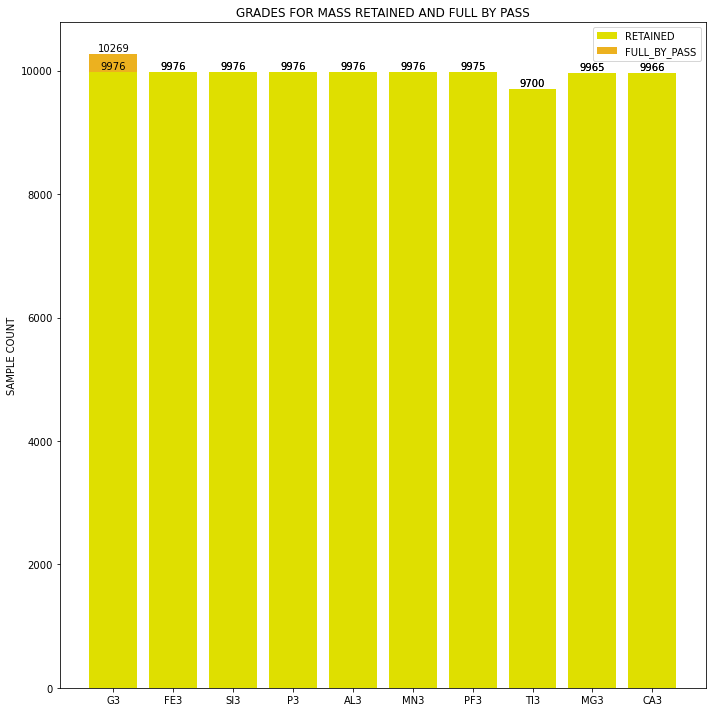

In [250]:
fig, ax = plt.subplots(figsize=chart_size)

barwidth=1

#x=np.arange(len(set_g1a))

rects1 = ax.bar(set_g3, OVERSIZE_G3, label='RETAINED', color=valecolor['AMARELO'])
rects2 = ax.bar(set_g3, ZERO_G3, label='FULL_BY_PASS', bottom=OVERSIZE_G3,color=valecolor['LARANJA'])

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('SAMPLE COUNT')
ax.set_title('GRADES FOR MASS RETAINED AND FULL BY PASS')
ax.set_xticks(set_g3)
ax.set_xticklabels(set_g3)
ax.legend()

ax.bar_label(rects1, padding=1)
ax.bar_label(rects2, padding=1)

fig.tight_layout()

fig.savefig(proj + '_G3_VALUES_MASS_GRADE.jpeg', transparent=None)

## FQ COMPARISSON

In [251]:
i = fso['FEGL'].notna()

In [252]:
fso.loc[i, ['NFQGL']] = fso[i].apply(lambda x: fq(x.FEGL, x.SIGL, x.PGL, x.ALGL, x.MNGL, x.PFGL, x.TIGL, x.MGGL, x.CAGL), axis =1)

In [253]:
df=fso
df.columns.to_list()

['FURO',
 'NA',
 'DE',
 'ATE',
 'LENGTH',
 'CLV',
 'CLM',
 'CLI',
 'FEGL',
 'SIGL',
 'PGL',
 'ALGL',
 'MNGL',
 'PFGL',
 'TIGL',
 'MGGL',
 'CAGL',
 'FOGL',
 'KGL',
 'CUGL',
 'G1',
 'G1A',
 'G1B',
 'G2',
 'G2A',
 'G2B',
 'G3',
 'FE1',
 'SI1',
 'P1',
 'AL1',
 'MN1',
 'PF1',
 'TI1',
 'MG1',
 'CA1',
 'FO1',
 'K1',
 'CU1',
 'FE1A',
 'SI1A',
 'P1A',
 'AL1A',
 'MN1A',
 'PF1A',
 'TI1A',
 'MG1A',
 'CA1A',
 'FO1A',
 'K1A',
 'CU1A',
 'FE1B',
 'SI1B',
 'P1B',
 'AL1B',
 'MN1B',
 'PF1B',
 'TI1B',
 'MG1B',
 'CA1B',
 'FO1B',
 'K1B',
 'CU1B',
 'FE2',
 'SI2',
 'P2',
 'AL2',
 'MN2',
 'PF2',
 'TI2',
 'MG2',
 'CA2',
 'FO2',
 'K2',
 'CU2',
 'FE2A',
 'SI2A',
 'P2A',
 'AL2A',
 'MN2A',
 'PF2A',
 'TI2A',
 'MG2A',
 'CA2A',
 'FO2A',
 'K2A',
 'CU2A',
 'FE2B',
 'SI2B',
 'P2B',
 'AL2B',
 'MN2B',
 'PF2B',
 'TI2B',
 'MG2B',
 'CA2B',
 'FO2B',
 'K2B',
 'CU2B',
 'FE3',
 'SI3',
 'P3',
 'AL3',
 'MN3',
 'PF3',
 'TI3',
 'MG3',
 'CA3',
 'FO3',
 'K3',
 'CU3',
 'FQGL',
 'FQ1',
 'FQ1A',
 'FQ1B',
 'FQ2',
 'FQ2A',
 'FQ2B',
 'FQ3',


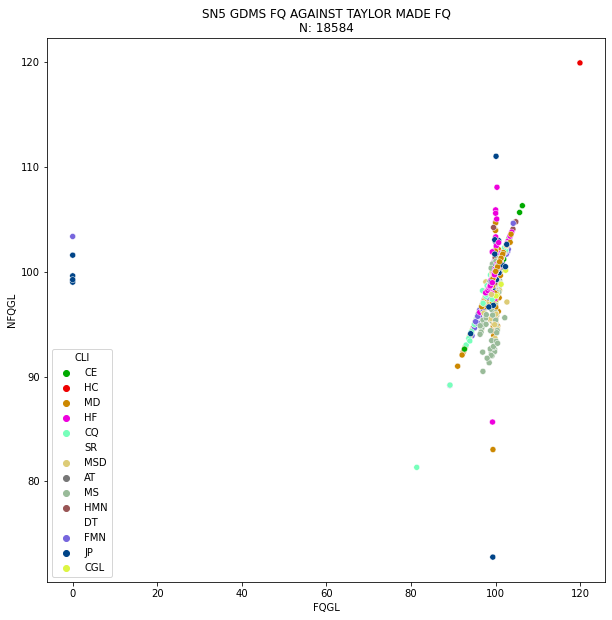

In [254]:
fig, ax = plt.subplots(figsize=chart_size)

df=df

sca=sea.scatterplot(data=df, x="FQGL", y="NFQGL", hue="CLI",palette=litocolor, alpha=1)

sca.set_title(proj + ' GDMS FQ AGAINST TAYLOR MADE FQ\nN: ' + str(df['FQGL'].count()))

fig.savefig(proj + '_FQ_FROM_SCRATCH_scatter.jpeg', transparent=None)
plt.show()

In [1]:
# SOMETHING REALLY WEIRD IS HAPPENING HERE ... NEED TO VERIFY RAW VALUES ON GDMS AFTER ALL

In [255]:
df.shape

(26900, 137)

In [256]:
fso.loc[i, ['DIFGL']]=fso['FQGL'] - fso['NFQGL']

i = (fso['DIFGL']<2) | (fso['DIFGL']>2)

relevant = fso.loc[i,:]


<AxesSubplot:xlabel='DIFGL', ylabel='Count'>

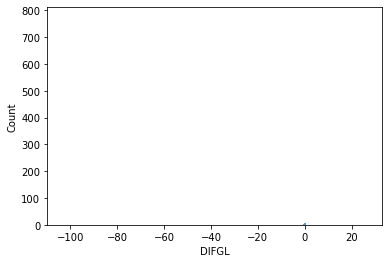

In [257]:
sea.histplot(data=relevant, x='DIFGL')

In [258]:
relevant.shape

(13124, 138)

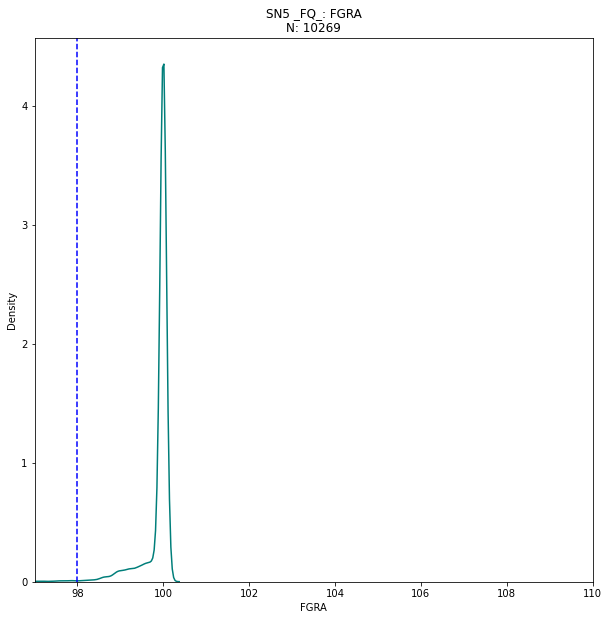

In [281]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'FGRA'
df=fso

kde=sea.kdeplot(data=df, x=grade,  common_norm=False, c=valecolor['VERDE'], alpha=.5, cut=0)

plt.axvline(98, color='blue', ls='--')

plt.xlim(97, 110)

kde.set_title(proj + ' _FQ_: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_FQ_KDE.jpeg', transparent=None)
plt.show()

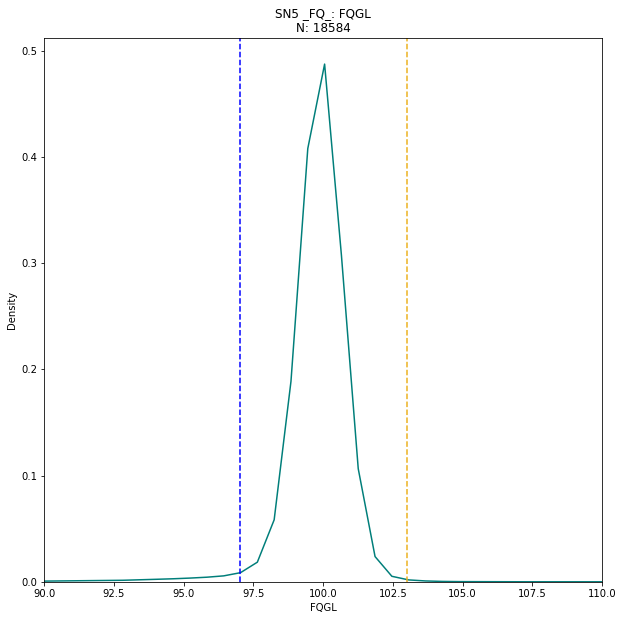

In [282]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'FQGL'
df=fso

kde=sea.kdeplot(data=df, x=grade,  common_norm=False, c=valecolor['VERDE'], alpha=.5, cut=0)

plt.axvline(97, color='blue', ls='--')
plt.axvline(103, c=valecolor['LARANJA'], ls='--')

plt.xlim(90, 110)

kde.set_title(proj + ' _FQ_: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_FQ_KDE.jpeg', transparent=None)
plt.show()

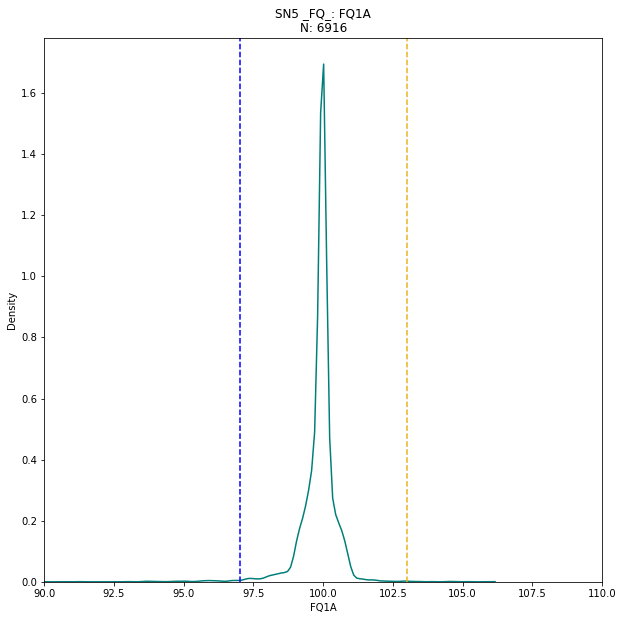

In [283]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'FQ1A'
df=fso

kde=sea.kdeplot(data=df, x=grade,  common_norm=False, c=valecolor['VERDE'], alpha=.5, cut=0)

plt.axvline(97, color='blue',ls='--')
plt.axvline(103, c=valecolor['LARANJA'], ls='--')

plt.xlim(90, 110)

kde.set_title(proj + ' _FQ_: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_FQ_KDE.jpeg', transparent=None)
plt.show()

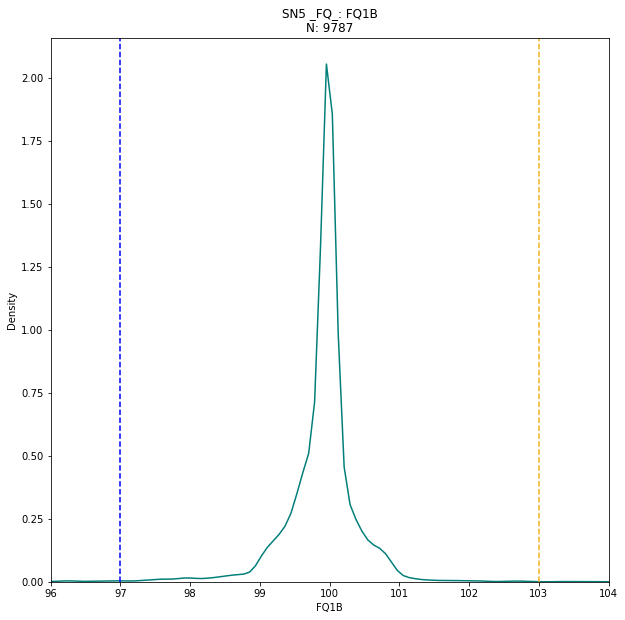

In [284]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'FQ1B'
df=fso

kde=sea.kdeplot(data=df, x=grade,  common_norm=False, c=valecolor['VERDE'], alpha=.5, cut=0)

plt.axvline(97, color='blue', ls='--')
plt.axvline(103, c=valecolor['LARANJA'],ls='--')
plt.xlim(96, 104)

kde.set_title(proj + ' _FQ_: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_FQ_KDE.jpeg', transparent=None)
plt.show()

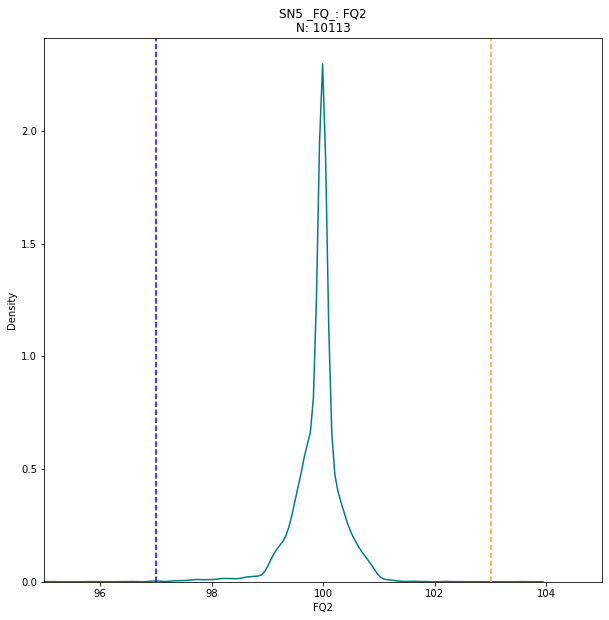

In [285]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'FQ2'
df=fso

kde=sea.kdeplot(data=df, x=grade,  common_norm=False, c=valecolor['VERDE'], alpha=.5, cut=0)

plt.axvline(97, color='blue',ls='--')
plt.axvline(103, c=valecolor['LARANJA'], ls='--')

plt.xlim(95, 105)

kde.set_title(proj + ' _FQ_: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_FQ_KDE.jpeg', transparent=None)
plt.show()

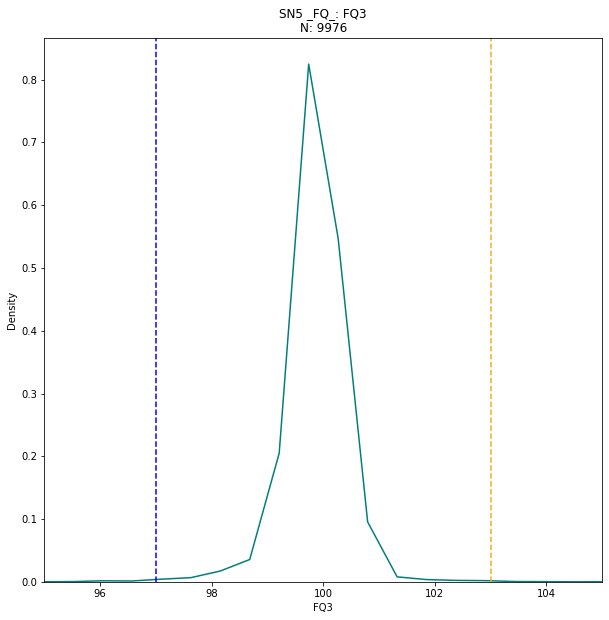

In [286]:
fig, ax = plt.subplots(figsize=chart_size)

grade = 'FQ3'

kde=sea.kdeplot(data=df, x=grade,  common_norm=False, c=valecolor['VERDE'], alpha=.5, cut=0)

plt.axvline(97, color='blue', ls='--')
plt.axvline(103, c=valecolor['LARANJA'], ls='--')

plt.xlim(95, 105)

kde.set_title(proj + ' _FQ_: '+ grade + '\nN: ' + str(df[grade].count()))
fig.savefig(proj + '_' + grade + '_FQ_KDE.jpeg', transparent=None)
plt.show()